# Evaluating CyRSoXS outputs

## Imports

In [1]:
# Imports:
import pathlib
import time
import subprocess
import io
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import open3d as o3d
import pandas as pd
import dask.array as da
from tqdm.notebook import tqdm
from scipy import optimize
from scipy.stats import skewnorm, norm, vonmises
import gc
from scipy.ndimage import gaussian_filter1d
import xarray as xr

# import PyHyperScattering as phs

# from NRSS.writer import write_materials
# from NRSS.morphology import Morphology, Material, OpticalConstants

In [2]:
# def make_para_perp_DAs(DS, sample_name, intensity_type, pol, qlims, chi_width):
#     # select dataarray to plot
#     DA = DS.sel(sample_name=sample_name)[f'{intensity_type}_intensity']
#     sliced_DA = DA.sel(polarization=pol, q=slice(qlims[0],qlims[1]))

#     # calculate ISI dataarrays
#     if pol==0:
#         para_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
#         perp_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))
#     elif pol==45:
#         para_DA = sliced_DA.rsoxs.slice_chi(-135, chi_width=(chi_width/2))
#         perp_DA = sliced_DA.rsoxs.slice_chi(135, chi_width=(chi_width/2))        
#     elif pol==90:
#         perp_DA = sliced_DA.rsoxs.slice_chi(180, chi_width=(chi_width/2))
#         para_DA = sliced_DA.rsoxs.slice_chi(90, chi_width=(chi_width/2))   
        
#     return para_DA, perp_DA

## Define paths

In [6]:
notebookPath = pathlib.Path.cwd()
outputsPath = notebookPath.joinpath('simple_fibril_sweeps_outputs')
# outputsPath = notebookPath.joinpath('multiple_fibril_sweeps_outputs')


In [4]:
# params_ID = 40
params_ID = 85
modelPath = sorted(outputsPath.glob(f'paramsID-{params_ID}_*'))[0]

# simPath = sorted(notebookPath.joinpath('multiple_fibril_sweeps_zarrs').glob(f'paramsID-{params_ID}_*'))[0]
simPath = sorted(notebookPath.joinpath('simple_fibril_sweeps_zarrs').glob(f'paramsID-{params_ID}_*'))[0]

display(modelPath)
display(simPath)

with modelPath.joinpath('args.json').open('r') as f:
    args = json.load(f)

display(args)

PosixPath('/projects/anle1278/nrss_simple_fibril_sweeps/simple_fibril_sweeps_outputs/paramsID-85_surface_S_flattening_afm_lat_scale')

PosixPath('/projects/anle1278/nrss_simple_fibril_sweeps/simple_fibril_sweeps_zarrs/paramsID-85_surface_S_flattening_afm_lat_scale_result_zarrs')

{'params_ID': 85,
 'sweep_params': ['surface_S', 'flattening', 'afm_lat_scale'],
 'sweep_params_values': [[0, 0.1],
  [0, 0.3, 0.6, 0.9],
  [1, 2, 3, 4, 5, 7.5, 10, 12.5]],
 'fibril_length': 400,
 'fibril_diam': 50,
 'fibril_roll': 0,
 'fibril_tilt': 80,
 'core_orientation': 'F',
 'core_orientation_std': 75,
 'core_S': 0,
 'core_vacuum_frac': 0.1,
 'voxel_size': 15.625,
 'ld': 256,
 'vd': 128,
 'fibril_center_ld': 128,
 'fibril_center_vd': 64,
 'matrix_vacuum_frac': 0.1,
 'EAngleRot': [0, 3, 360],
 'surface_theta': 60,
 'surface_psi': 'random',
 'surface_size': 50,
 'surface_S': 0,
 'roughness_ID': 1,
 'flattening': 0.9,
 'afm_lat_scale': 4,
 'oc_ID': 3,
 'energies': [265,
  270,
  275,
  278,
  280,
  281,
  282,
  282.2,
  282.4,
  282.6,
  282.8,
  283.0,
  283.2,
  283.4,
  283.6,
  283.8,
  284.0,
  284.2,
  284.4,
  284.6,
  284.8,
  285.0,
  285.2,
  285.4,
  285.6,
  285.8,
  286.0,
  286.2,
  286.4,
  286.6,
  286.8,
  287.0,
  287.2,
  287.4,
  287.6,
  287.8,
  288.0,
  288.

In [5]:
# updated_fname_list = modelPath.stem.split('_')
# # updated_fname_list.insert(1,'PM6_oc_2023C3')
# updated_fname = '_'.join(updated_fname_list)
# updated_fname

In [81]:
plotsPath = outputsPath.joinpath(modelPath.stem + '_result_plots')
plotsPath.mkdir(exist_ok=True)

# Paths for auto-summary slides later!
moviesPath = plotsPath.joinpath('detector_movies_v1')
IMapsPath = plotsPath.joinpath('I_maps_v1')
ICutsPath = plotsPath.joinpath('I_cuts_v1')
arMapsPath = plotsPath.joinpath('ar_maps_v2')
arCutsPath = plotsPath.joinpath('ar_cuts_v1')
ISIsPath = plotsPath.joinpath('ISIs_v2')
IvQcomparisonsPath = plotsPath.joinpath('IvQcomparisons_v2')
AvQcomparisonsPath = plotsPath.joinpath('AvQcomparisons_v2')
for path in [moviesPath, IMapsPath, ICutsPath, arMapsPath, arCutsPath, ISIsPath, IvQcomparisonsPath, AvQcomparisonsPath]:
    path.mkdir(exist_ok=True)

In [ ]:
# def convert_dataset_vars_to_dims(ds, dim_keys):
#     """
#     Convert Dataset with variable names like 'fibril_tilt-10_fibril_length-200'
#     into a stacked DataArray using native string parsing.

#     Parameters:
#     - ds: xarray.Dataset
#     - dim_keys: list of str, e.g., ['fibril_tilt', 'fibril_length']

#     Returns:
#     - xarray.DataArray with new dimensions (dim_keys..., original_dims...)
#     """
#     all_entries = []
#     coords_set = {k: set() for k in dim_keys}

#     for varname, da in ds.data_vars.items():
#         dims = {}
#         for key in dim_keys:
#             key_pattern = f"{key}-"
#             start = varname.find(key_pattern)
#             if start != -1:
#                 start += len(key_pattern)
#                 end = varname.find('_', start)
#                 if end == -1:
#                     end = len(varname)
#                 val = int(varname[start:end])
#                 dims[key] = val
#                 coords_set[key].add(val)
                
#         DA = da.expand_dims({k: [v] for k, v in dims.items()})
#         DA.name = 'combined'
#         all_entries.append(DA)
    
#     final_DA = xr.combine_by_coords(all_entries)['combined']

#     return final_DA


In [ ]:
# sorted([f.name for f in simPath.glob('*recip*')])

## Load parameter sweep datasets

In [82]:
q_slice = slice(0.008,0.1)

cy_recip_DSs = []
for cy_recip_zarr in sorted(simPath.glob('*recip*')):
    cy_recip_DSs.append(xr.open_zarr(cy_recip_zarr))
    
cy_recip_DS = xr.merge(cy_recip_DSs)

# Convert 1/nm to 1/Å
cy_recip_DS['qy'] = cy_recip_DS.qy / 10
cy_recip_DS['qx'] = cy_recip_DS.qx / 10

cy_caked_DSs = []
for cy_caked_zarr in sorted(simPath.glob('*caked*')):
    cy_caked_DSs.append(xr.open_zarr(cy_caked_zarr))
    
cy_caked_DS = xr.merge(cy_caked_DSs)

# Convert 1/nm to 1/Å
cy_caked_DS['q'] = cy_caked_DS.q / 10

display(cy_recip_DS)
display(cy_caked_DS)

<xarray.Dataset> Size: 144MB
Dimensions:                                            (energy: 61, qy: 256,
                                                        qx: 256)
Coordinates:
  * energy                                             (energy) float64 488B ...
  * qx                                                 (qx) float64 2kB -0.20...
  * qy                                                 (qy) float64 2kB -0.20...
Data variables:
    fibril_amount-0.1_multi_length-[1200, 1200]_cores  (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.1_multi_length-[600, 1200]_cores   (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.1_multi_length-[600, 600]_cores    (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.2_multi_length-[1200, 1200]_cores  (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.2_multi_length-[600, 1200]_cores   (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.2_multi_length-[600, 600]_cores    (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.3_multi_length-[1200, 1200]_cores  (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.3_multi_length-[600, 1200]_cores   (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>
    fibril_amount-0.3_multi_length-[600, 600]_cores    (energy, qy, qx) float32 16MB dask.array<chunksize=(16, 64, 128), meta=np.ndarray>

<xarray.Dataset> Size: 144MB
Dimensions:                                            (chi: 360, energy: 61,
                                                        q: 182)
Coordinates:
  * chi                                                (chi) float64 3kB -179...
  * energy                                             (energy) float64 488B ...
  * q                                                  (q) float64 1kB 0.0 .....
Data variables:
    fibril_amount-0.1_multi_length-[1200, 1200]_cores  (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.1_multi_length-[600, 1200]_cores   (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.1_multi_length-[600, 600]_cores    (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.2_multi_length-[1200, 1200]_cores  (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.2_multi_length-[600, 1200]_cores   (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.2_multi_length-[600, 600]_cores    (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.3_multi_length-[1200, 1200]_cores  (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.3_multi_length-[600, 1200]_cores   (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>
    fibril_amount-0.3_multi_length-[600, 600]_cores    (energy, chi, q) float32 16MB dask.array<chunksize=(16, 90, 91), meta=np.ndarray>

In [23]:
# cy_recip_DA = convert_dataset_vars_to_dims(cy_recip_DS, ['fibril_length', 'fibril_diam', 'fibril_tilt'])
# cy_caked_DA = convert_dataset_vars_to_dims(cy_caked_DS, ['fibril_length', 'fibril_diam', 'fibril_tilt'])

# display(cy_caked_DA)

In [24]:
# cy_recip_DS['average'] = cy_recip_DS.to_dataarray().mean('variable')
# cy_caked_DS['average'] = cy_caked_DS.to_dataarray().mean('variable')

## Plots for auto-summary of parameter sweep

In [83]:
cmap='turbo'
# q_slice = slice(0.009, 0.08)
q_slice = slice(0.008, 0.1)
chi_width = 60
# e_slice = slice(282, 292)
e_slice = slice(278, 294)
# e_slice = slice(270, 300)

### I Maps

In [ ]:
# Select polar dataset, to I cuts, individual polarizations
# e_slice = slice(None, None)

# for sample_name in tqdm(filtered_selected_samples):
for data_var in tqdm(cy_caked_DS.data_vars):
    DA = cy_caked_DS[data_var].compute()

    para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
    
    # Plot
    fig, axs = plt.subplots(1, 2, figsize=(11,5))

    para_slice = para_DA.mean('chi').sel(q=q_slice, energy=e_slice)  # .plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
    perp_slice = perp_DA.mean('chi').sel(q=q_slice, energy=e_slice)  # .plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)

    cmin = perp_slice.compute().quantile(0.01)
    cmax = para_slice.compute().quantile(0.999)

    para_slice.plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
    perp_slice.plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)

    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(cmin, cmax)) # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
    cax = axs[1].inset_axes([1.03, 0, 0.05, 1])
    cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
    cbar.set_label(label='Intensity [arb. units]', labelpad=12, rotation=270)

    fig.suptitle(f'Linecut Maps: {data_var}', fontsize=14)

    fig.set(tight_layout=True)

    axs[0].set(xscale='log', title='Parallel to $E_p$', ylabel='Photon energy [eV]', xlabel='q [$Å^{-1}$]')
    axs[1].set(xscale='log', title='Perpendicular to $E_p$ ', ylabel=None, xlabel='q [$Å^{-1}$]')

    fig.savefig(IMapsPath.joinpath(f'{data_var}_energy{e_slice.start}-{e_slice.stop}.png'), dpi=120)

    # plt.show()
    plt.close('all')

### I Cuts

In [ ]:
# for data_var in tqdm(cy_caked_DS.data_vars):
#     DA = cy_caked_DS[data_var].compute()

#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
        
#     # Plot
#     energies = para_DA.energy.sel(energy=[265, 275, 283, 284, 284.4, 284.8, 285.2, 285.6, 286.2, 287, 300, 340], method='nearest').data

#     cmap = plt.cm.turbo.copy()
#     colors = cmap(np.linspace(0, 1, len(energies)))

#     fig, axs = plt.subplots(ncols=2,figsize=(8,5), tight_layout=True)

#     for j, energy in enumerate(energies):
#         ((para_DA.sel(q=q_slice, energy=energy).mean('chi') * 1e10)
#          .plot.line(ax=axs[0], color=colors[j], yscale='log', xscale='log', label=energy))
#         ((perp_DA.sel(q=q_slice, energy=energy).mean('chi') * 1e10)
#          .plot.line(ax=axs[1], color=colors[j], yscale='log', xscale='log', label=energy))

#     fig.suptitle(f'IvsQ, {data_var}', x=0.47)

#     axs[0].set(title=f'Parallel to E$_p$', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
#     axs[1].set(title=f'Perpendicular to E$_p$', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
#     axs[1].legend(title='Energy [eV]', loc=(1.05,0.1))

#     for ax in axs:
#         ax.grid(axis='y')
#         ax.grid(axis='x', which='both')
        
#     fig.savefig(ICutsPath.joinpath(f'{data_var}.png'), dpi=120)

#     # plt.show()
    
#     plt.close('all')

### AR Maps

In [ ]:
# # e_slice=slice(None,None)
# # e_slice = slice(282, 292)

# for data_var in tqdm(cy_caked_DS.data_vars):
#     DA = cy_caked_DS[data_var].compute().sel(q=q_slice)

#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     # Select AR data
#     ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

#     # Plot
#     vlim = 1.0
#     ax = ar_DA.sel(q=q_slice, energy=e_slice).plot.pcolormesh(figsize=(8,5), norm=plt.Normalize(-vlim, vlim), cmap='seismic')

#     ax.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
#     ax.axes.set(title=f'{data_var}', ylabel='Photon Energy [eV]', xlabel='q [$Å^{-1}$]', xscale='log')
#     ax.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)

#     ax.figure.savefig(arMapsPath.joinpath(f'{data_var}_energy{e_slice.start}-{e_slice.stop}.png'), dpi=120)

#     plt.show()
    
#     plt.close('all')

  0%|          | 0/9 [00:00<?, ?it/s]

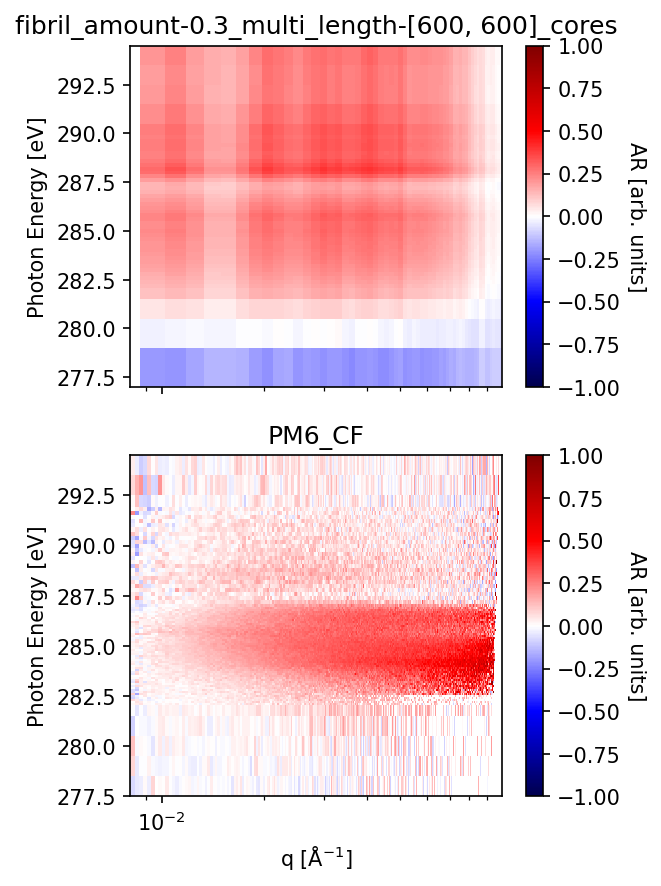

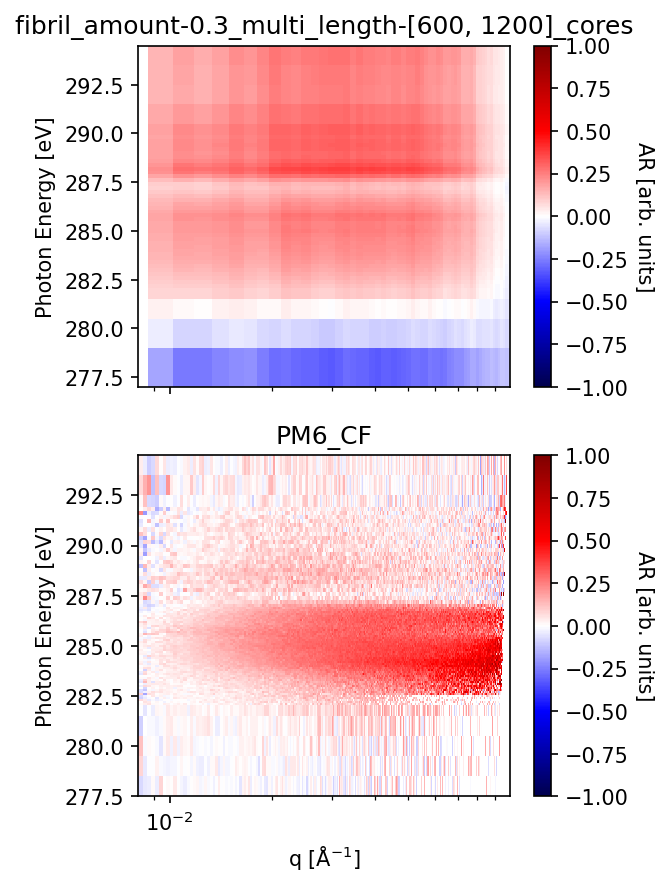

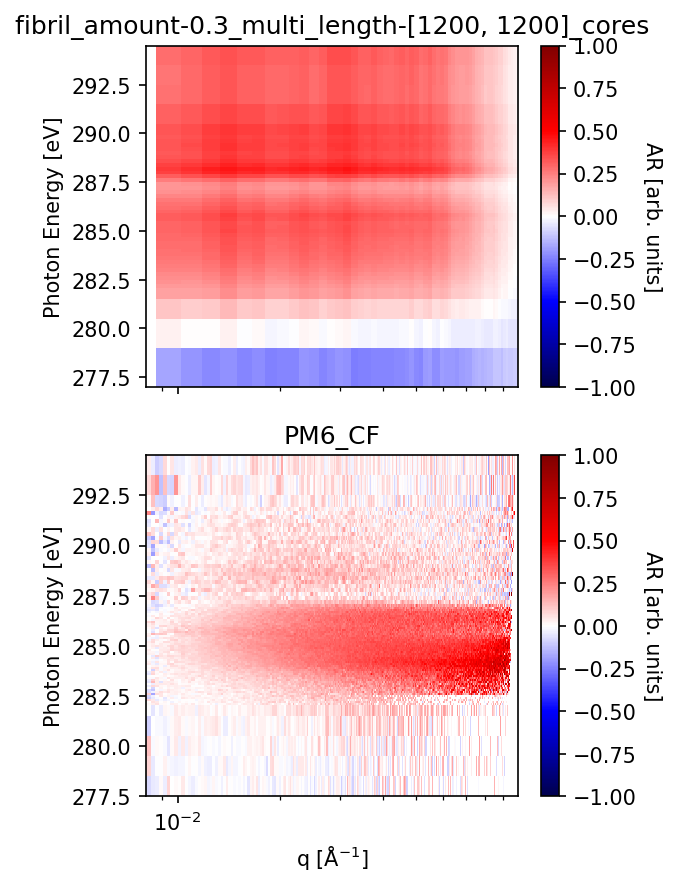

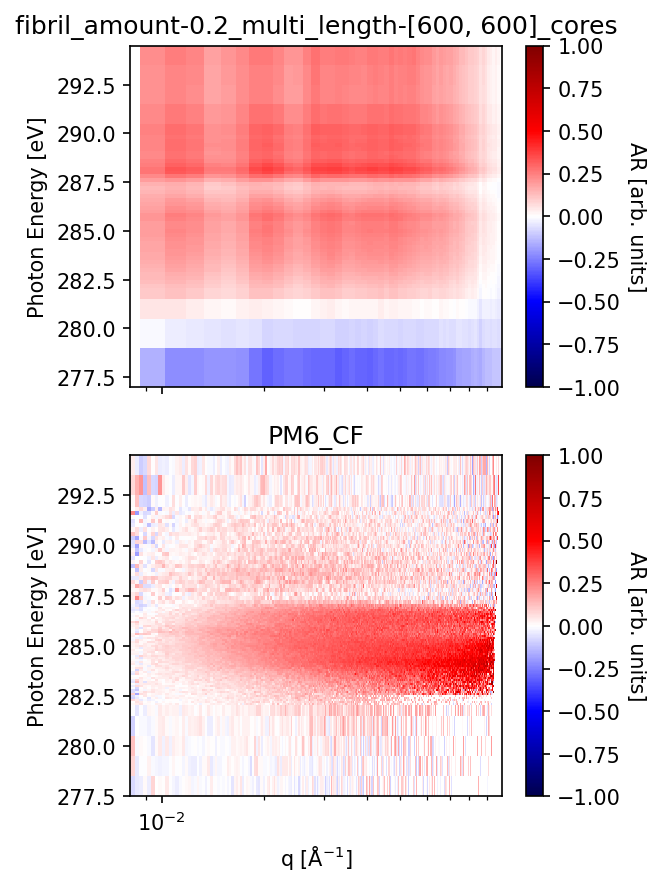

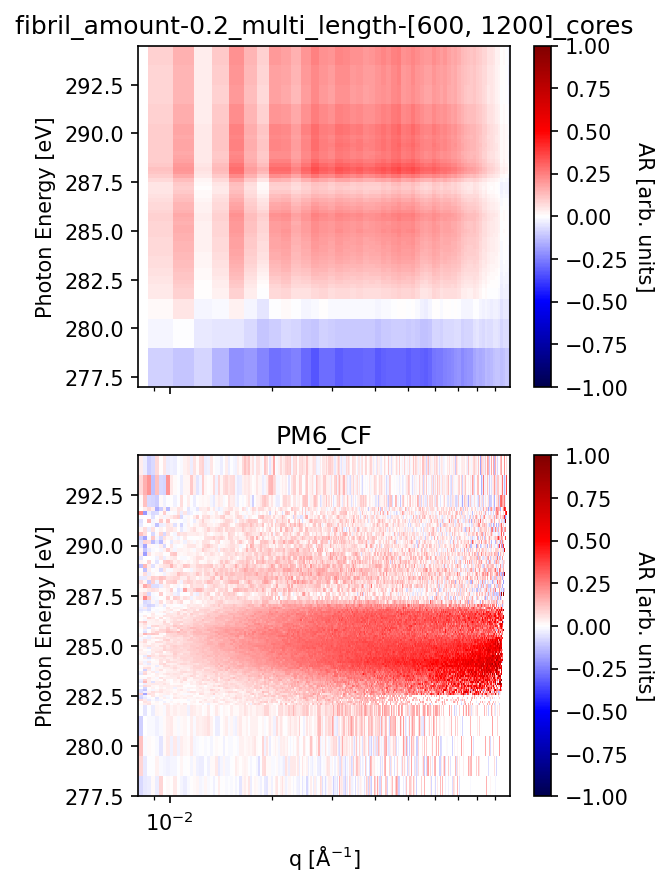

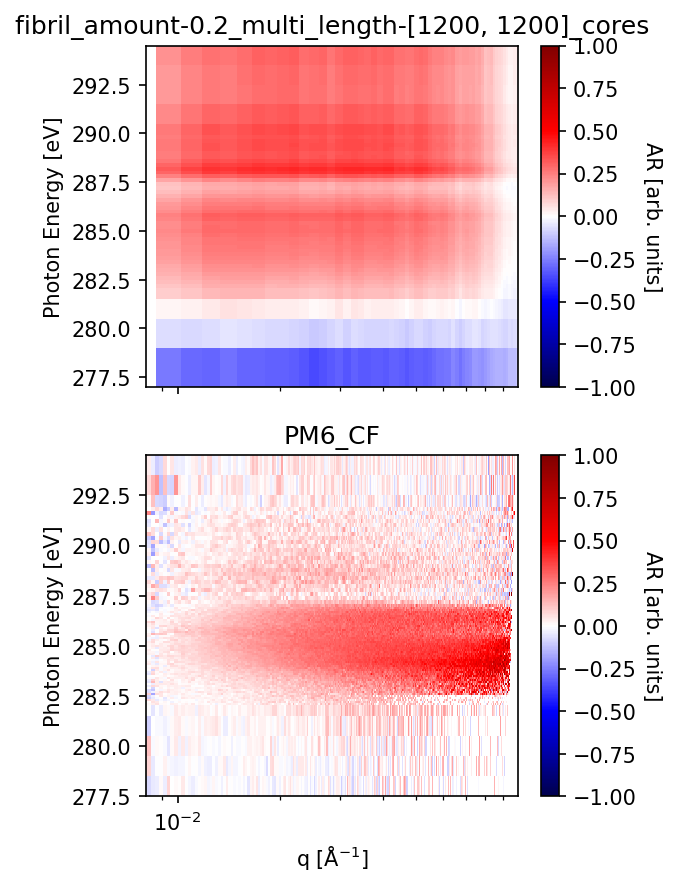

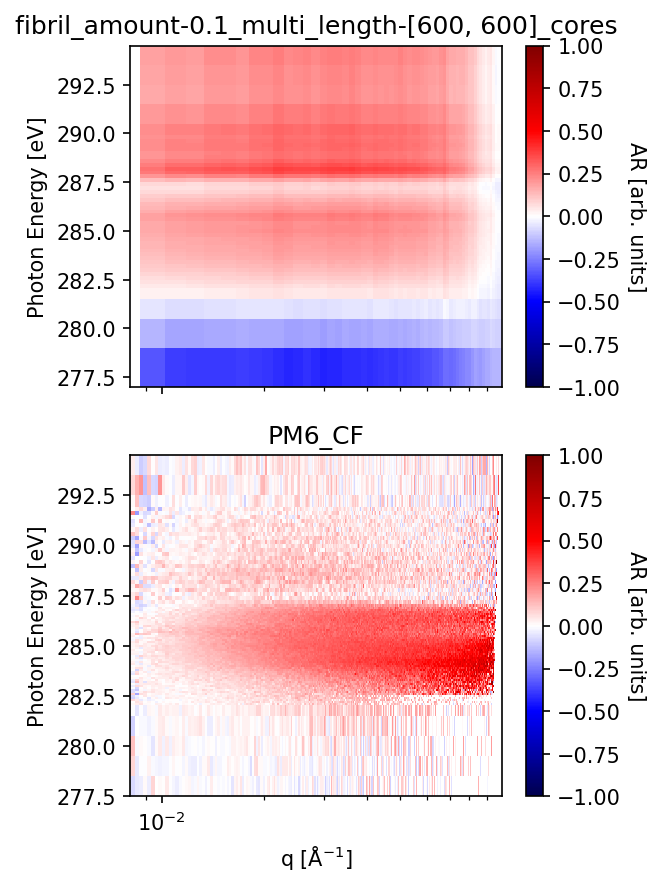

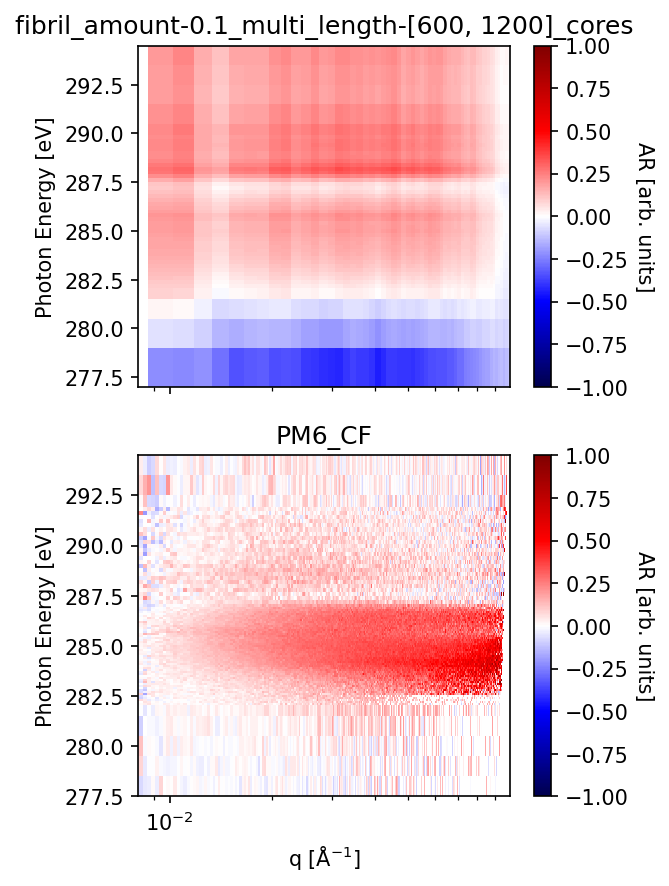

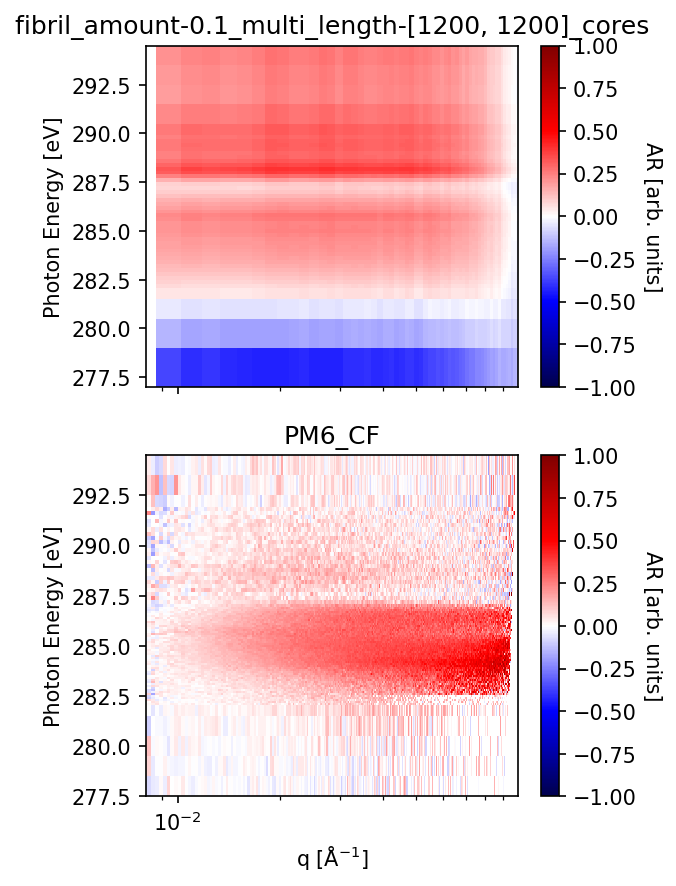

In [84]:
# e_slice=slice(None,None)
e_slice = slice(278, 294)


for data_var in tqdm(list(cy_caked_DS.data_vars)[::-1]):
    fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(4, 6.5), dpi=150)

    DA = cy_caked_DS[data_var].compute().sel(q=q_slice)

    para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

    # Select AR data
    ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

    # Plot
    vlim = 1.0
    im = ar_DA.sel(q=q_slice, energy=e_slice).plot.pcolormesh(ax=axs[0], norm=plt.Normalize(-vlim, vlim), cmap='seismic')

    sample_name='PM6_CF'
    re_DA = re_caked_DS['corr_intensity'].sel(sample_name=sample_name)
    re_para_DA, re_perp_DA, fl_corr_DA = make_para_perp_DAs(re_DA, 0.9)
    re_ar_DA = (re_para_DA.mean('chi') - re_perp_DA.mean('chi')) / (re_para_DA.mean('chi') + re_perp_DA.mean('chi'))

    # Thresholding for bad values
    re_ar_DA = re_ar_DA.where(re_ar_DA<1)    
    re_ar_DA = re_ar_DA.where(re_ar_DA>-0.2)
    re_ar_DA.loc[{'energy':slice(None,282.5)}] = re_ar_DA.sel(energy=slice(None,282.5)).where(re_ar_DA<0.2)
    re_ar_DA.loc[{'energy':slice(None,282.5)}] = re_ar_DA.sel(energy=slice(None,282.5)).where(re_ar_DA>-0.1)
    
    re_im = re_ar_DA.sel(q=q_slice, energy=e_slice).plot.pcolormesh(ax=axs[1], norm=plt.Normalize(-vlim, vlim), cmap='seismic')

    # a.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
    axs[0].set(title=f'{data_var}', ylabel='Photon Energy [eV]', xlabel='', xscale='log')
    axs[1].set(title=f'{sample_name}', ylabel='Photon Energy [eV]', xlabel='q [Å$^{-1}$]', xscale='log')
    im.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)
    re_im.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)

    fig.savefig(arMapsPath.joinpath(f'{data_var}_energy{e_slice.start}-{e_slice.stop}.png'), dpi=150, bbox_inches='tight')

    plt.show()
    
    plt.close('all')

### AR Cuts

In [ ]:
# for data_var in tqdm(cy_caked_DS.data_vars):
#     DA = cy_caked_DS[data_var].compute().sel(q=q_slice)

#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     # Select AR data
#     ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

#     # Plot   
#     energies = para_DA.energy.sel(energy=[265, 275, 283, 284, 284.4, 284.8, 285.2, 285.6, 286.2, 287, 300, 340], method='nearest').data
#     cmap = plt.cm.turbo.copy()
#     colors = cmap(np.linspace(0, 1, len(energies)))        

#     fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=120)

#     for j, energy in enumerate(energies):
#         (ar_DA.sel(energy=energy).plot.line(ax=ax, color=colors[j], label=energy, xscale='log'))

#     fig.suptitle(f'Anisotropy Ratio Linecuts: {data_var}', x=0.46, y=0.95)

#     ax.set(title=f'{data_var}', ylim=(-1, 1), ylabel='AR [no units]', xlabel='Q [$Å^{-1}$]')
#     ax.grid(axis='y')
#     ax.grid(axis='x', which='both')
#     ax.legend(title='Energy [eV]', loc=(1.03,0.02))

#     # fig.savefig(arCutsPath.joinpath(f'{data_var}.png'), dpi=120)

#     plt.show()
#     plt.close('all')

### ISIs

In [ ]:
# # e_slice=slice(None,None)
# # e_slice=slice(282,294)

# for data_var in tqdm(cy_caked_DS.data_vars):
#     DA = cy_caked_DS[data_var].compute().sel(q=q_slice)

#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     # slice ISI data
#     para_ISI = para_DA.mean('chi').integrate('q')
#     perp_ISI = perp_DA.mean('chi').integrate('q')

#     # plot
#     fig, ax = plt.subplots(figsize=(6,4), dpi=120)
#     ax.xaxis.set_minor_locator(MultipleLocator(1))

#     para_ISI.sel(energy=e_slice).plot.line(ax=ax, label='$\parallel$', yscale='log')
#     perp_ISI.sel(energy=e_slice).plot.line(ax=ax, label='$\perp$', yscale='log')
#     fig.suptitle(f'ISI: {data_var}', fontsize=14, x=0.55)
#     ax.set(title=f'{data_var}', 
#            xlabel='X-ray energy [eV]', ylabel='Intensity [arb. units]')
#     ax.legend(loc='upper right', fontsize=14)
#     ax.grid(axis='x', which='both')
#     plt.subplots_adjust(top=0.86, bottom=0.2, left=0.2)
        
#     fig.savefig(ISIsPath.joinpath(f'{data_var}.png'), dpi=120)

#     plt.show()
#     plt.close('all')

In [ ]:
sorted(cy_caked_DS.data_vars)[:]

  0%|          | 0/9 [00:00<?, ?it/s]

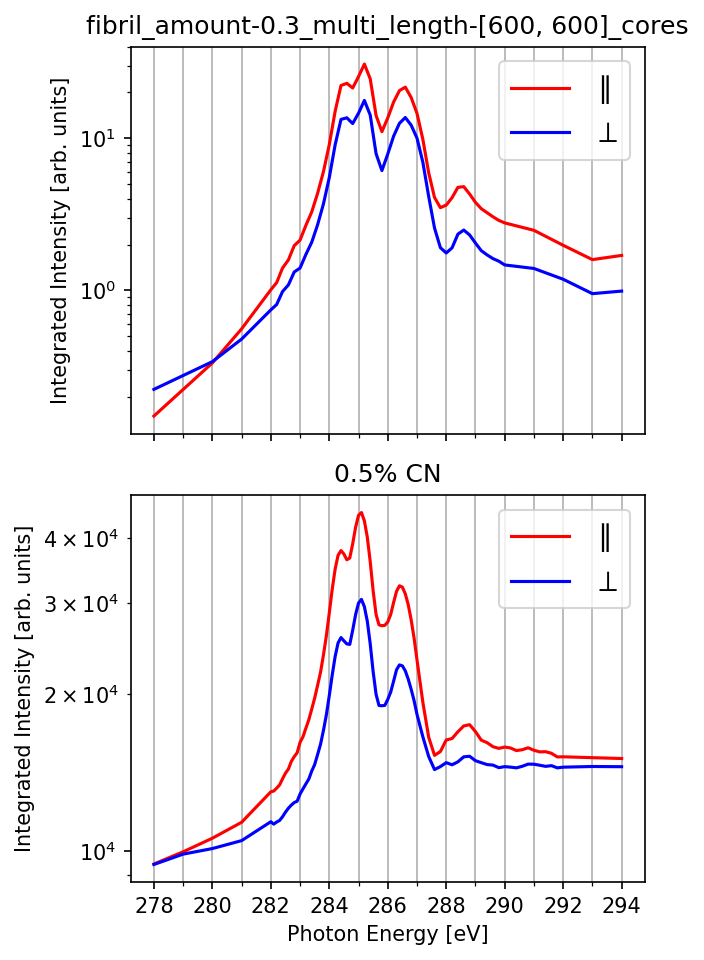

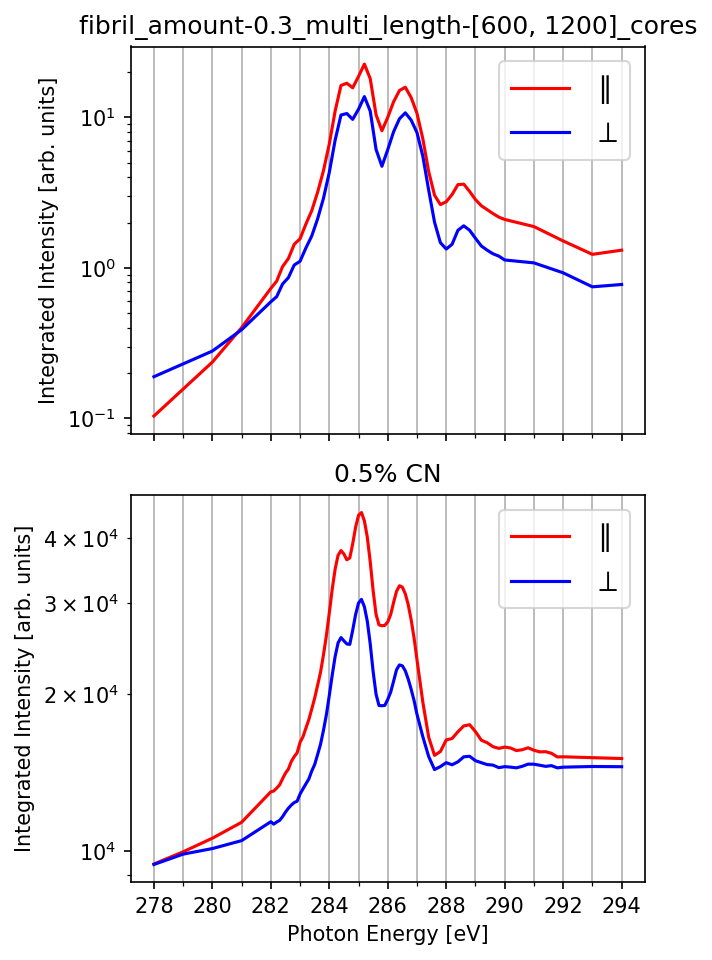

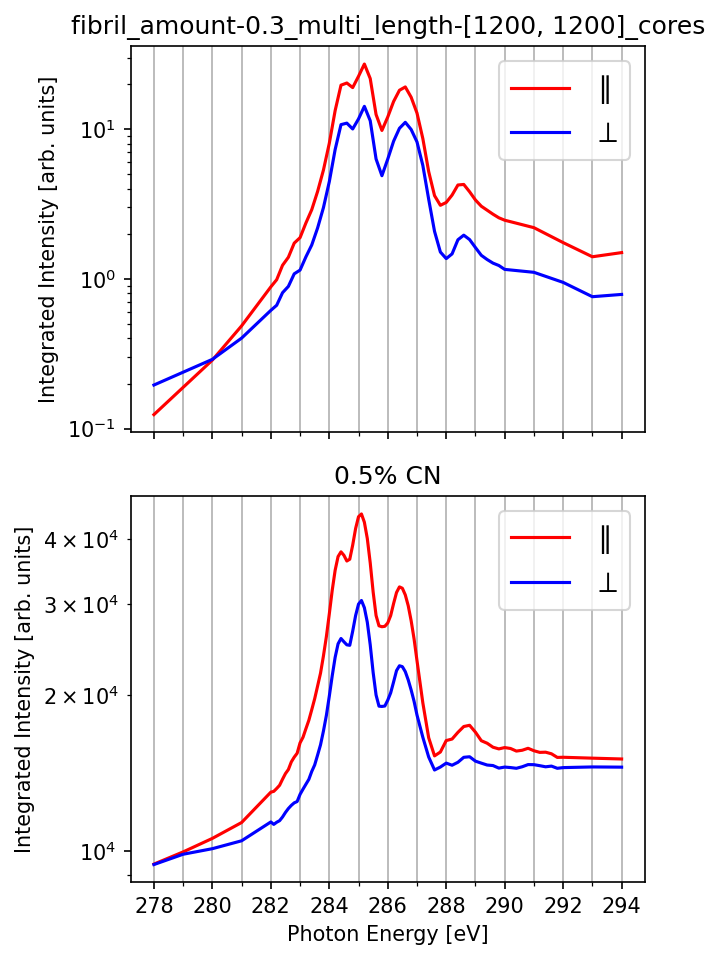

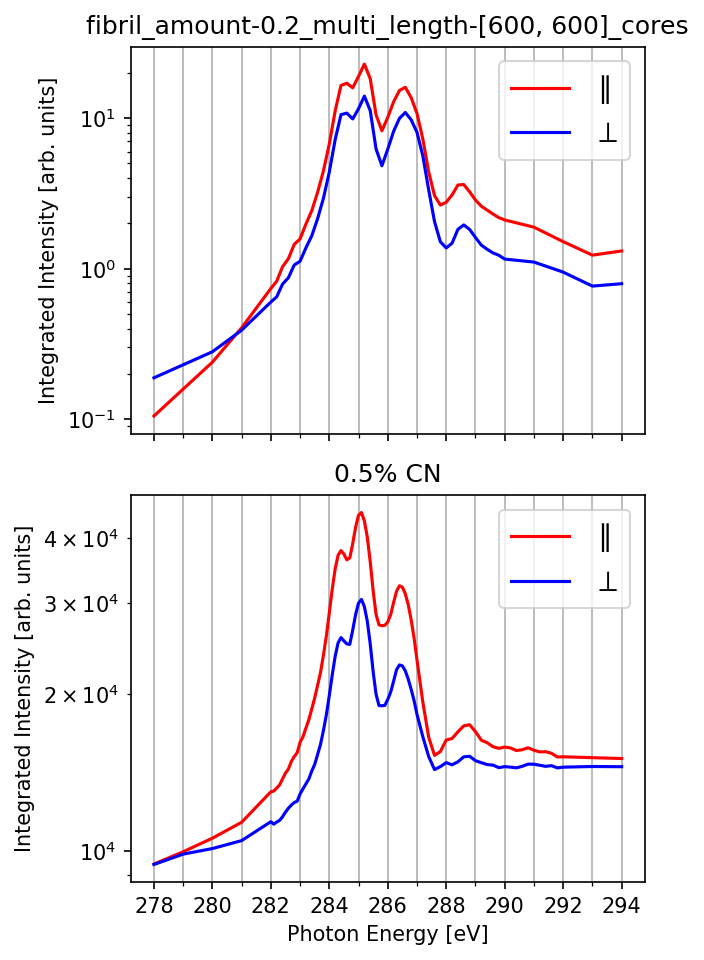

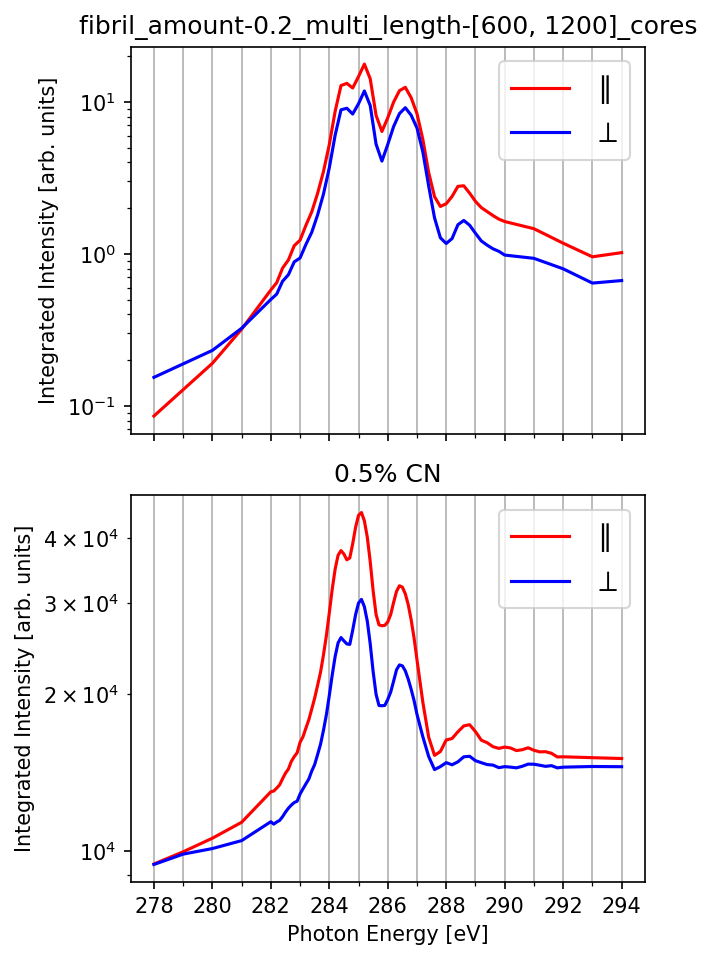

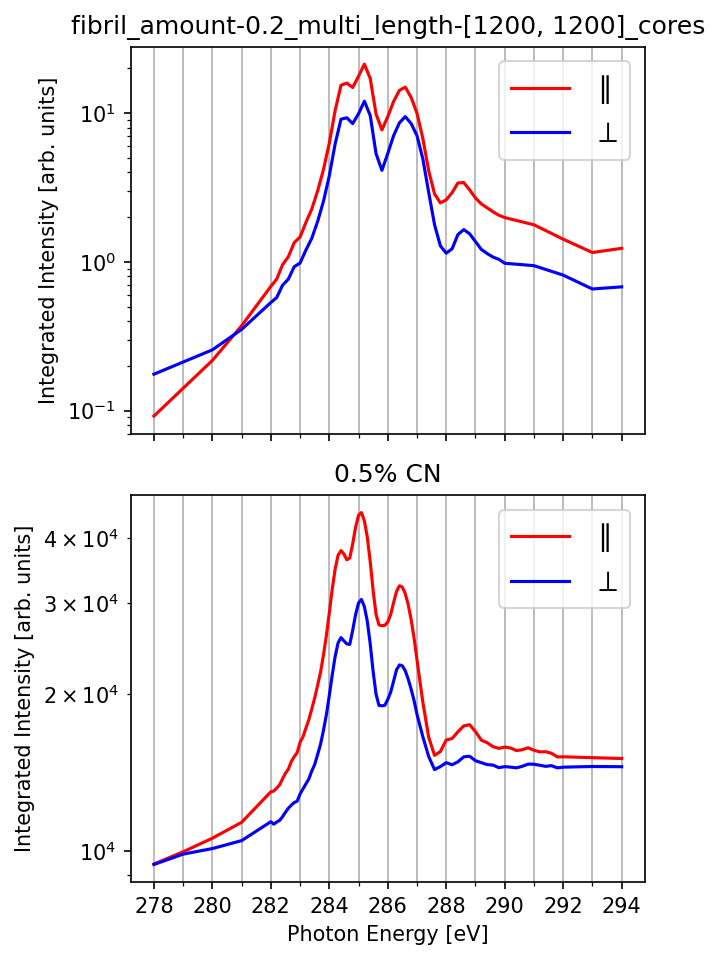

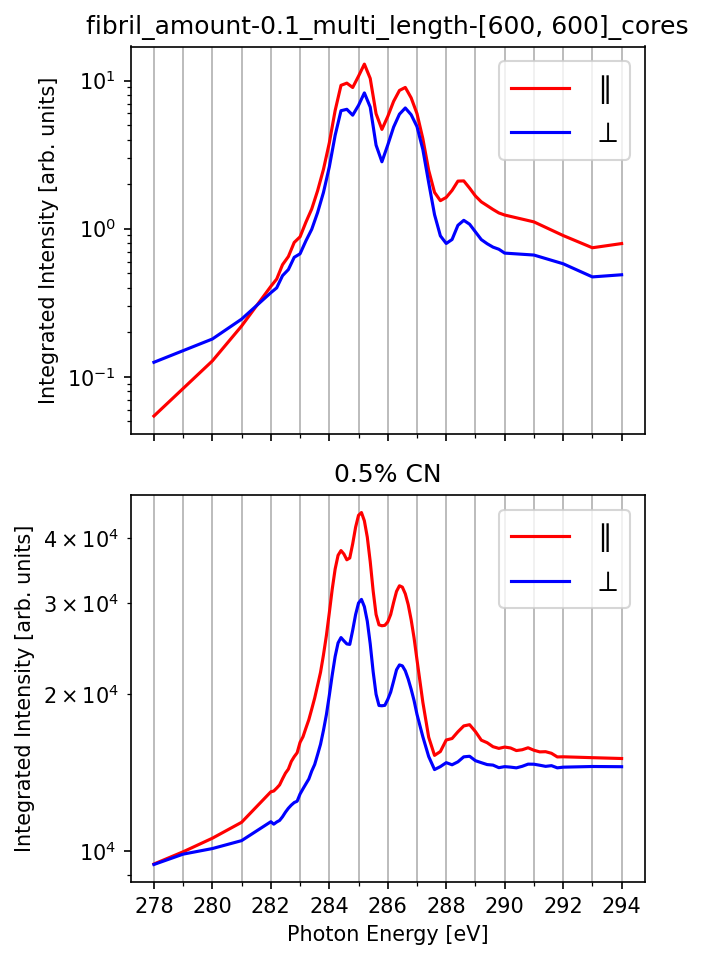

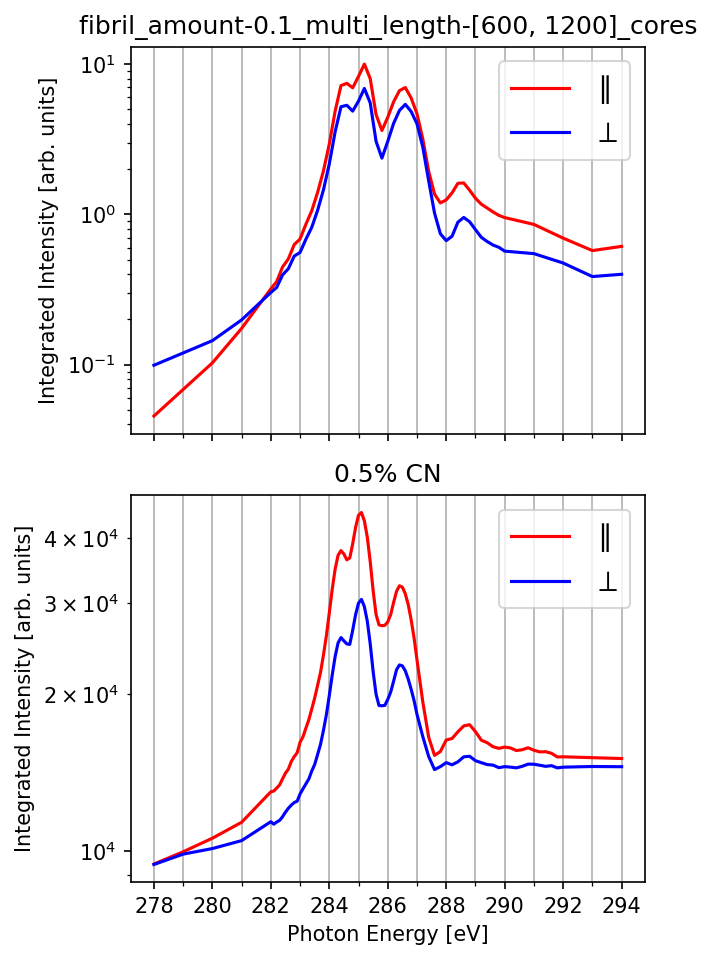

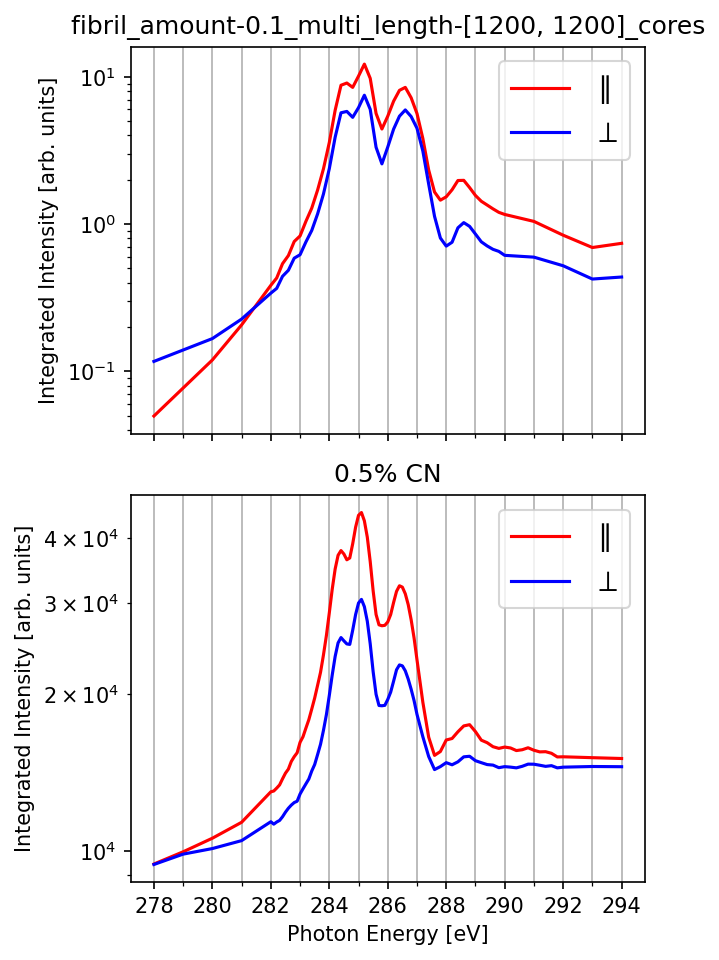

In [85]:
%matplotlib inline
plt.close('all')
# q_slice = slice(0.008, 0.1)
# q_slice = slice(0.015, 0.09)
q_slice = slice(0.02, 0.07)
# e_slice=slice(None,None)
# e_slice=slice(282,294)

sn = {'PM6_CF': '0.0% CN',
      'PM6_p5CN-CF': '0.5% CN', 
      'PM6_1CN-CF': '1.0% CN', 
      'PM6_5CN-CF': '5.0% CN'}
# sample_names = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
sample_names = ['PM6_p5CN-CF']
sample_colors = plt.cm.GnBu(np.linspace(0.2,1,len(sample_names)))

for data_var in tqdm(sorted(cy_caked_DS.data_vars)[::-1]):
    # fig2, ax2 = plt.subplots(figsize=(4.7,3),dpi=150,tight_layout=True)
    for i, sample_name in enumerate(sample_names):
        DA = cy_caked_DS[data_var].compute().sel(q=q_slice)
    
        para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
        perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

        cy_fl_corr_DA = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * 0.9
    
        # slice ISI data
        para_ISI = para_DA.mean('chi').mean('q')
        perp_ISI = perp_DA.mean('chi').mean('q')
    
        # plot
        fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(4.5,6.5), dpi=150, sharex=True, tight_layout=True)
        # fig2, ax2 = plt.subplots(figsize=(4.7,3),dpi=150,tight_layout=True)

        para_ISI = para_ISI + 2e-3
        perp_ISI = perp_ISI + 2e-3

        para_ISI.sel(energy=e_slice).plot.line(ax=axs[0], color='r', label='$\parallel$', yscale='log')
        perp_ISI.sel(energy=e_slice).plot.line(ax=axs[0], color='b', label='$\perp$', yscale='log')
    
        re_DA = re_caked_DS['corr_intensity'].sel(sample_name=sample_name)
        re_para_DA, re_perp_DA, fl_corr_DA = make_para_perp_DAs(re_DA, 0.9)
        re_para_ISI = np.sqrt(re_para_DA.sel(q=q_slice).mean('chi').mean('q'))
        re_perp_ISI = np.sqrt(re_perp_DA.sel(q=q_slice).mean('chi').mean('q'))    
        
        re_para_ISI.sel(energy=e_slice).plot.line(ax=axs[1], color='r', label='$\parallel$', yscale='log')
        re_perp_ISI.sel(energy=e_slice).plot.line(ax=axs[1], color='b', label='$\perp$', yscale='log')
        
    
        axs[0].set(title=f'{data_var}', ylabel='Integrated Intensity [arb. units]', xlabel='')
        # axs[0].set(ylim=(2e-2,None))
        axs[1].set(title=f'{sn[sample_name]}', ylabel='Integrated Intensity [arb. units]', xlabel='Photon Energy [eV]')
        
        for ax in axs:
            ax.xaxis.set_major_locator(MultipleLocator(2))
            ax.xaxis.set_minor_locator(MultipleLocator(1))
            ax.legend(loc='upper right', fontsize=14)
            ax.grid(axis='x', which='both')
            
        # plt.subplots_adjust(top=0.86, bottom=0.2, left=0.2)
            
        fig.savefig(ISIsPath.joinpath(f'{data_var}_vs_{sample_name}_q-{q_slice.start}-{q_slice.stop}.png'), dpi=150, bbox_inches='tight')
    
        plt.show()
        plt.close('all')
    
        # fl_corr_DA.sel(energy=slice(282,291)).plot(ax=ax2, color=plt.cm.plasma(np.linspace(0,1,3))[0])
        # fl_corr_DA.sel(energy=slice(282,291)).plot(ax=ax2, label=f'{sn[sample_name]}', color=sample_colors[i])

    
    # ax2.set(title='',ylabel='Subtracted Fl. Signal [arb. units]', xlabel='Photon Energy [eV]', yscale='log')
    # ax2.xaxis.set_minor_locator(MultipleLocator(1))
    # ax2.grid(axis='x', which='both')
    # ax2.legend(title='$θ = 90°$')
        
    # plt.show()
    
        
    # plt.close('all')

In [ ]:
# cy_fl_corr_DA.sel(energy=slice(278,294)).plot(yscale='log')
# plt.show()

### Detector movies

In [ ]:
# Parameters
energy = 285.2

for data_var in cy_recip_DS.data_vars:
    DA = cy_recip_DS[data_var]

    # Make & customize plot
    sliced_DA = DA.sel(qx=slice(-q_slice.stop, q_slice.stop), qy=slice(-q_slice.stop, q_slice.stop)).sel(energy=energy, method='nearest').compute()

    cmin = float(sliced_DA.sel(qx=slice(0.01,None)).quantile(0.03))
    # cmin = 1e-4
    cmax = float(sliced_DA.sel(qx=slice(0.01,None)).quantile(1))
    
    ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), cmap=cmap, norm=LogNorm(cmin,cmax))
    ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
    ax.figure.set_tight_layout(True)   
    ax.axes.set(aspect='equal', title=f'{data_var}', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
    ax.colorbar.set_label('Raw Intensity [arb. units]', rotation=270, labelpad=12)

    plt.show()
    plt.close('all')

In [ ]:
for data_var in tqdm(cy_recip_DS.data_vars):
    DA = cy_recip_DS[data_var].compute()

    output_path = moviesPath.joinpath(f'{data_var}.mp4')

    # FFmpeg command. This is set up to accept data from the pipe and use it as input, with PNG format.
    # It will then output an H.264 encoded MP4 video.
    cmd = [
        '/curc/sw/ffmpeg/4.4/bin/ffmpeg',
        '-y',  # Overwrite output file if it exists
        '-f', 'image2pipe',
        '-vcodec', 'png',
        '-r', '16',  # Frame rate
        '-i', '-',  # The input comes from a pipe
        '-vcodec', 'libx264',
        '-pix_fmt', 'yuv420p',
        '-crf', '22',  # Set the quality (lower is better, 17 is often considered visually lossless)
        str(output_path)
    ]

    # Start the subprocess
    proc = subprocess.Popen(cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

    cmin, cmax = DA.sel(qx=slice(0.01,None)).sel(energy=285.2, method='nearest').quantile([0.03, 1])
    
    # Loop through the energy dimension and send frames to FFmpeg
    for i, energy in enumerate(tqdm(DA.energy.values, desc=f'Making the {data_var} movie')):
        # Make & customize plot
        sliced_DA = DA.sel(qx=slice(-q_slice.stop, q_slice.stop), qy=slice(-q_slice.stop, q_slice.stop)).sel(energy=energy, method='nearest').compute()
        
        ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), cmap=cmap, norm=LogNorm(cmin,cmax))
        ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
        ax.figure.set_tight_layout(True)   
        ax.axes.set(aspect='equal', title=f'{data_var}', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
        ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=12)

        # Save first frame (or specific energy value)
        if energy == 285.2:
            ax.figure.savefig(moviesPath.joinpath(f'{data_var}.png'), dpi=120)

        buf = io.BytesIO()
        ax.figure.savefig(buf, format='png')
        buf.seek(0)

        # Write the PNG buffer data to the process
        proc.stdin.write(buf.getvalue())
        plt.close('all')

    # Finish the subprocess
    out, err = proc.communicate()
    if proc.returncode != 0:
        print(f"Error: {err}")
        
    gc.collect()  # try to clear up some memory...


### Compare with experimental data

#### Load solution SAXS

In [32]:
saxsPath = pathlib.Path('/projects/anle1278/for_PM6_fibrils/solution_saxs')

In [33]:
saxs_arrs = {}

for f in sorted(saxsPath.glob('*')):
    # print('_'.join(f.name.split('_')[:2]))
    var_name = '_'.join(f.name.split('_')[:2])
    saxs_arrs[var_name] = np.loadtxt(f)

saxs_arrs.keys()

dict_keys(['PM6_CB', 'PM6_CF', 'PM6_CN', 'PM7_CB', 'PM7_CF', 'PM7_CN'])

In [34]:
# Load data into dict of numpy arrays
saxs_arrs = {}

for f in sorted(saxsPath.glob('*')):
    # print('_'.join(f.name.split('_')[:2]))
    var_name = '_'.join(f.name.split('_')[:2])
    saxs_arrs[var_name] = np.loadtxt(f)

# saxs_arrs.keys()

# # Smooth saxs with gaussian filter:
sigma = 2  # In pixels
# for var_name, arr in saxs_arrs.items():
#     arr[:,1][arr[:,1]<2e-4] = np.nan
#     saxs_arrs[var_name][:,1] = arr[:,1]
#     # arr[:,1] = arr[:,1][arr[:,1]>3e-4]
    # saxs_arrs[var_name][:,1] = gaussian_filter1d(arr[:,1], sigma)

    # saxs_arrs[var_name][:,1] = (
    #     gaussian_filter1d(np.nan_to_num(y, nan=0), sigma=sigma) /
    #     gaussian_filter1d(~np.isnan(y), sigma=sigma)
    # )


bad_CF_q_slices = [
    slice(0.0561, 0.0569),
    slice(0.0608, 0.0629)
]

# Put numpy arrays into DataArrays
# saxs_DAs = []
saxs_DS = xr.Dataset(attrs={'name':'PM6_Solution_SAXS'})
for var_name, arr in saxs_arrs.items():
    saxs_DA = xr.DataArray(data=arr[:,1], dims=['q'], coords={'q':arr[:,0], 'err':('q', arr[:,2])})
    if var_name == 'PM6_CF':
        # saxs_DA.loc[{'q':slice(0.0634, None)}].where(saxs_DA.sel(q=slice(0.0634, None))<0.00115)
        saxs_DA.loc[{'q':slice(0.0634, None)}] = saxs_DA.where(saxs_DA.sel(q=slice(0.0634, None))<0.00115)
        for bad_q_slice in bad_CF_q_slices:
            # saxs_DA.sel(q=bad_q_slice).data = np.full(saxs_DA.sel(q=bad_q_slice).data.shape, np.nan)
            saxs_DA.loc[{'q':bad_q_slice}] = np.nan

    saxs_DA = saxs_DA.interpolate_na(dim='q')
    saxs_DA.data = gaussian_filter1d(saxs_DA.data, sigma=sigma)

    
    saxs_DA = saxs_DA.where(saxs_DA>2e-4)
    
    saxs_DS[var_name] = saxs_DA  #.where(saxs_DA>2e-4)  #.interpolate_na(dim='q')
    # saxs_DS[var_name] = saxs_DA.where(saxs_DA>2e-4).interpolate_na(dim='q')
    # saxs_DS[var_name].data = gaussian_filter1d(saxs_DS[var_name].data, sigma)

saxs_DS


<xarray.Dataset> Size: 135kB
Dimensions:  (q: 2113)
Coordinates:
  * q        (q) float64 17kB 0.002496 0.002675 0.002855 ... 4.45 4.454 4.458
    err      (q) float64 17kB 0.486 0.3328 0.2544 ... 2.908e-05 2.955e-05
Data variables:
    PM6_CB   (q) float64 17kB 1.686 1.586 1.42 1.234 1.063 ... nan nan nan nan
    PM6_CF   (q) float64 17kB 0.4512 0.4257 0.3838 0.3369 ... nan nan nan nan
    PM6_CN   (q) float64 17kB 1.212 1.175 1.109 1.029 0.9466 ... nan nan nan nan
    PM7_CB   (q) float64 17kB 13.12 12.36 11.1 9.659 8.308 ... nan nan nan nan
    PM7_CF   (q) float64 17kB 11.17 10.64 9.747 8.709 7.706 ... nan nan nan nan
    PM7_CN   (q) float64 17kB 13.28 12.66 11.61 10.4 9.239 ... nan nan nan nan
Attributes:
    name:     PM6_Solution_SAXS

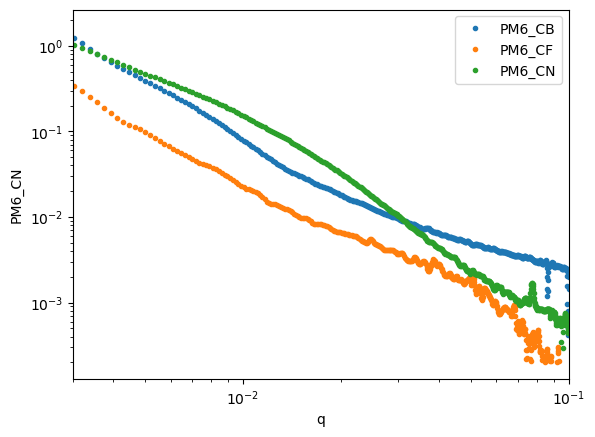

In [35]:
%matplotlib inline
plt.close('all')

# qmin = 0.008
qmin = None
# qmax = float(full_DS.q.max())
qmax = None

plt.close('all')
fig, ax = plt.subplots()
for sample in ['PM6_CB', 'PM6_CF', 'PM6_CN']:
# for sample in saxs_DS.data_vars:
    saxs_DS[sample].sel(q=slice(qmin,qmax)).plot.line(ax=ax, xscale='log',yscale='log', label=sample, linestyle='', marker='.')

# ax.set_ybound(lower=1e-4)
ax.set(xlim=(0.003,0.1))
# ax.set(xlim=(0.05,0.06))
# ax.xaxis.set_
ax.legend()
plt.show()

In [36]:
# # qmin = 0.008
# qmin = None
# # qmax = float(full_DS.q.max())
# qmax = None

# plt.close('all')
# fig, ax = plt.subplots()
# for sample in ['PM7_CB', 'PM7_CF', 'PM7_CN']:
# # for sample in saxs_DS.data_vars:
#     saxs_DS[sample].sel(q=slice(qmin,qmax)).plot.line(ax=ax, xscale='log',yscale='log', label=sample)

# ax.set_ybound(lower=1e-5)
# ax.legend()
# plt.show()

#### Load carbon RSoXS

In [37]:
carbonRSoXSPath = pathlib.Path('/projects/anle1278/for_PM6_fibrils/carbon_rsoxs')
list(carbonRSoXSPath.glob('*'))

[PosixPath('/projects/anle1278/for_PM6_fibrils/carbon_rsoxs/polar_PM6_carbon_rsoxs_2024C2_v4.zarr')]

In [40]:
sn = {'PM6_CF': '0.0% CN',
      'PM6_p5CN-CF': '0.5% CN', 
      'PM6_1CN-CF': '1.0% CN', 
      'PM6_5CN-CF': '5.0% CN'}

re_caked_DS = xr.open_zarr(carbonRSoXSPath.joinpath('polar_PM6_carbon_rsoxs_2024C2_v4.zarr'))
re_caked_DS

<xarray.Dataset> Size: 5GB
Dimensions:         (chi: 360, sample_name: 8, polarization: 2, energy: 114,
                     q: 500)
Coordinates:
  * chi             (chi) float64 3kB -179.4 -178.4 -177.4 ... 177.4 178.4 179.4
  * energy          (energy) float64 912B 250.0 255.0 260.0 ... 345.0 350.0
  * polarization    (polarization) int64 16B 0 90
  * q               (q) float64 4kB 0.0002771 0.0005175 ... 0.12 0.1202
  * sample_name     (sample_name) <U14 448B 'PM6_CF' ... 'PM6_5CN-CB'
    scan_id         (sample_name) int64 64B dask.array<chunksize=(8,), meta=np.ndarray>
Data variables:
    corr_intensity  (sample_name, polarization, energy, chi, q) float64 3GB dask.array<chunksize=(1, 1, 114, 360, 500), meta=np.ndarray>
    raw_intensity   (sample_name, polarization, energy, chi, q) float64 3GB dask.array<chunksize=(1, 1, 114, 360, 500), meta=np.ndarray>
Attributes:
    name:     cartesian_rsoxs

In [39]:
plt.close('all')

def make_para_perp_DAs(DA, fl_corr_frac):
    pol_paras = []
    pol_perps = []
    for pol in [0, 90]:
        if pol == 0:
            para_DA = DA.sel(polarization=pol).sel(chi = (DA.chi < -180+(chi_width/2)) | (DA.chi > 180-(chi_width/2)))
            perp_DA = DA.sel(polarization=pol).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))
        elif pol == 90:
            perp_DA = DA.sel(polarization=pol).sel(chi = (DA.chi < -180+(chi_width/2)) | (DA.chi > 180-(chi_width/2)))
            para_DA = DA.sel(polarization=pol).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))            
        pol_paras.append(para_DA)
        pol_perps.append(perp_DA)
    
    pol_paras[0] = pol_paras[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
    pol_paras[1] = pol_paras[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
    pol_perps[0] = pol_perps[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    pol_perps[1] = pol_perps[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
    pol_paras[0] = pol_paras[0].interp({'chi': pol_paras[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
    pol_perps[0] = pol_perps[0].interp({'chi': pol_perps[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
    para_DA = (pol_paras[0] + pol_paras[1])/2
    perp_DA = (pol_perps[0] + pol_perps[1])/2
    
    para_DA = para_DA.assign_coords({'polarization':'avg'})
    perp_DA = perp_DA.assign_coords({'polarization':'avg'})
    
    pol = str(para_DA.polarization.values) 
    
    # Fl correction?
    fl_corr = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * fl_corr_frac
    # fl_corr = perp_DA.mean('chi').sel(q=slice(0.09,None)).mean('q') * fl_corr_frac
    
    para_DA = para_DA - fl_corr
    perp_DA = perp_DA - fl_corr

    return para_DA, perp_DA, fl_corr

# para_DA, perp_DA, fl_corr = make_para_perp_DAs(re_caked_DS['corr_intensity'].sel(sample_name='PM6_p5CN-CF'), 0.9)
# fl_corr

#### Useful function(s)

In [ ]:
# from scipy import optimize

# # Functions to fit scaling factor of MD calculation to line up best with data
# def peak_intensity_calc_residual(params, simulated_data, experiment_data):
#     """
#     Inputs:
#         params (list of floats): parameters to fit, [scaling_constant]

#     Outputs:
#         summed difference to minimize
#     """
#     constant = params[0]
    
#     # return np.mean(((peak_areas - (constant * peak_intensity_fit(F_0, F_res, delta_phi, f_0, real_asf, imag_asf)))**2)).sum()
#     return ((experiment_data - (constant * simulated_data))**2).sum()

#### CyRSoXS "Fl" background?

In [ ]:
# %matplotlib inline
# plt.close('all')

# # make selection
# DS = re_caked_DS.copy()

# intensity_type = 'corr'
# soln_mat = 'PM6'
# # wedge='Perp'
# chi_width = 60
# # q_slice = slice(0.008, 0.1)
# q_slice = slice(0.003, 0.11)
# # energy = 285.2

# shift_qval = 0.012  # value at which to look to shift data, divide rsoxs by this value

# # saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CB', f'{soln_mat}_CN']
# saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CN']
# saxs_sample_to_align = f'{soln_mat}_CN'

# selected_qval = float(saxs_DS[saxs_sample_to_align].sel(q=shift_qval, method='nearest'))

# # Shift all saxs to line up with selected sample qval
# factor1 = selected_qval / float(saxs_DS[f'{soln_mat}_CB'].sel(q=shift_qval, method='nearest'))
# factor2 = selected_qval / float(saxs_DS[f'{soln_mat}_CF'].sel(q=shift_qval, method='nearest'))
# pm6_cb_shifted = saxs_DS[f'{soln_mat}_CB'] * factor1
# pm6_cf_shifted = saxs_DS[f'{soln_mat}_CF'] * factor2

# # saxs_colors = plt.cm.RdPu(np.linspace(0.4,1,len(saxs_samples)))
# saxs_colors = plt.cm.Blues(np.linspace(0.5,1,len(saxs_samples)))

# sn = {'PM6_CF': 'PM6 CF 0.0% CN',
#       'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
#       'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
#       'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

# selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# # selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']
# # selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# # selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# # rsoxs_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))
# rsoxs_colors = plt.cm.Oranges(np.linspace(0.3,0.8,len(selected_samples)))
# # rsoxs_colors = plt.cm.Greens(np.linspace(0.3,0.8,len(selected_samples)))

# # for energy in [270, 285.2, 305]:
# for data_var in tqdm(sorted(cy_caked_DS.data_vars)[::1]):
#     for energy in [270, 285.2]:
#         fig, axs = plt.subplots(ncols=3, tight_layout=True, figsize=(12,5.5), dpi=150, sharey=True)
    
#         for j, wedge in enumerate(['Perp', 'Avg', 'Para']):
#         # for data_var in sorted(cy_caked_DS.data_vars)[::1]:
#             # fig, ax = plt.subplots(tight_layout=True, figsize=(6,6), dpi=130)
        
#             DA = cy_caked_DS[data_var].compute()
        
#             cy_para_DA = cy_caked_DS[data_var].compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#             cy_perp_DA = cy_caked_DS[data_var].compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
        
#             if wedge == 'Para':
#                 cy_DA = cy_para_DA.sel(energy=energy, method='nearest').mean('chi')
#             elif wedge == 'Perp':
#                 cy_DA = cy_perp_DA.sel(energy=energy, method='nearest').mean('chi')
#             elif wedge == 'Avg':
#                 cy_DA = (cy_perp_DA.mean('chi') + cy_para_DA.mean('chi')) / 2
#                 cy_DA = cy_DA.sel(energy=energy, method='nearest')
                
#             # Shift CyRSoXS to line up with RSoXS 
#             rsoxs_qval = float(cy_DA.sel(q=slice(shift_qval-0.004,shift_qval+0.004)).mean('q'))
#             rsoxs_shift_factor = selected_qval / rsoxs_qval
        
#             print(rsoxs_shift_factor)
            
#             cy_DA = cy_DA * rsoxs_shift_factor
        
#             # cy_DA.sel(q=q_slice).plot.line(ax=axs[j], color='g', label=f'Sim. RSoXS', linestyle='--', markersize=3)    

#             # Plot SAXS
#             pm6_cf_shifted.sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[0], label=f'Solution: {soln_mat} CF',
#                                                    linestyle='', marker='.', alpha=1, markersize=3, zorder=2)    
#             # pm6_cb_shifted.sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[1], label=f'Solution: {soln_mat} CB',
#             #                                    linestyle='', marker='.', alpha=1, markersize=3, zorder=2)   
#             saxs_DS[saxs_sample_to_align].sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[1], label=f'Solution: {soln_mat} CN',
#                                                                   linestyle='', marker='.', alpha=1, markersize=3, zorder=1) 
            
#             for i, sample_name in enumerate(tqdm(selected_samples)):
#                 # Plot:          
#                 fl_corr_frac = 0.9
#                 para_DA, perp_DA, fl_corr_DA = make_para_perp_DAs(
#                     re_caked_DS[f'{intensity_type}_intensity'].sel(sample_name=sample_name), fl_corr_frac)
            
#                 # Shift RSoXS to line up with SAXS
#                 if wedge == 'Para':
#                     DA = para_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
#                 elif wedge == 'Perp':
#                     DA = perp_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
#                 elif wedge == 'Avg':
#                     DA = (perp_DA.mean('chi') + para_DA.mean('chi')) / 2
#                     DA = DA.sel(q=q_slice).sel(energy=energy, method='nearest')
        
                    
#                 rsoxs_qval = float(DA.sel(q=shift_qval, method='nearest'))
#                 rsoxs_shift_factor = selected_qval / rsoxs_qval
#                 DA = DA * rsoxs_shift_factor
            
#                 # Plot rsoxs diff profile:
#                 DA.plot.line(ax=axs[j], color=rsoxs_colors[i], label=f'Film: {sn[sample_name]}', 
#                              linestyle='None', marker='.', markersize=3,zorder=0)
            
#             cy_DA.sel(q=q_slice).plot.line(ax=axs[j], color='limegreen', label=f'Simulated P-RSoXS', linestyle='--', linewidth=2.5, zorder=2)    
    
#             axs[j].set(title=f'{soln_mat} SAXS vs RSoXS vs. NRSS Sim. \n {wedge} {chi_width}° Wedges; $E={energy}$ eV \n {data_var}')
    
            
            
#         for ax in axs:
#             ax.set(xscale='log', yscale='log', ylabel='', xlabel='Q [$Å^{-1}$]')
#             ax.set(ylim=(1e-4, None), xlim=(None, None))
#             ax.grid(visible=True, which='both', axis='x')
#             # ax.legend(title='Sample', loc=(1.02,0.2))
#             AA_str = '$Å^{-1}$'
#             legend = ax.legend()
#             for handle in legend.legend_handles[:]:
#                 handle.set_markersize(18)
    
#         axs[0].set_ylabel('Intensity [arb. units]')
    
        
#         plt.show()
#         plt.close('all')

#### IvQ comparison!

In [ ]:
# %matplotlib widget
# plt.close('all')

# # make selection
# DS = re_caked_DS.copy()

# intensity_type = 'corr'
# soln_mat = 'PM6'
# wedge='Para'
# chi_width = 45
# q_slice = slice(0.008, None)
# energy = 285.2

# shift_qval = 0.01  # value at which to look to shift data, divide rsoxs by this value

# saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CB']
# saxs_sample_to_align = f'{soln_mat}_CN'

# selected_qval = float(saxs_DS[saxs_sample_to_align].sel(q=shift_qval, method='nearest'))

# # Shift all saxs to line up with selected sample qval
# factor1 = selected_qval / float(saxs_DS[f'{soln_mat}_CB'].sel(q=shift_qval, method='nearest'))
# factor2 = selected_qval / float(saxs_DS[f'{soln_mat}_CF'].sel(q=shift_qval, method='nearest'))
# pm6_cb_shifted = saxs_DS[f'{soln_mat}_CB'] * factor1
# pm6_cf_shifted = saxs_DS[f'{soln_mat}_CF'] * factor2

# # saxs_colors = plt.cm.RdPu(np.linspace(0.4,1,len(saxs_samples)))
# saxs_colors = plt.cm.Blues(np.linspace(0.5,1,len(saxs_samples)))

# sn = {'PM6_CF': 'PM6 CF 0.0% CN',
#       'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
#       'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
#       'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

# # selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_1CN-CF']
# # selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# # selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# rsoxs_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))
# fig, ax = plt.subplots(tight_layout=True, figsize=(4.8,4.3), dpi=130)
# for i, sample_name in enumerate(tqdm(selected_samples)):
#     pol_paras = []
#     pol_perps = []
#     for pol in [0, 90]:
#         # para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, intensity_type, pol, (q_slice.start,q_slice.stop), chi_width)
#         if pol == 0:
#             para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=0, sample_name=sample_name
#                                                       ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#             perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=90, sample_name=sample_name
#                                                       ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))
#         elif pol == 90:
#             perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=0, sample_name=sample_name
#                                                       ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#             para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=90, sample_name=sample_name
#                                                       ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))            
#         pol_paras.append(para_DA)
#         pol_perps.append(perp_DA)


#     pol_paras[0] = pol_paras[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#     pol_paras[1] = pol_paras[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#     pol_perps[0] = pol_perps[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
#     pol_perps[1] = pol_perps[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})

#     pol_paras[0] = pol_paras[0].interp({'chi': pol_paras[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#     pol_perps[0] = pol_perps[0].interp({'chi': pol_perps[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})

#     para_DA = (pol_paras[0] + pol_paras[1])/2
#     perp_DA = (pol_perps[0] + pol_perps[1])/2

#     para_DA = para_DA.assign_coords({'polarization':'avg'})
#     perp_DA = perp_DA.assign_coords({'polarization':'avg'})

#     para_DA = para_DA.interpolate_na(dim='q')
#     perp_DA = perp_DA.interpolate_na(dim='q')

#     pol = str(para_DA.polarization.values) 

#     # Fl correction?
#     fl_corr = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * 0.9
#     # scale_factor = float(para_DA.sel(energy=slice(285,305), q=slice(2e-2,6e-2)).mean('chi').mean('energy').integrate('q'))
#     # manual_scale_factor = manual_scale_factors_v4[sample_name]
#     # trmsn90_corr = (manual_scale_factor * scale_factor * trmsn90_bkgs_DA.sel(sample_name=sample_name))
    
#     para_DA = para_DA - fl_corr
#     perp_DA = perp_DA - fl_corr

#     # Shift RSoXS to line up with SAXS
#     if wedge == 'Para':
#         DA = para_DA.sel(energy=energy, method='nearest').mean('chi')
#     elif wedge == 'Perp':
#         DA = perp_DA.sel(energy=energy, method='nearest').mean('chi')
#     rsoxs_qval = float(DA.sel(q=shift_qval, method='nearest'))
#     rsoxs_shift_factor = selected_qval / rsoxs_qval
#     DA = DA * rsoxs_shift_factor

#     # Plot rsoxs diff profile:
#     DA.plot.line(ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
#                  linestyle='None', marker='.', markersize=3)
    
# pm6_cf_shifted.plot.line(ax=ax, color=saxs_colors[0], label=f'Solution SAXS: {soln_mat} in CF')    
# # pm6_cb_shifted.plot.line(ax=ax, color=saxs_colors[2], label=f'Solution SAXS: {soln_mat} in CB')
# # y7_cn_shifted.plot.line(ax=ax, color=saxs_colors[1], label='Solution: Y7 in CN') 
# # y7_cb_shifted.plot.line(ax=ax, color=saxs_colors[0], label='Solution: Y7 in CB') 
# saxs_DS[saxs_sample_to_align].plot.line(ax=ax, color=saxs_colors[1], label=f'Solution SAXS: {soln_mat} in CN') 
# # pm6_to_shifted.plot.line(ax=ax, color=saxs_colors[2], label=f'Solution SAXS: {soln_mat} in TO')


# ax.set(xscale='log', yscale='log', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
# ax.set(title=f'{soln_mat} film P-RSoXS and solution SAXS overlays \n RSoXS {wedge} "Fluorescence corr" profiles, $E={energy}$ eV', ylim=(None, None), xlim=(None, 0.4))
# ax.grid(visible=True, which='both', axis='x')
# # ax.legend(title='Sample', loc=(1.02,0.2))
# AA_str = '$Å^{-1}$'
# legend = ax.legend(title=f'Data plotted:')
# for handle in legend.legend_handles:
#     handle.set_markersize(18)

# plt.show()
# # plt.close('all')

In [ ]:
# %matplotlib inline
# plt.close('all')

# # make selection
# DS = re_caked_DS.copy()

# intensity_type = 'corr'
# soln_mat = 'PM6'
# wedge='Perp'
# chi_width = 45
# # q_slice = slice(0.008, 0.1)
# q_slice = slice(0.003, 0.1)
# energy = 285.2

# shift_qval = 0.012  # value at which to look to shift data, divide rsoxs by this value

# saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CN']
# saxs_sample_to_align = f'{soln_mat}_CN'

# selected_qval = float(saxs_DS[saxs_sample_to_align].sel(q=shift_qval, method='nearest'))

# # Shift all saxs to line up with selected sample qval
# factor1 = selected_qval / float(saxs_DS[f'{soln_mat}_CB'].sel(q=shift_qval, method='nearest'))
# factor2 = selected_qval / float(saxs_DS[f'{soln_mat}_CF'].sel(q=shift_qval, method='nearest'))
# pm6_cb_shifted = saxs_DS[f'{soln_mat}_CB'] * factor1
# pm6_cf_shifted = saxs_DS[f'{soln_mat}_CF'] * factor2

# # saxs_colors = plt.cm.RdPu(np.linspace(0.4,1,len(saxs_samples)))
# saxs_colors = plt.cm.Blues(np.linspace(0.5,1,len(saxs_samples)))

# sn = {'PM6_CF': 'PM6 CF 0.0% CN',
#       'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
#       'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
#       'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

# # selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']
# # selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# # selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# rsoxs_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))

# for data_var in tqdm(sorted(cy_caked_DS.data_vars)[::1]):
# # for data_var in sorted(cy_caked_DS.data_vars)[::1]:
#     fig, ax = plt.subplots(tight_layout=True, figsize=(6,6), dpi=130)

#     DA = cy_caked_DS[data_var].compute()

#     cy_para_DA = cy_caked_DS[data_var].compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     cy_perp_DA = cy_caked_DS[data_var].compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     if wedge == 'Para':
#         cy_DA = cy_para_DA.sel(energy=energy, method='nearest').mean('chi')
#     elif wedge == 'Perp':
#         cy_DA = cy_perp_DA.sel(energy=energy, method='nearest').mean('chi')
#     elif wedge == 'Avg':
#         cy_DA = (cy_perp_DA.mean('chi') + cy_para_DA.mean('chi')) / 2
#         cy_DA = cy_DA.sel(energy=energy, method='nearest')
        
#     # Shift CyRSoXS to line up with RSoXS 
#     rsoxs_qval = float(cy_DA.sel(q=slice(shift_qval-0.004,shift_qval+0.004)).mean('q'))
#     rsoxs_shift_factor = selected_qval / rsoxs_qval

#     print(rsoxs_shift_factor)
    
#     cy_DA = cy_DA * rsoxs_shift_factor

#     # Plot:
#     cy_DA.sel(q=q_slice).plot.line(ax=ax, color='g', label=f'Sim. RSoXS', linestyle='--', markersize=3)
    
#     for i, sample_name in enumerate(tqdm(selected_samples)):
#         pol_paras = []
#         pol_perps = []
#         for pol in [0, 90]:
#             # para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, intensity_type, pol, (q_slice.start,q_slice.stop), chi_width)
#             if pol == 0:
#                 para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#                 perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))
#             elif pol == 90:
#                 perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#                 para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))            
#             pol_paras.append(para_DA)
#             pol_perps.append(perp_DA)
    
    
#         pol_paras[0] = pol_paras[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_paras[1] = pol_paras[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_perps[0] = pol_perps[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
#         pol_perps[1] = pol_perps[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
#         pol_paras[0] = pol_paras[0].interp({'chi': pol_paras[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_perps[0] = pol_perps[0].interp({'chi': pol_perps[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
#         para_DA = (pol_paras[0] + pol_paras[1])/2
#         perp_DA = (pol_perps[0] + pol_perps[1])/2
    
#         para_DA = para_DA.assign_coords({'polarization':'avg'})
#         perp_DA = perp_DA.assign_coords({'polarization':'avg'})
    
#         para_DA = para_DA.interpolate_na(dim='q')
#         perp_DA = perp_DA.interpolate_na(dim='q')
    
#         pol = str(para_DA.polarization.values) 
    
#         # Fl correction?
#         fl_corr = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * 0.9
#         # scale_factor = float(para_DA.sel(energy=slice(285,305), q=slice(2e-2,6e-2)).mean('chi').mean('energy').integrate('q'))
#         # manual_scale_factor = manual_scale_factors_v4[sample_name]
#         # trmsn90_corr = (manual_scale_factor * scale_factor * trmsn90_bkgs_DA.sel(sample_name=sample_name))
        
#         para_DA = para_DA - fl_corr
#         perp_DA = perp_DA - fl_corr
    
#         # Shift RSoXS to line up with SAXS
#         if wedge == 'Para':
#             DA = para_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
#         elif wedge == 'Perp':
#             DA = perp_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
#         elif wedge == 'Avg':
#             DA = (perp_DA + para_DA) / 2
#             DA = DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')

            
#         rsoxs_qval = float(DA.sel(q=shift_qval, method='nearest'))
#         rsoxs_shift_factor = selected_qval / rsoxs_qval
#         DA = DA * rsoxs_shift_factor
    
#         # Plot rsoxs diff profile:
#         DA.plot.line(ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
#                      linestyle='None', marker='.', markersize=3)
        
#     pm6_cf_shifted.sel(q=q_slice).plot.line(ax=ax, color=saxs_colors[0], label=f'Solution SAXS: {soln_mat} in CF')    
#     # pm6_cb_shifted.plot.line(ax=ax, color=saxs_colors[2], label=f'Solution SAXS: {soln_mat} in CB')
#     # y7_cn_shifted.plot.line(ax=ax, color=saxs_colors[1], label='Solution: Y7 in CN') 
#     # y7_cb_shifted.plot.line(ax=ax, color=saxs_colors[0], label='Solution: Y7 in CB') 
#     saxs_DS[saxs_sample_to_align].sel(q=q_slice).plot.line(ax=ax, color=saxs_colors[1], label=f'Solution SAXS: {soln_mat} in CN') 
#     # pm6_to_shifted.plot.line(ax=ax, color=saxs_colors[2], label=f'Solution SAXS: {soln_mat} in TO')
    
    
    
#     ax.set(xscale='log', yscale='log', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
#     # ax.set(ylim=(1e-4,None))
#     ax.set(title=f'{soln_mat} RSoXS vs. SAXS  \n $E={energy}$ eV; {wedge} RSoXS \n {data_var}', ylim=(1e-4, None), xlim=(None, None))
#     ax.grid(visible=True, which='both', axis='x')
#     # ax.legend(title='Sample', loc=(1.02,0.2))
#     AA_str = '$Å^{-1}$'
#     legend = ax.legend(title=f'Data plotted:')
#     for handle in legend.legend_handles:
#         handle.set_markersize(18)

#     # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}.png'), dpi=200)
#     # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_saxs_only.png'), dpi=200)
#     # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_expt_only.png'), dpi=200)
    
#     plt.show()
#     plt.close('all')

In [ ]:
sorted(cy_caked_DS.data_vars)[::-1]

In [89]:
for i, data_var in enumerate(sorted(cy_caked_DS.data_vars)[::1]):
    print(i, data_var)

0 fibril_amount-0.1_multi_length-[1200, 1200]_cores
1 fibril_amount-0.1_multi_length-[600, 1200]_cores
2 fibril_amount-0.1_multi_length-[600, 600]_cores
3 fibril_amount-0.2_multi_length-[1200, 1200]_cores
4 fibril_amount-0.2_multi_length-[600, 1200]_cores
5 fibril_amount-0.2_multi_length-[600, 600]_cores
6 fibril_amount-0.3_multi_length-[1200, 1200]_cores
7 fibril_amount-0.3_multi_length-[600, 1200]_cores
8 fibril_amount-0.3_multi_length-[600, 600]_cores


  0%|          | 0/9 [00:00<?, ?it/s]

0.18854899661821978


  0%|          | 0/4 [00:00<?, ?it/s]

0.30551689831689033


  0%|          | 0/4 [00:00<?, ?it/s]

0.8047505628156489


  0%|          | 0/4 [00:00<?, ?it/s]

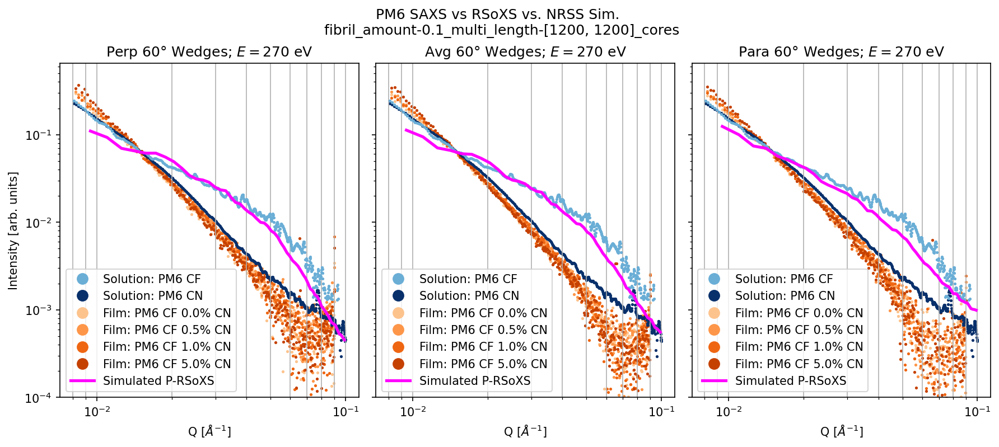

0.002006520882459943


  0%|          | 0/4 [00:00<?, ?it/s]

0.0015608096414581334


  0%|          | 0/4 [00:00<?, ?it/s]

0.001277120949853507


  0%|          | 0/4 [00:00<?, ?it/s]

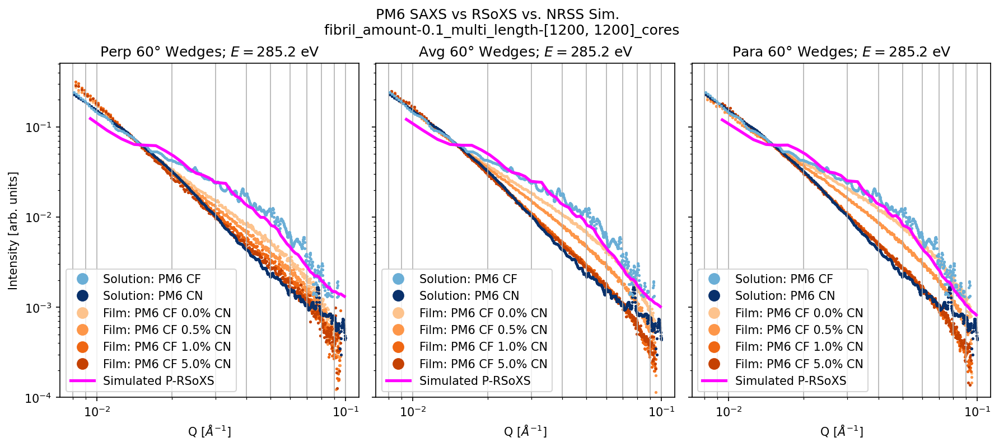

0.20461055450001905


  0%|          | 0/4 [00:00<?, ?it/s]

0.2968229112020342


  0%|          | 0/4 [00:00<?, ?it/s]

0.5403386702326287


  0%|          | 0/4 [00:00<?, ?it/s]

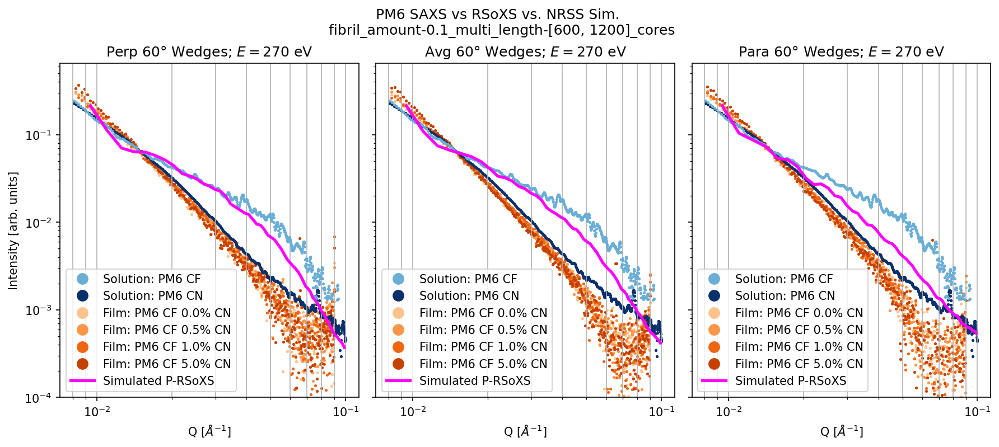

0.0016118333328445985


  0%|          | 0/4 [00:00<?, ?it/s]

0.001421946243752446


  0%|          | 0/4 [00:00<?, ?it/s]

0.0012720843507616196


  0%|          | 0/4 [00:00<?, ?it/s]

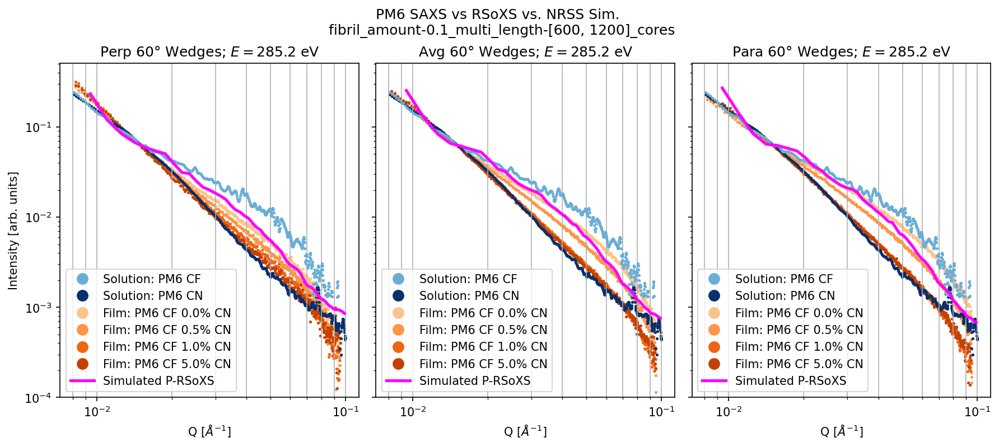

0.15615155310852727


  0%|          | 0/4 [00:00<?, ?it/s]

0.24579297116352247


  0%|          | 0/4 [00:00<?, ?it/s]

0.5770692565794943


  0%|          | 0/4 [00:00<?, ?it/s]

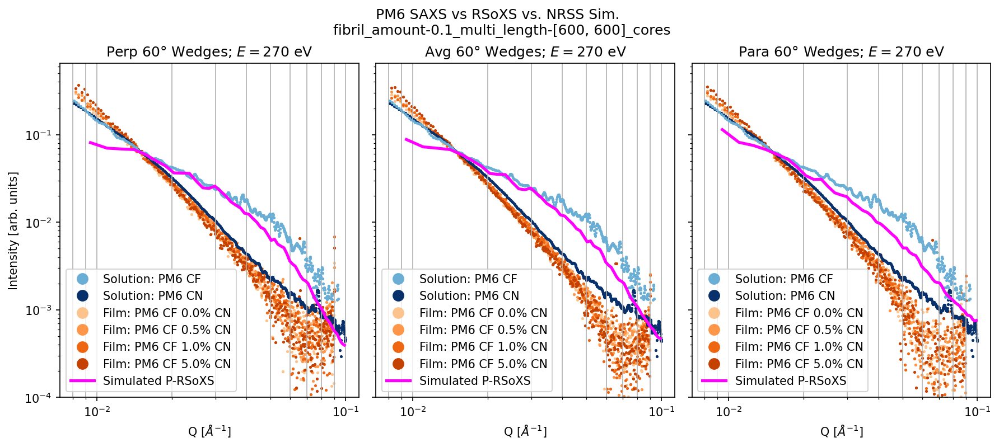

0.001552426005045118


  0%|          | 0/4 [00:00<?, ?it/s]

0.0012440360097571402


  0%|          | 0/4 [00:00<?, ?it/s]

0.0010378639545306138


  0%|          | 0/4 [00:00<?, ?it/s]

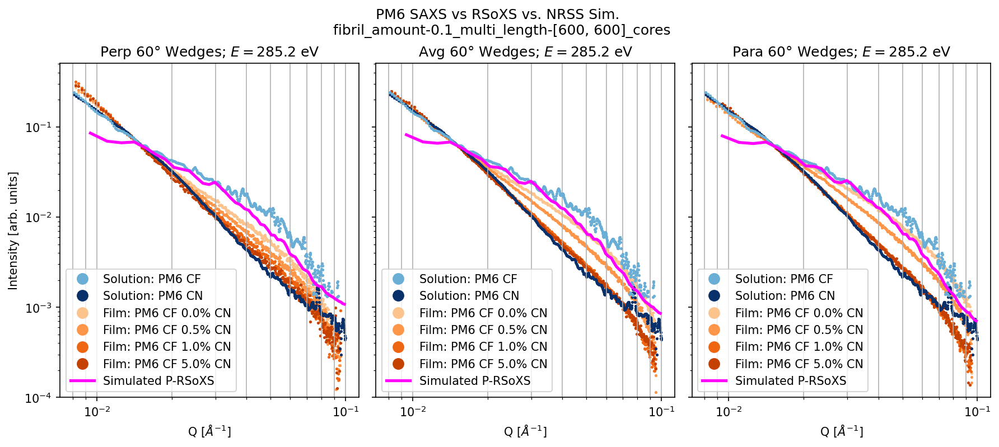

0.13045085944413404


  0%|          | 0/4 [00:00<?, ?it/s]

0.21211162752179846


  0%|          | 0/4 [00:00<?, ?it/s]

0.5671266048000515


  0%|          | 0/4 [00:00<?, ?it/s]

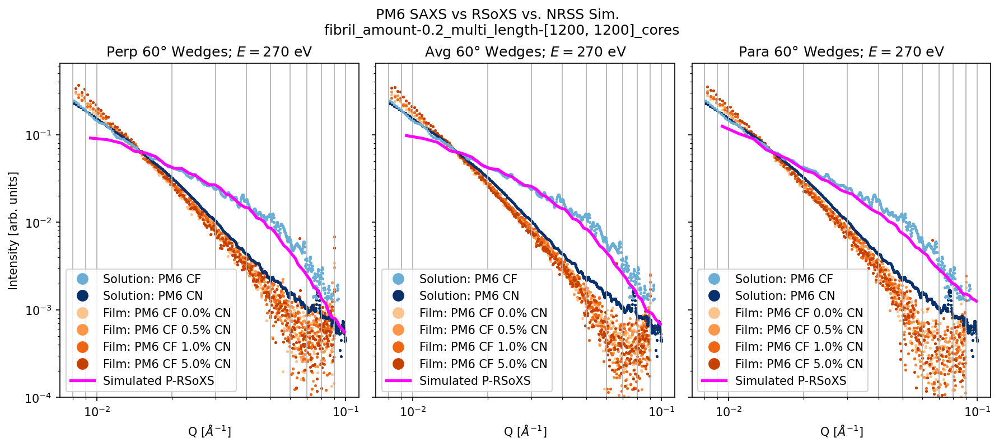

0.0012144161891896562


  0%|          | 0/4 [00:00<?, ?it/s]

0.0008632257928782864


  0%|          | 0/4 [00:00<?, ?it/s]

0.000669590525015547


  0%|          | 0/4 [00:00<?, ?it/s]

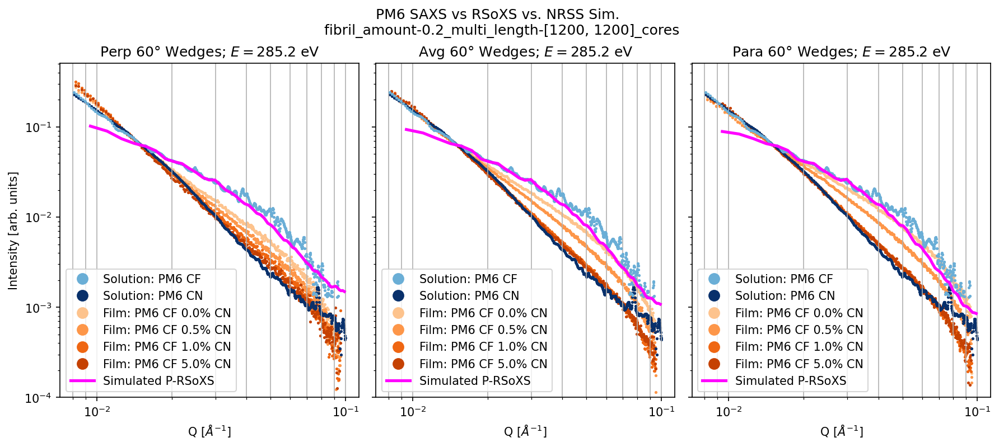

0.1120517060805139


  0%|          | 0/4 [00:00<?, ?it/s]

0.15136849948380718


  0%|          | 0/4 [00:00<?, ?it/s]

0.23319055829599286


  0%|          | 0/4 [00:00<?, ?it/s]

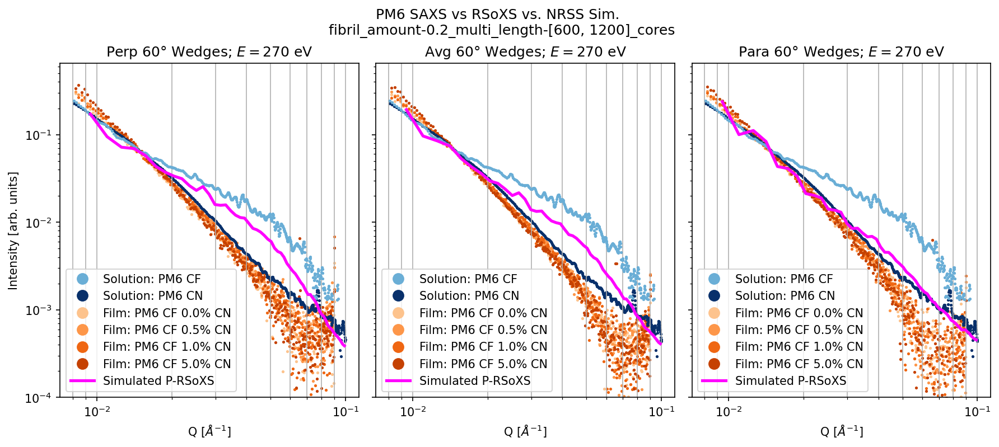

0.000685023843875159


  0%|          | 0/4 [00:00<?, ?it/s]

0.0005946863183656524


  0%|          | 0/4 [00:00<?, ?it/s]

0.0005253992832143572


  0%|          | 0/4 [00:00<?, ?it/s]

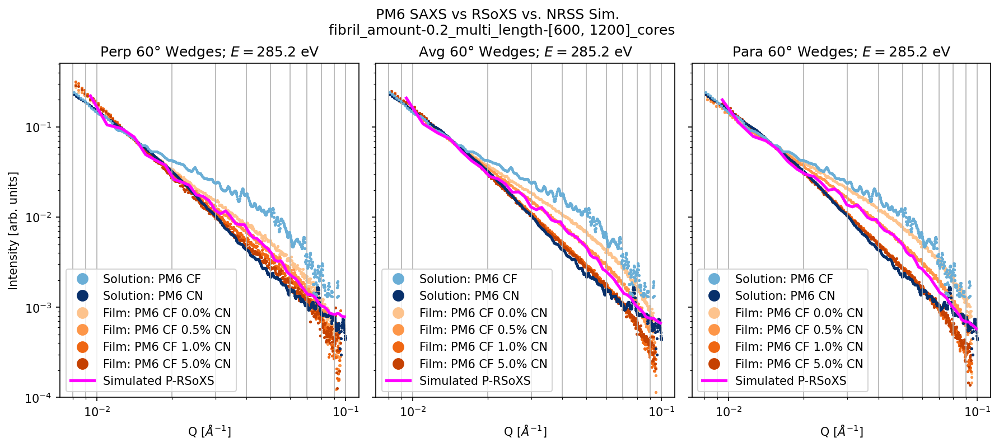

0.10141448428175426


  0%|          | 0/4 [00:00<?, ?it/s]

0.14429430804326085


  0%|          | 0/4 [00:00<?, ?it/s]

0.24999776927008682


  0%|          | 0/4 [00:00<?, ?it/s]

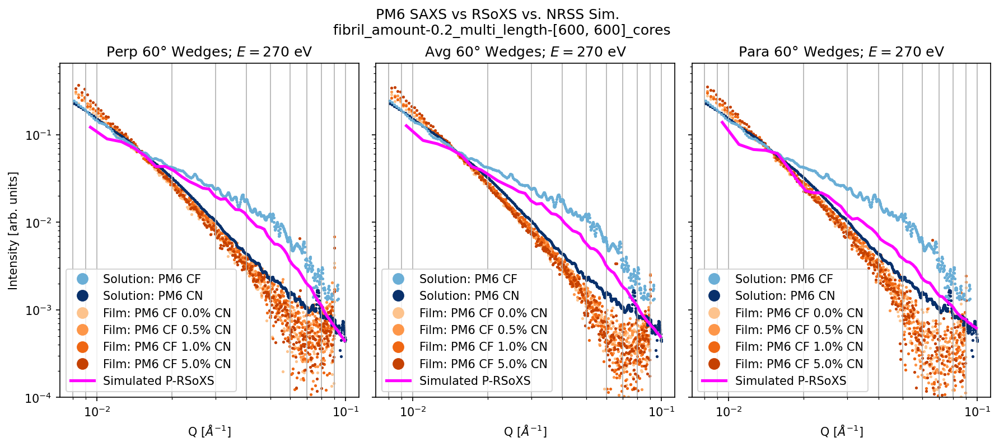

0.0007152214931497713


  0%|          | 0/4 [00:00<?, ?it/s]

0.0005885363961559621


  0%|          | 0/4 [00:00<?, ?it/s]

0.0004999769391992353


  0%|          | 0/4 [00:00<?, ?it/s]

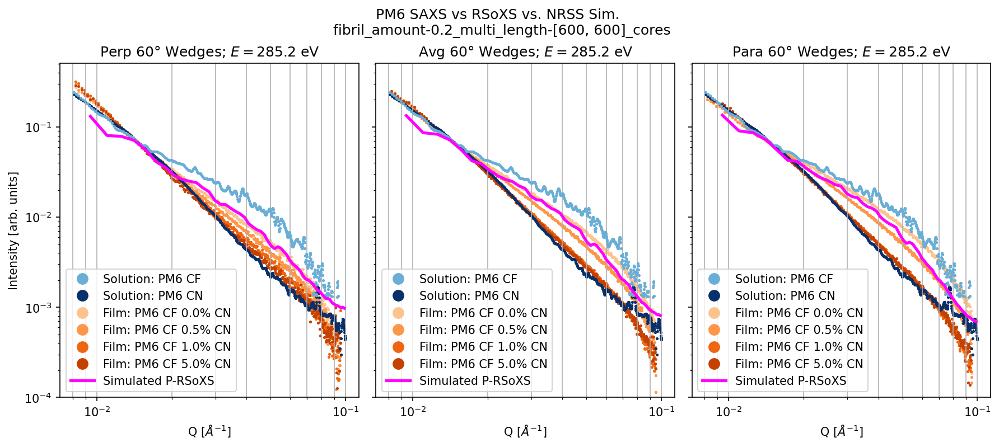

0.1197730028714533


  0%|          | 0/4 [00:00<?, ?it/s]

0.19426245645576554


  0%|          | 0/4 [00:00<?, ?it/s]

0.5138159301350395


  0%|          | 0/4 [00:00<?, ?it/s]

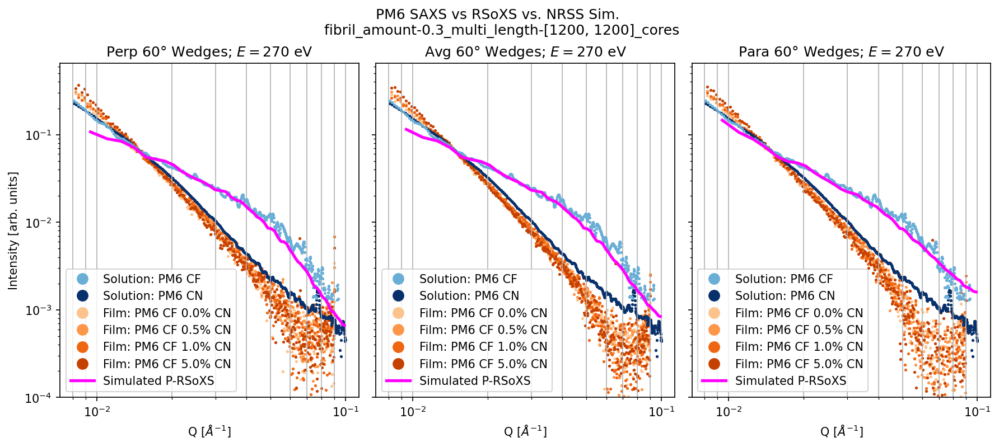

0.0011164112954276972


  0%|          | 0/4 [00:00<?, ?it/s]

0.0007314908573811196


  0%|          | 0/4 [00:00<?, ?it/s]

0.0005439468423094953


  0%|          | 0/4 [00:00<?, ?it/s]

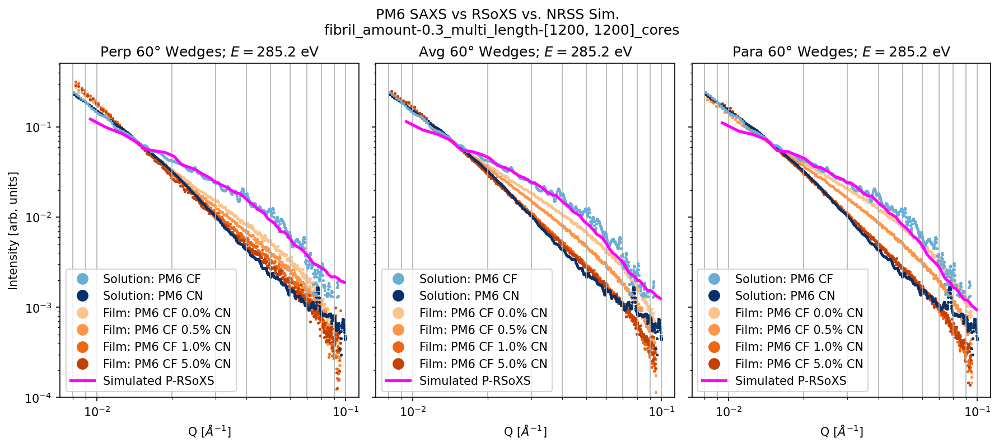

0.11590958207186619


  0%|          | 0/4 [00:00<?, ?it/s]

0.168472438031873


  0%|          | 0/4 [00:00<?, ?it/s]

0.30826490825558184


  0%|          | 0/4 [00:00<?, ?it/s]

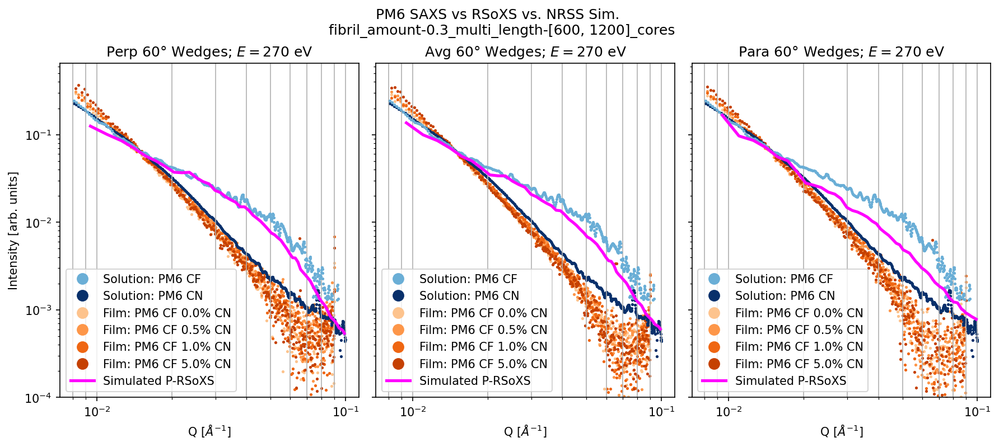

0.0009388885525317243


  0%|          | 0/4 [00:00<?, ?it/s]

0.0007381545357246627


  0%|          | 0/4 [00:00<?, ?it/s]

0.0006081354590250948


  0%|          | 0/4 [00:00<?, ?it/s]

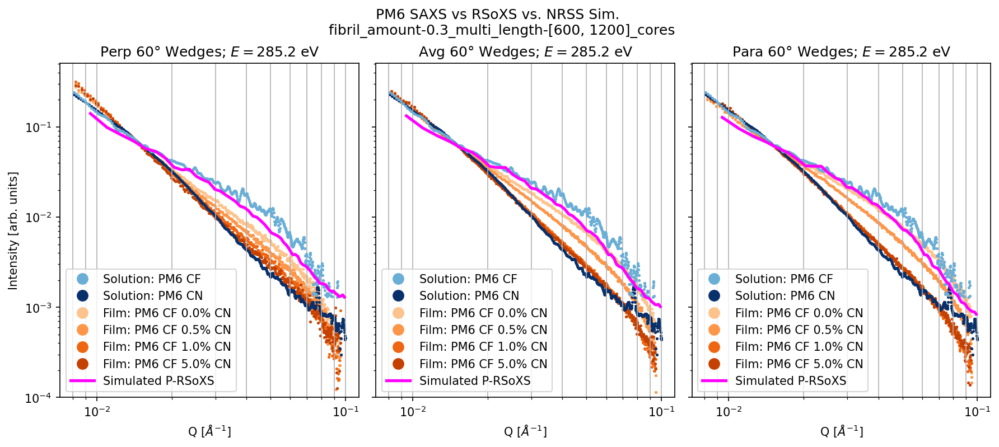

0.10764720905122002


  0%|          | 0/4 [00:00<?, ?it/s]

0.14387248944364384


  0%|          | 0/4 [00:00<?, ?it/s]

0.2168447735687401


  0%|          | 0/4 [00:00<?, ?it/s]

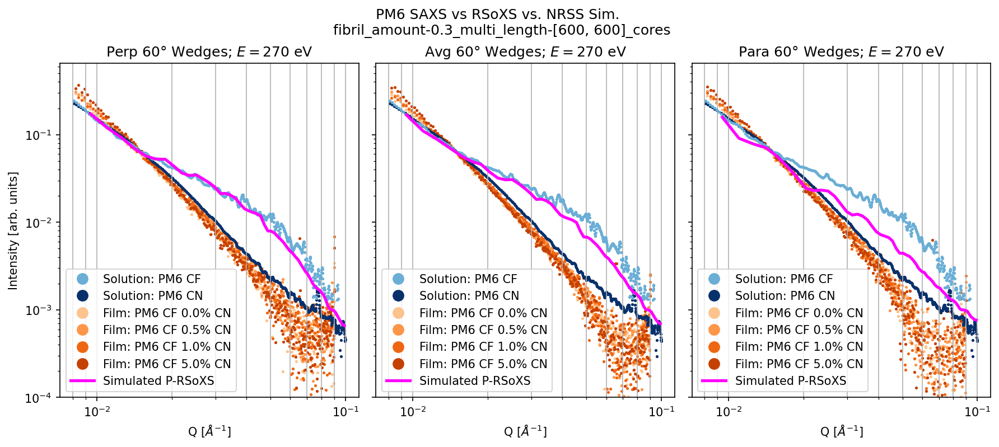

0.0006494908232716398


  0%|          | 0/4 [00:00<?, ?it/s]

0.0005494884665999918


  0%|          | 0/4 [00:00<?, ?it/s]

0.00047617206680560377


  0%|          | 0/4 [00:00<?, ?it/s]

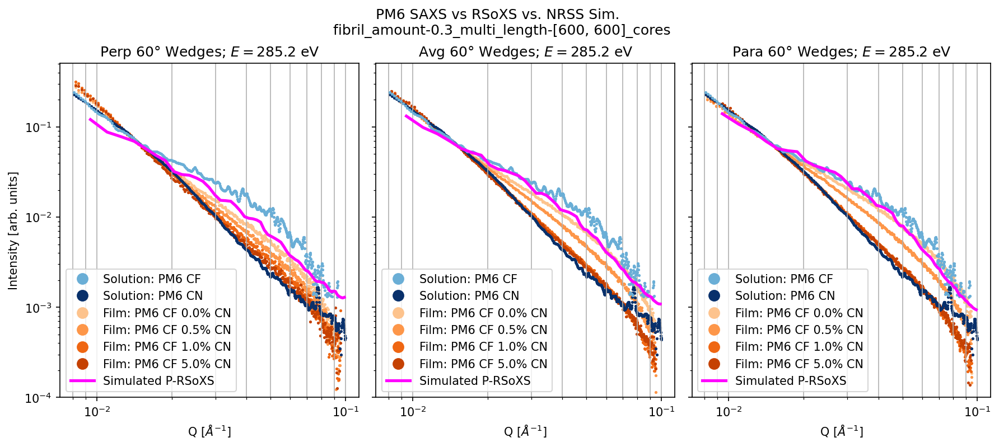

In [91]:
%matplotlib inline
plt.close('all')

# make selection
DS = re_caked_DS.copy()

intensity_type = 'corr'
soln_mat = 'PM6'
# wedge='Perp'
chi_width = 60
q_slice = slice(0.008, 0.1)
# q_slice = slice(0.003, 0.11)
# energy = 285.2

shift_qval = 0.015  # value at which to look to shift data, divide rsoxs by this value

# saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CB', f'{soln_mat}_CN']
saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CN']
saxs_sample_to_align = f'{soln_mat}_CN'

selected_qval = float(saxs_DS[saxs_sample_to_align].sel(q=shift_qval, method='nearest'))

# Shift all saxs to line up with selected sample qval
factor1 = selected_qval / float(saxs_DS[f'{soln_mat}_CB'].sel(q=shift_qval, method='nearest'))
factor2 = selected_qval / float(saxs_DS[f'{soln_mat}_CF'].sel(q=shift_qval, method='nearest'))
pm6_cb_shifted = saxs_DS[f'{soln_mat}_CB'] * factor1
pm6_cf_shifted = saxs_DS[f'{soln_mat}_CF'] * factor2

# saxs_colors = plt.cm.RdPu(np.linspace(0.4,1,len(saxs_samples)))
saxs_colors = plt.cm.Blues(np.linspace(0.5,1,len(saxs_samples)))

sn = {'PM6_CF': 'PM6 CF 0.0% CN',
      'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
      'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
      'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']
# selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# rsoxs_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))
rsoxs_colors = plt.cm.Oranges(np.linspace(0.3,0.8,len(selected_samples)))
# rsoxs_colors = plt.cm.Greens(np.linspace(0.3,0.8,len(selected_samples)))

# for energy in [270, 285.2, 305]:
for data_var in tqdm(sorted(cy_caked_DS.data_vars)[::1]):
    for energy in [270, 285.2]:
        fig, axs = plt.subplots(ncols=3, tight_layout=True, figsize=(12,5.5), dpi=150, sharey=True)
    
        for j, wedge in enumerate(['Perp', 'Avg', 'Para']):
        # for data_var in sorted(cy_caked_DS.data_vars)[::1]:
            # fig, ax = plt.subplots(tight_layout=True, figsize=(6,6), dpi=130)
        
            DA = cy_caked_DS[data_var].compute()
        
            cy_para_DA = cy_caked_DS[data_var].compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
            cy_perp_DA = cy_caked_DS[data_var].compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
        
            if wedge == 'Para':
                cy_DA = cy_para_DA.sel(energy=energy, method='nearest').mean('chi')
            elif wedge == 'Perp':
                cy_DA = cy_perp_DA.sel(energy=energy, method='nearest').mean('chi')
            elif wedge == 'Avg':
                cy_DA = (cy_perp_DA.mean('chi') + cy_para_DA.mean('chi')) / 2
                cy_DA = cy_DA.sel(energy=energy, method='nearest')
                
            # Shift CyRSoXS to line up with RSoXS 
            rsoxs_qval = float(cy_DA.sel(q=slice(shift_qval-0.001,shift_qval+0.001)).mean('q'))
            rsoxs_shift_factor = selected_qval / rsoxs_qval
        
            print(rsoxs_shift_factor)
            
            cy_DA = cy_DA * rsoxs_shift_factor
        
            # cy_DA.sel(q=q_slice).plot.line(ax=axs[j], color='g', label=f'Sim. RSoXS', linestyle='--', markersize=3)    

            # Plot SAXS
            pm6_cf_shifted.sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[0], label=f'Solution: {soln_mat} CF',
                                                   linestyle='', marker='.', alpha=1, markersize=3, zorder=2)    
            # pm6_cb_shifted.sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[1], label=f'Solution: {soln_mat} CB',
            #                                    linestyle='', marker='.', alpha=1, markersize=3, zorder=2)   
            saxs_DS[saxs_sample_to_align].sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[1], label=f'Solution: {soln_mat} CN',
                                                                  linestyle='', marker='.', alpha=1, markersize=3, zorder=1) 
            
            for i, sample_name in enumerate(tqdm(selected_samples)):
                # Plot:          
                fl_corr_frac = 0.9
                para_DA, perp_DA, fl_corr_DA = make_para_perp_DAs(
                    re_caked_DS[f'{intensity_type}_intensity'].sel(sample_name=sample_name), fl_corr_frac)
            
                # Shift RSoXS to line up with SAXS
                if wedge == 'Para':
                    DA = para_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
                elif wedge == 'Perp':
                    DA = perp_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
                elif wedge == 'Avg':
                    DA = (perp_DA.mean('chi') + para_DA.mean('chi')) / 2
                    DA = DA.sel(q=q_slice).sel(energy=energy, method='nearest')
        
                    
                rsoxs_qval = float(DA.sel(q=shift_qval, method='nearest'))
                rsoxs_shift_factor = selected_qval / rsoxs_qval
                DA = DA * rsoxs_shift_factor
            
                # Plot rsoxs diff profile:
                DA.plot.line(ax=axs[j], color=rsoxs_colors[i], label=f'Film: {sn[sample_name]}', 
                             linestyle='None', marker='.', markersize=3,zorder=0)
            
            cy_DA.sel(q=q_slice).plot.line(ax=axs[j], color='magenta', label=f'Simulated P-RSoXS', linestyle='-', linewidth=2.5, zorder=2)    
    
            axs[j].set(title=f'{wedge} {chi_width}° Wedges; $E={energy}$ eV')
    
            
            
        for ax in axs:
            ax.set(xscale='log', yscale='log', ylabel='', xlabel='Q [$Å^{-1}$]')
            ax.set(ylim=(1e-4, None), xlim=(None, None))
            ax.grid(visible=True, which='both', axis='x')
            # ax.legend(title='Sample', loc=(1.02,0.2))
            AA_str = '$Å^{-1}$'
            legend = ax.legend()
            for handle in legend.legend_handles[:]:
                handle.set_markersize(18)
    
        axs[0].set_ylabel('Intensity [arb. units]')

        fig.suptitle(f'{soln_mat} SAXS vs RSoXS vs. NRSS Sim. \n {data_var}',y=0.96)
    
        fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}eV.png'), dpi=200)
        
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}eV_experiment_only.png'), dpi=200)
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}-eV_rsoxs_only_{fl_corr_frac}-fl.png'), dpi=200)
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}eV_saxs_only.png'), dpi=200)
        
        plt.show()
        plt.close('all')

In [ ]:
# %matplotlib inline
# plt.close('all')

# # make selection
# DS = re_caked_DS.copy()

# intensity_type = 'corr'
# soln_mat = 'PM6'
# wedge='Perp'
# chi_width = 45
# # q_slice = slice(0.008, 0.1)
# q_slice = slice(0.007, 0.1)
# energy = 285.2

# shift_qval = 0.012  # value at which to look to shift data, divide rsoxs by this value

# saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CN']
# saxs_sample_to_align = f'{soln_mat}_CN'

# selected_qval = float(saxs_DS[saxs_sample_to_align].sel(q=shift_qval, method='nearest'))

# # Shift all saxs to line up with selected sample qval
# factor1 = selected_qval / float(saxs_DS[f'{soln_mat}_CB'].sel(q=shift_qval, method='nearest'))
# factor2 = selected_qval / float(saxs_DS[f'{soln_mat}_CF'].sel(q=shift_qval, method='nearest'))
# pm6_cb_shifted = saxs_DS[f'{soln_mat}_CB'] * factor1
# pm6_cf_shifted = saxs_DS[f'{soln_mat}_CF'] * factor2

# # saxs_colors = plt.cm.RdPu(np.linspace(0.4,1,len(saxs_samples)))
# saxs_colors = plt.cm.Blues(np.linspace(0.5,1,len(saxs_samples)))

# sn = {'PM6_CF': 'PM6 CF 0.0% CN',
#       'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
#       'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
#       'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

# # selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']
# # selected_samples = ['PM6_CF']
# # selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# # selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# para_colors = plt.cm.Reds(np.linspace(0.3,0.8,len(selected_samples)))
# perp_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))

# for data_var in tqdm(sorted(cy_caked_DS.data_vars)[::1]):
# # for data_var in sorted(cy_caked_DS.data_vars)[::1]:
#     # fig, ax = plt.subplots(tight_layout=True, figsize=(6,6), dpi=130)
#     fig, axs = plt.subplots(ncols=3, tight_layout=True, figsize=(12,5), dpi=150, sharey=True)

#     DA = cy_caked_DS[data_var].compute()

#     cy_para_DA = cy_caked_DS[data_var].compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     cy_perp_DA = cy_caked_DS[data_var].compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     cy_para_DA = cy_para_DA.sel(energy=energy, method='nearest').mean('chi')
#     cy_perp_DA = cy_perp_DA.sel(energy=energy, method='nearest').mean('chi')
        
#     # Shift CyRSoXS to line up with RSoXS 
#     rsoxs_qval = float(cy_para_DA.sel(q=slice(shift_qval-0.004,shift_qval+0.004)).mean('q'))
#     rsoxs_shift_factor = selected_qval / rsoxs_qval    
#     cy_para_DA = cy_para_DA * rsoxs_shift_factor
#     cy_perp_DA = cy_perp_DA * rsoxs_shift_factor
    
    
#     # if wedge == 'Para':
#     #     cy_DA = cy_para_DA.sel(energy=energy, method='nearest').mean('chi')
#     # elif wedge == 'Perp':
#     #     cy_DA = cy_perp_DA.sel(energy=energy, method='nearest').mean('chi')
        
#     # # Shift CyRSoXS to line up with RSoXS 
#     # rsoxs_qval = float(cy_DA.sel(q=slice(shift_qval-0.004,shift_qval+0.004)).mean('q'))
#     # rsoxs_shift_factor = selected_qval / rsoxs_qval

#     # print(rsoxs_shift_factor)
    
#     # cy_DA = cy_DA * rsoxs_shift_factor

#     # # Plot:
#     # cy_DA.sel(q=q_slice).plot.line(ax=ax, color='g', label=f'Sim. RSoXS', linestyle='--', markersize=3)
    
#     for i, sample_name in enumerate(tqdm(selected_samples)):

#         # Plot cy data:
#         cy_para_DA.sel(q=q_slice).plot.line(ax=axs[i], color='r', label=f'Para Sim. RSoXS', linestyle='--', markersize=3)
#         cy_perp_DA.sel(q=q_slice).plot.line(ax=axs[i], color='b', label=f'Perp Sim. RSoXS', linestyle='--', markersize=3)
        
#         pol_paras = []
#         pol_perps = []
#         for pol in [0, 90]:
#             # para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, intensity_type, pol, (q_slice.start,q_slice.stop), chi_width)
#             if pol == 0:
#                 para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#                 perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))
#             elif pol == 90:
#                 perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#                 para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))            
#             pol_paras.append(para_DA)
#             pol_perps.append(perp_DA)
    
    
#         pol_paras[0] = pol_paras[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_paras[1] = pol_paras[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_perps[0] = pol_perps[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
#         pol_perps[1] = pol_perps[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
#         pol_paras[0] = pol_paras[0].interp({'chi': pol_paras[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_perps[0] = pol_perps[0].interp({'chi': pol_perps[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
#         para_DA = (pol_paras[0] + pol_paras[1])/2
#         perp_DA = (pol_perps[0] + pol_perps[1])/2
    
#         para_DA = para_DA.assign_coords({'polarization':'avg'})
#         perp_DA = perp_DA.assign_coords({'polarization':'avg'})
    
#         para_DA = para_DA.interpolate_na(dim='q')
#         perp_DA = perp_DA.interpolate_na(dim='q')
    
#         pol = str(para_DA.polarization.values) 
    
#         # Fl correction?
#         fl_corr = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * 0.9
#         # scale_factor = float(para_DA.sel(energy=slice(285,305), q=slice(2e-2,6e-2)).mean('chi').mean('energy').integrate('q'))
#         # manual_scale_factor = manual_scale_factors_v4[sample_name]
#         # trmsn90_corr = (manual_scale_factor * scale_factor * trmsn90_bkgs_DA.sel(sample_name=sample_name))
        
#         para_DA = para_DA - fl_corr
#         perp_DA = perp_DA - fl_corr
    
#         # Shift RSoXS to line up with SAXS
        
#         # if wedge == 'Para':
#         #     DA = para_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
#         # elif wedge == 'Perp':
#         #     DA = perp_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')

#         para_DA = para_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
#         perp_DA = perp_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
        
#         rsoxs_qval = float(para_DA.sel(q=shift_qval, method='nearest'))
#         rsoxs_shift_factor = selected_qval / rsoxs_qval
#         para_DA = (para_DA * rsoxs_shift_factor)
#         perp_DA = (perp_DA * rsoxs_shift_factor)
        
#         # DA = DA * rsoxs_shift_factor
    
#         # Plot rsoxs diff profile:
#         para_DA.plot.line(ax=axs[i], color=para_colors[1], label=f'Para RSoXS: {sn[sample_name]}', 
#                           linestyle='None', marker='.', markersize=3)
#         perp_DA.plot.line(ax=axs[i], color=perp_colors[1], label=f'Perp RSoXS: {sn[sample_name]}', 
#                           linestyle='None', marker='.', markersize=3)
#         # DA.plot.line(ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
#         #              linestyle='None', marker='.', markersize=3)
        
#     # pm6_cf_shifted.plot.line(ax=ax, color=saxs_colors[0], label=f'Solution SAXS: {soln_mat} in CF')    
#     # pm6_cb_shifted.plot.line(ax=ax, color=saxs_colors[2], label=f'Solution SAXS: {soln_mat} in CB')
#     # y7_cn_shifted.plot.line(ax=ax, color=saxs_colors[1], label='Solution: Y7 in CN') 
#     # y7_cb_shifted.plot.line(ax=ax, color=saxs_colors[0], label='Solution: Y7 in CB') 
#     # saxs_DS[saxs_sample_to_align].plot.line(ax=ax, color=saxs_colors[1], label=f'Solution SAXS: {soln_mat} in CN') 
#     # pm6_to_shifted.plot.line(ax=ax, color=saxs_colors[2], label=f'Solution SAXS: {soln_mat} in TO')
    

#     for ax in axs:
#         ax.set(xscale='log', yscale='log', ylabel='', xlabel='Q [$Å^{-1}$]')
#         # ax.set(ylim=(1e-4,None))
#         ax.set(title=f'{soln_mat}; $E={energy}$ eV; RSoXS \n {data_var}', ylim=(None, None), xlim=(None, None))
#         ax.grid(visible=True, which='both', axis='x')
#         # ax.legend(title='Sample', loc=(1.02,0.2))
#         AA_str = '$Å^{-1}$'
#         legend = ax.legend()
#         for handle in legend.legend_handles:
#             handle.set_markersize(18)
#     axs[0].set_ylabel('Intensity [arb. units]')

#     # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}.png'), dpi=200)
#     # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_saxs_only.png'), dpi=200)
#     # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_expt_only.png'), dpi=200)
    
#     plt.show()
#     plt.close('all')

In [ ]:
# %matplotlib widget
# plt.close('all')

# sel_DA = DS['corr_intensity'].sel(polarization=0, sample_name=sample_name).sel(energy=285.2,method='nearest').sel(q=slice(0.008,0.1))

# cmin,cmax = sel_DA.compute().quantile([0.01,0.999])
# sel_DA.plot.imshow(interpolation='antialiased', norm=LogNorm(cmin,cmax), cmap='turbo')

# plt.show()
# # plt.close('all')

#### AvQ comparison!

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

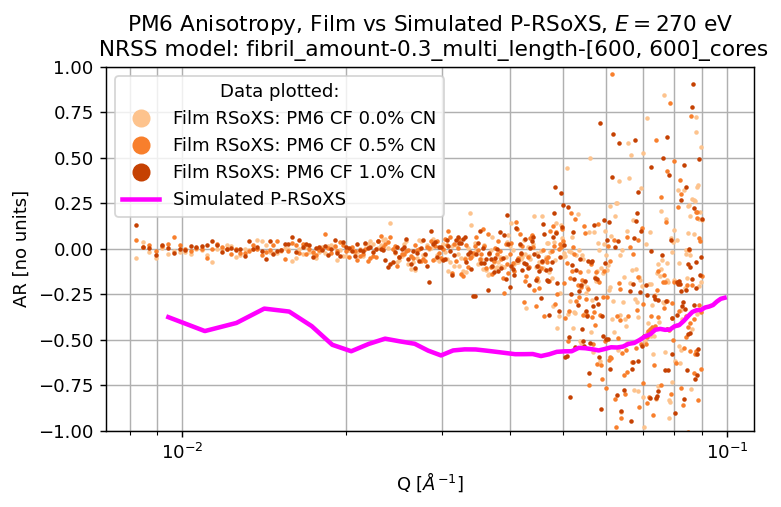

  0%|          | 0/3 [00:00<?, ?it/s]

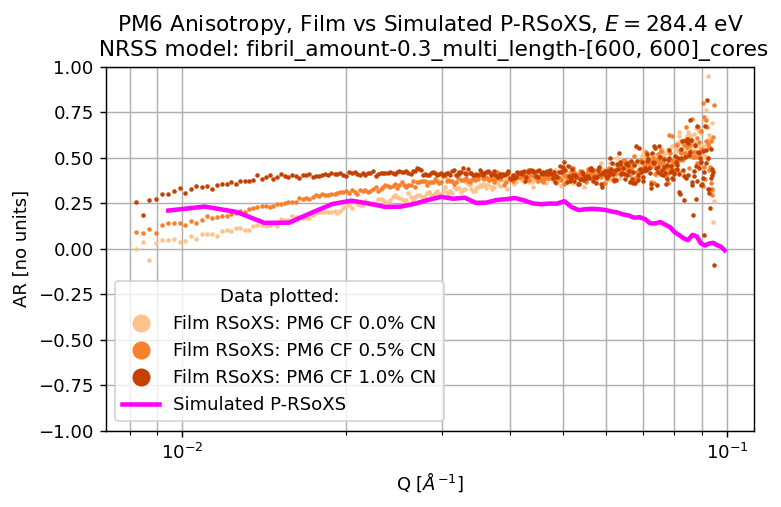

  0%|          | 0/3 [00:00<?, ?it/s]

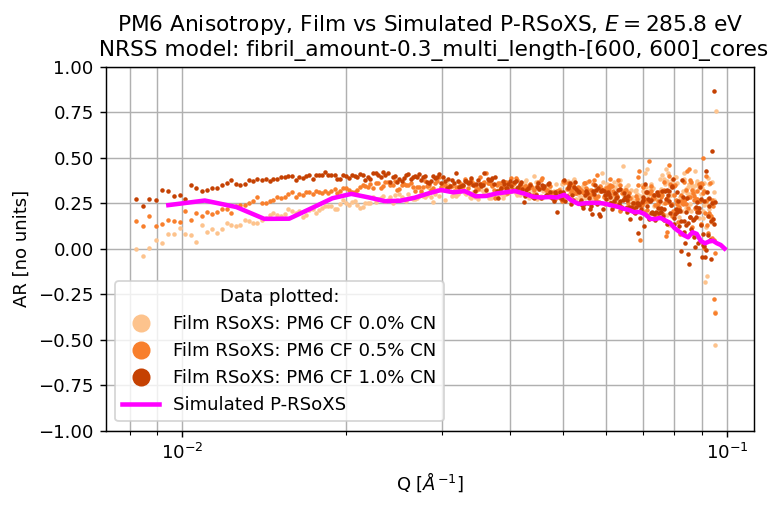

  0%|          | 0/3 [00:00<?, ?it/s]

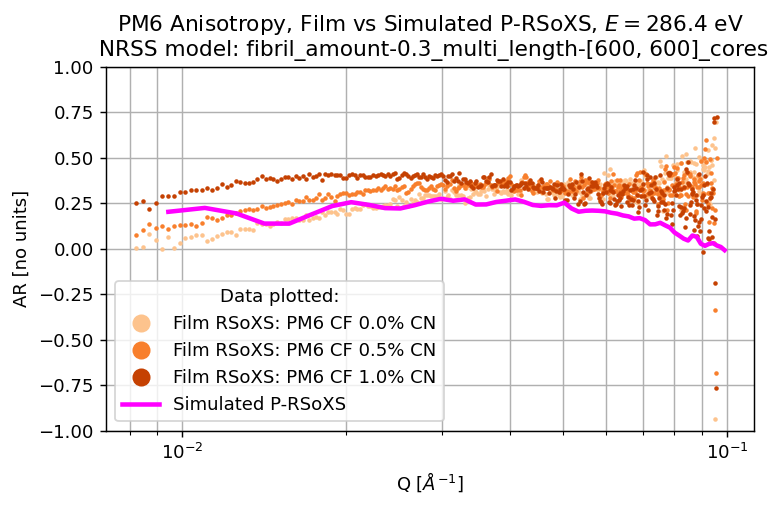

  0%|          | 0/3 [00:00<?, ?it/s]

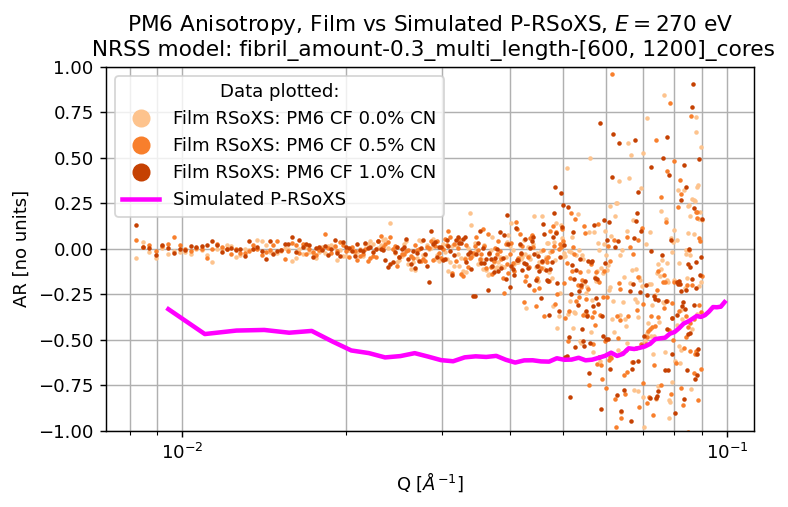

  0%|          | 0/3 [00:00<?, ?it/s]

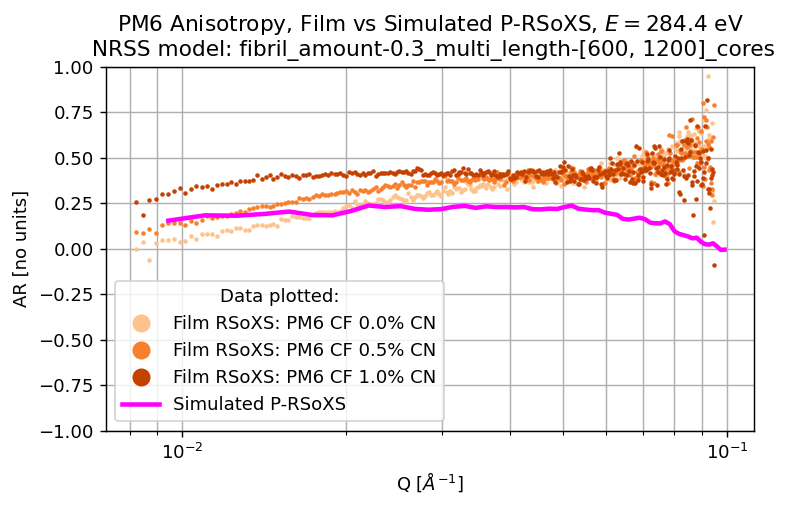

  0%|          | 0/3 [00:00<?, ?it/s]

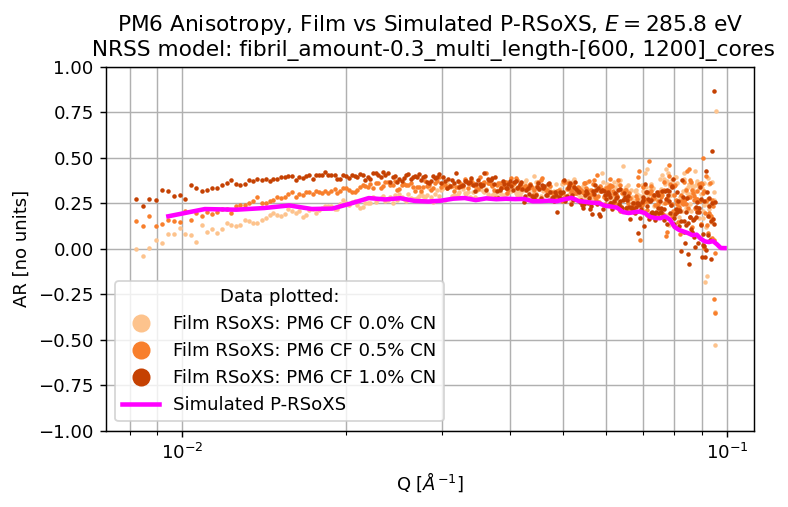

  0%|          | 0/3 [00:00<?, ?it/s]

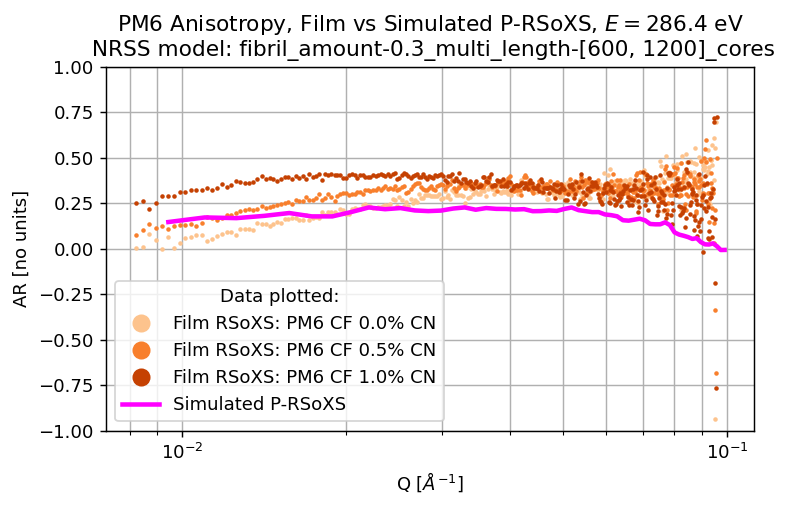

  0%|          | 0/3 [00:00<?, ?it/s]

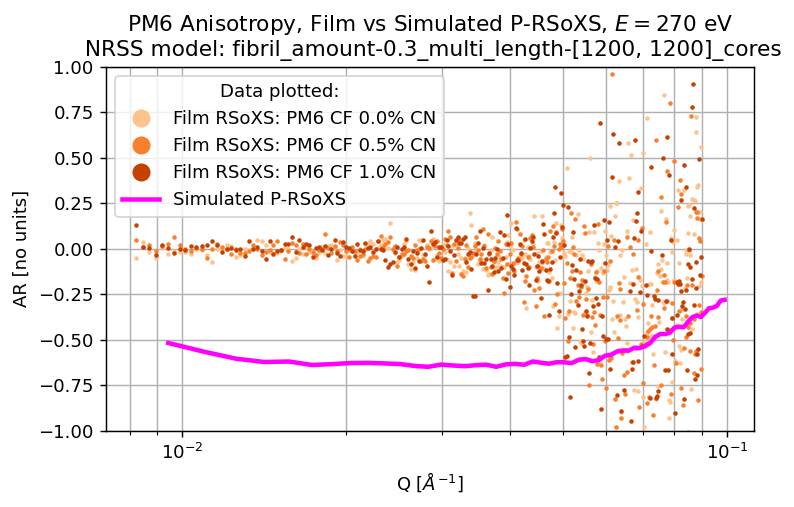

  0%|          | 0/3 [00:00<?, ?it/s]

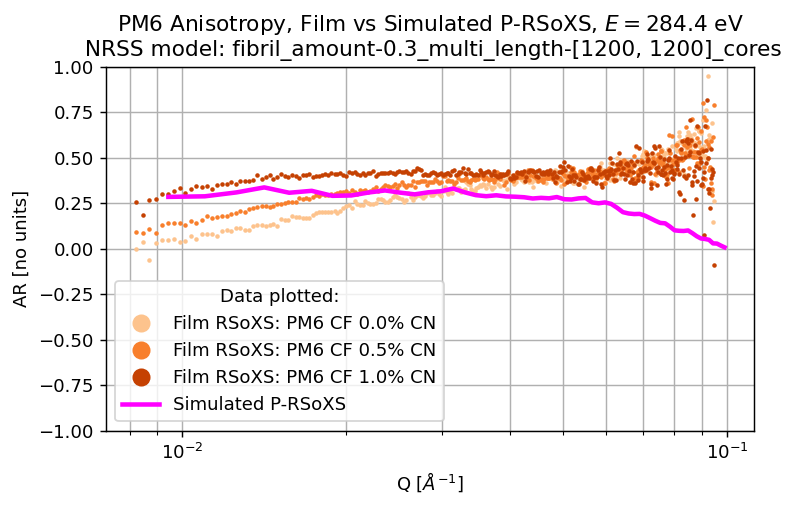

  0%|          | 0/3 [00:00<?, ?it/s]

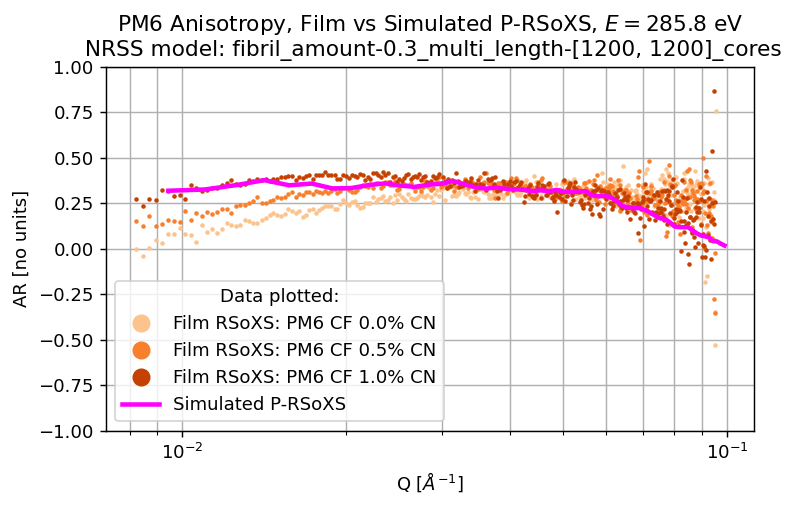

  0%|          | 0/3 [00:00<?, ?it/s]

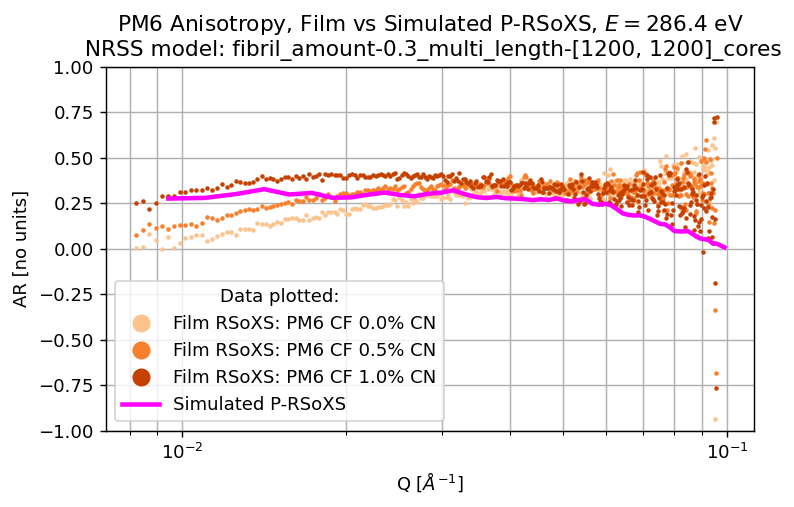

  0%|          | 0/3 [00:00<?, ?it/s]

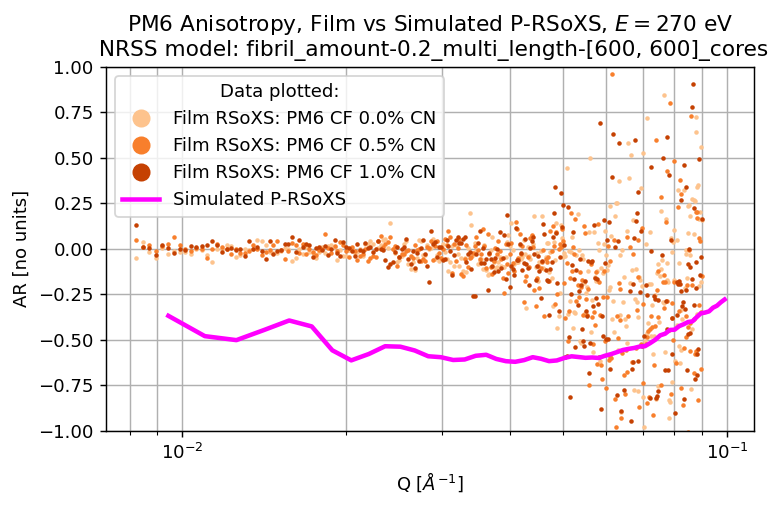

  0%|          | 0/3 [00:00<?, ?it/s]

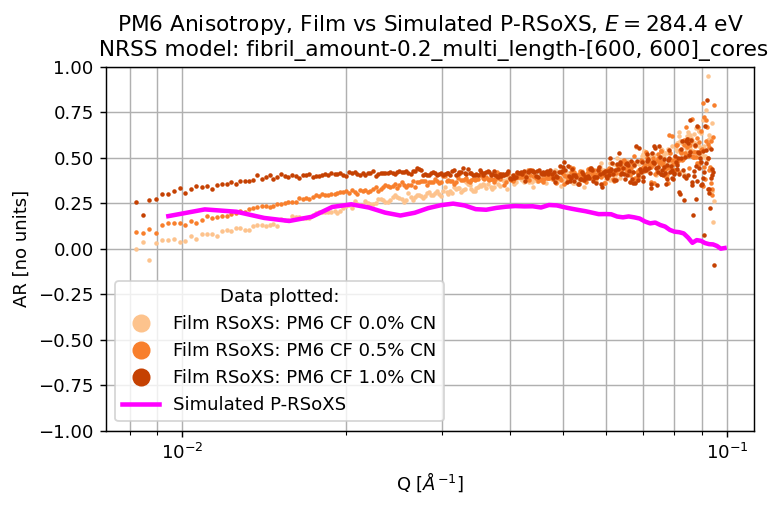

  0%|          | 0/3 [00:00<?, ?it/s]

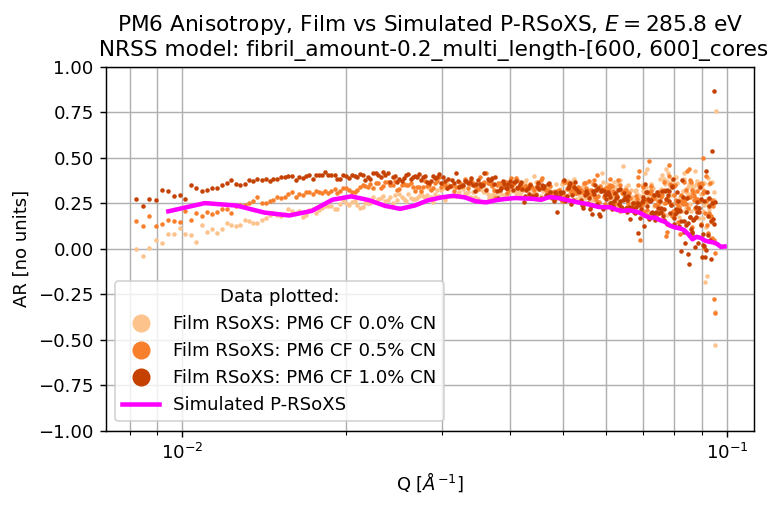

  0%|          | 0/3 [00:00<?, ?it/s]

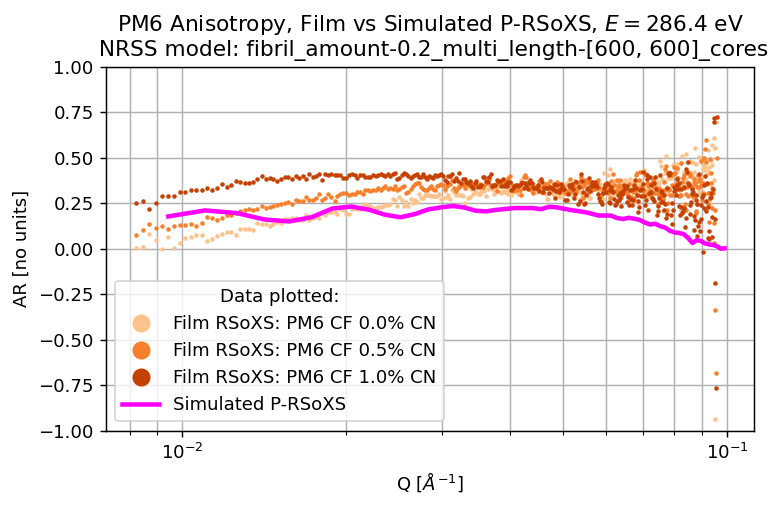

  0%|          | 0/3 [00:00<?, ?it/s]

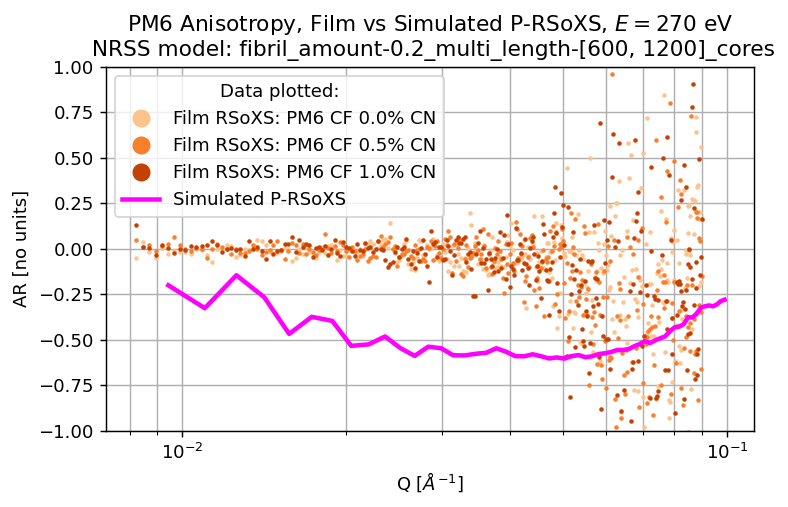

  0%|          | 0/3 [00:00<?, ?it/s]

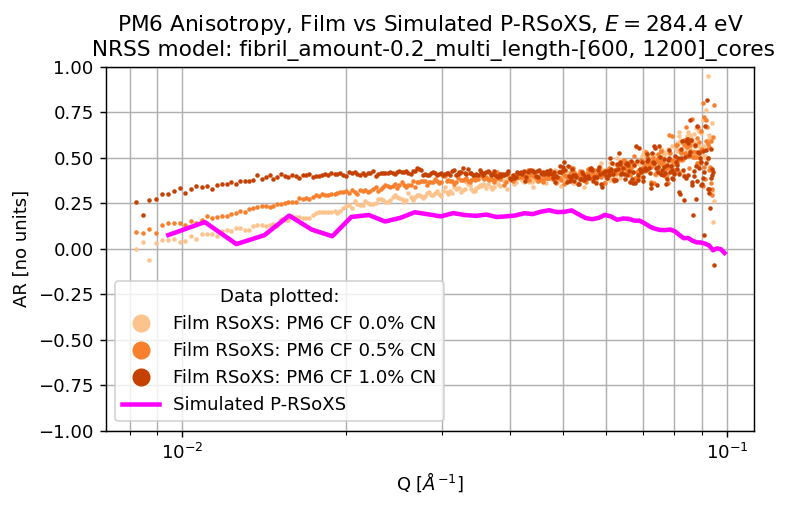

  0%|          | 0/3 [00:00<?, ?it/s]

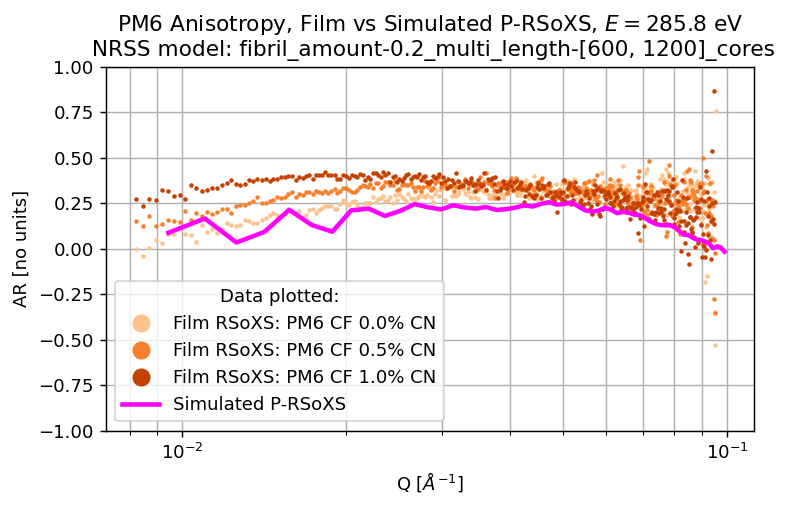

  0%|          | 0/3 [00:00<?, ?it/s]

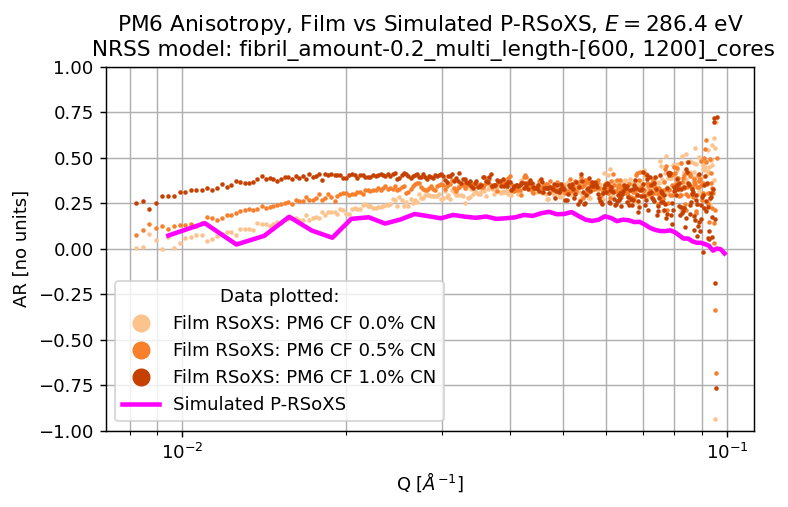

  0%|          | 0/3 [00:00<?, ?it/s]

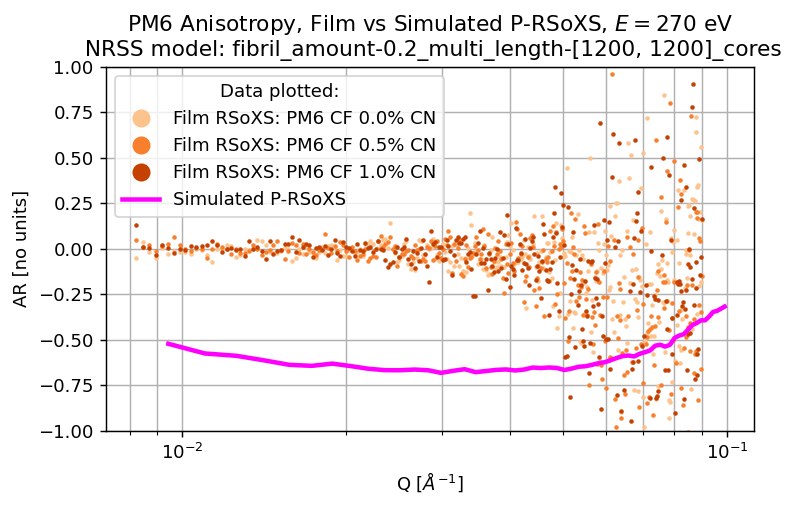

  0%|          | 0/3 [00:00<?, ?it/s]

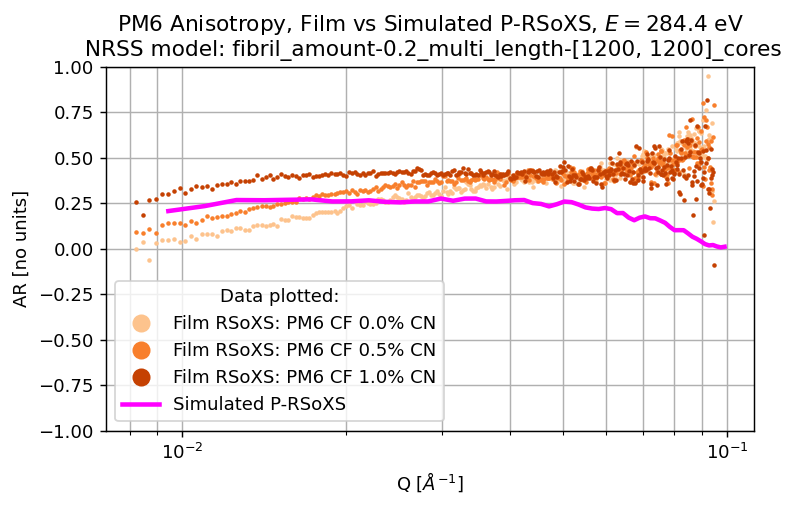

  0%|          | 0/3 [00:00<?, ?it/s]

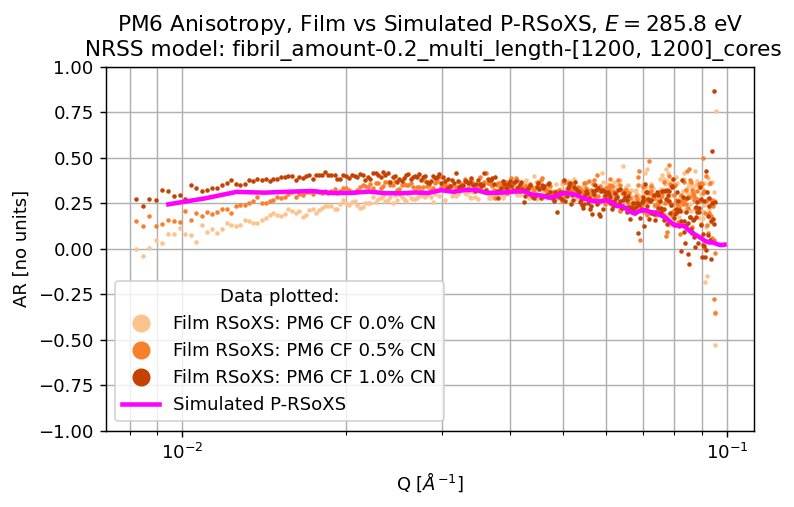

  0%|          | 0/3 [00:00<?, ?it/s]

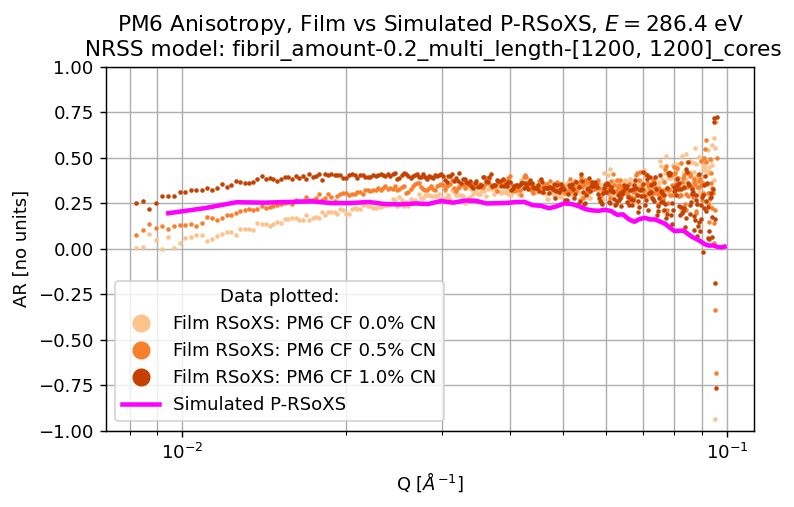

  0%|          | 0/3 [00:00<?, ?it/s]

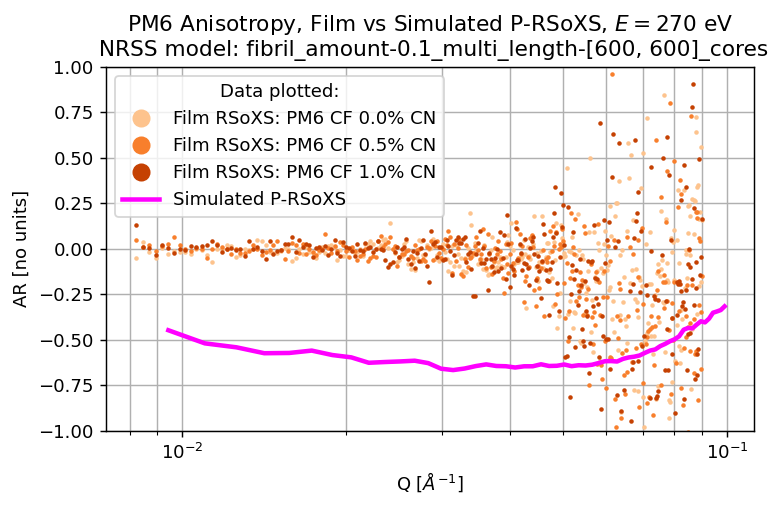

  0%|          | 0/3 [00:00<?, ?it/s]

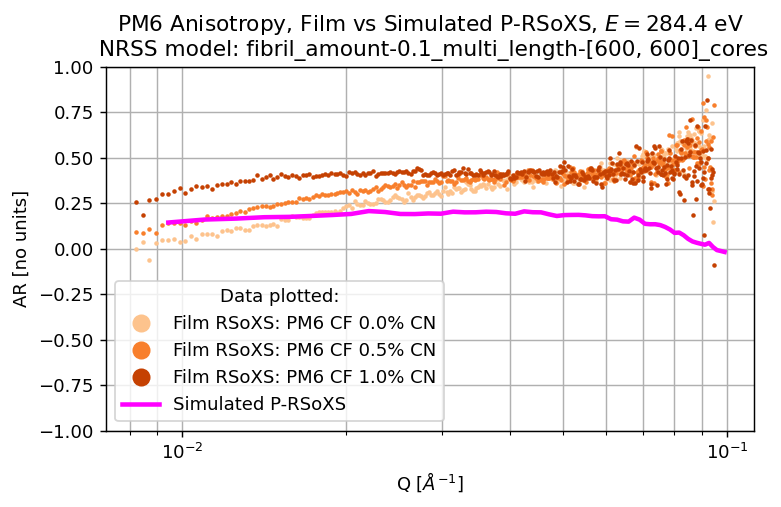

  0%|          | 0/3 [00:00<?, ?it/s]

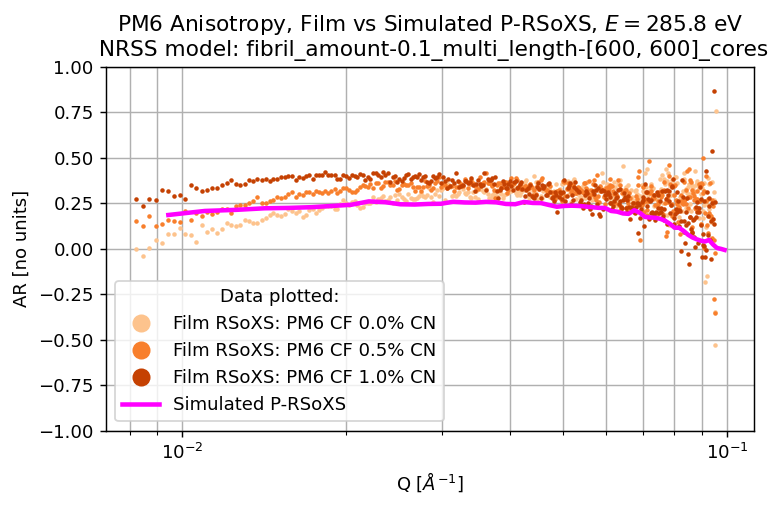

  0%|          | 0/3 [00:00<?, ?it/s]

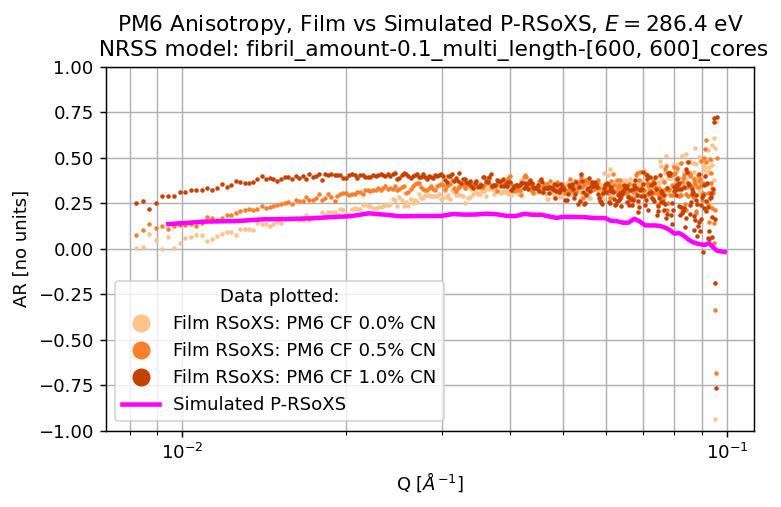

  0%|          | 0/3 [00:00<?, ?it/s]

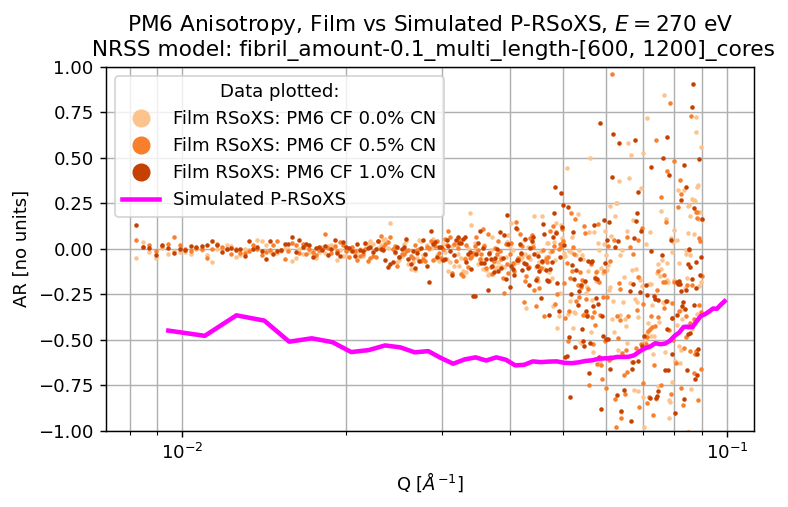

  0%|          | 0/3 [00:00<?, ?it/s]

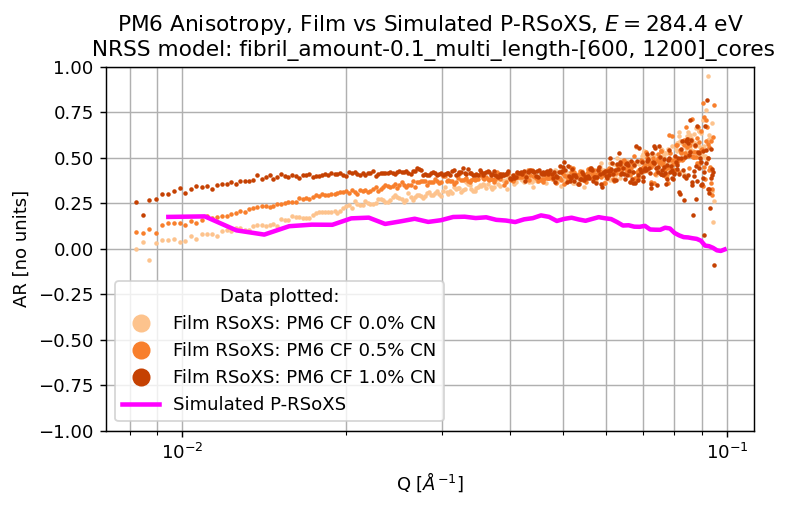

  0%|          | 0/3 [00:00<?, ?it/s]

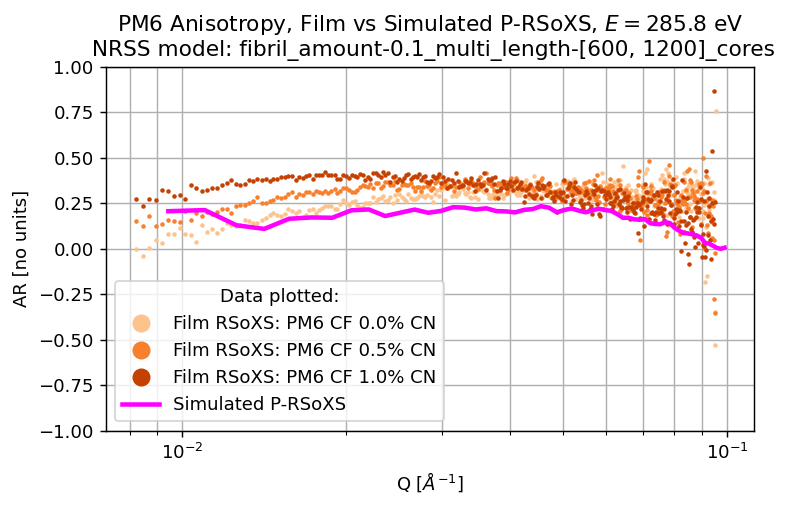

  0%|          | 0/3 [00:00<?, ?it/s]

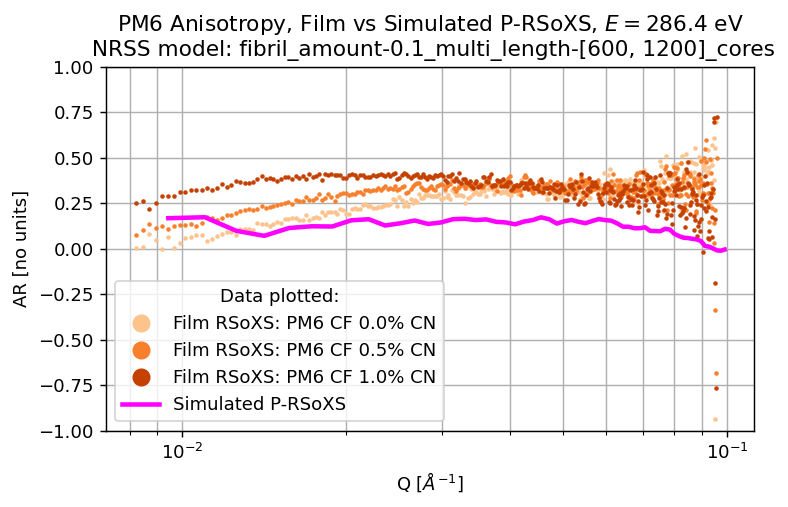

  0%|          | 0/3 [00:00<?, ?it/s]

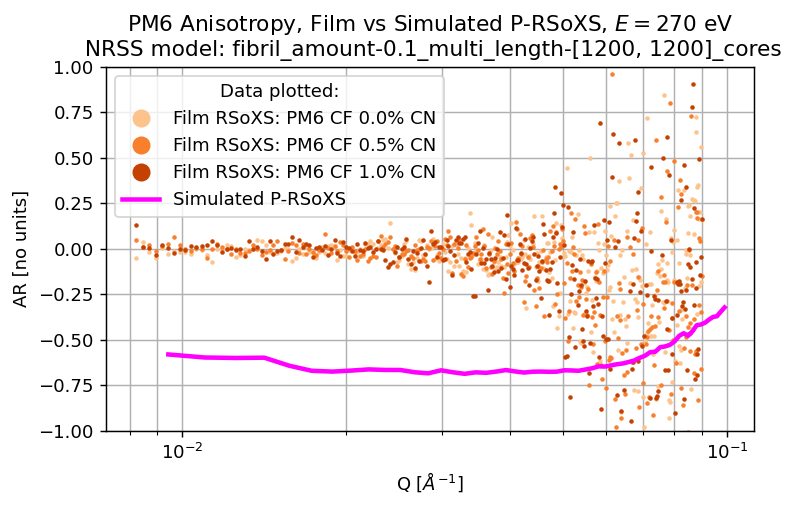

  0%|          | 0/3 [00:00<?, ?it/s]

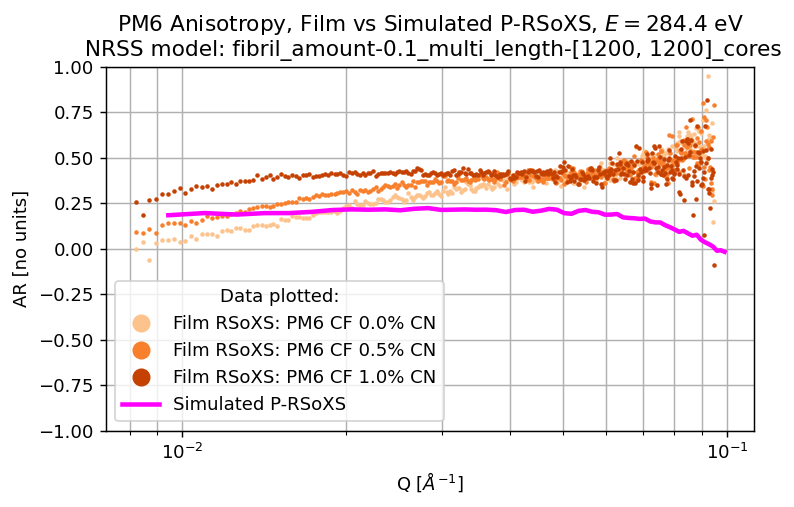

  0%|          | 0/3 [00:00<?, ?it/s]

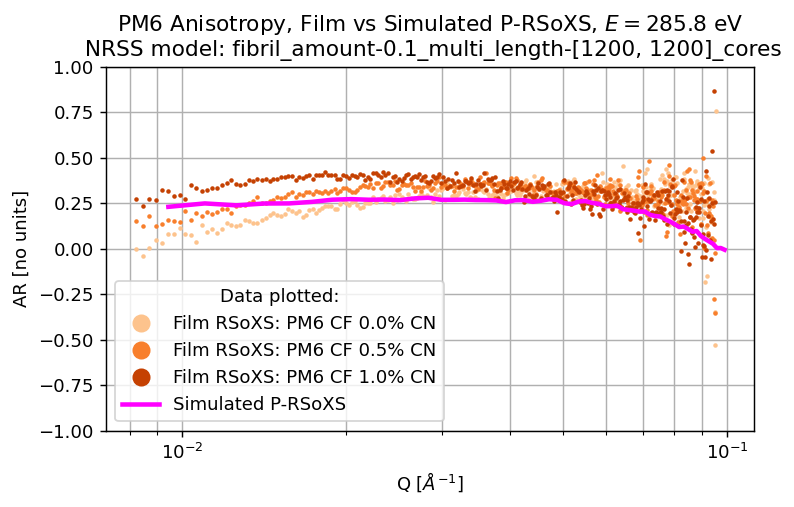

  0%|          | 0/3 [00:00<?, ?it/s]

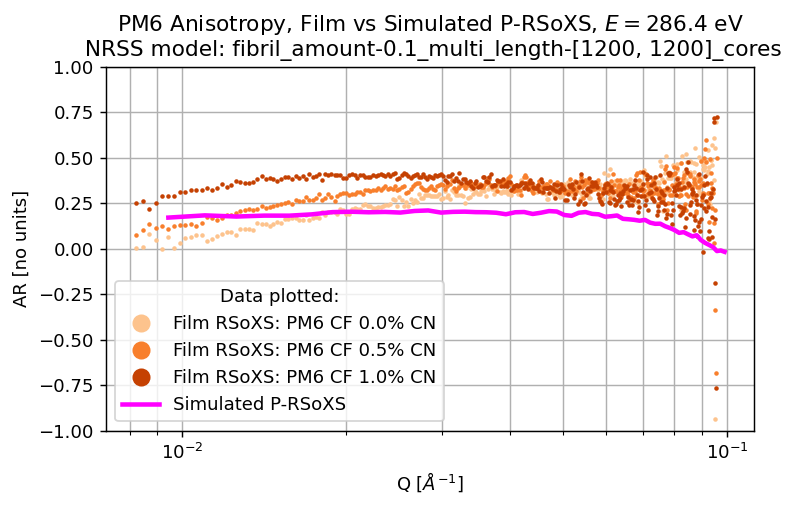

In [92]:
%matplotlib inline
plt.close('all')

# make selection
DS = re_caked_DS.copy()
intensity_type = 'corr'
soln_mat = 'PM6'

energy = 285.2
q_slice = slice(0.008, 0.1)



sn = {'PM6_CF': 'PM6 CF 0.0% CN',
      'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
      'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
      'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

# selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']

rsoxs_colors = plt.cm.Oranges(np.linspace(0.3,0.8,len(selected_samples)))

for data_var in tqdm(sorted(cy_caked_DS.data_vars)[::-1]):
    for energy in [270, 284.4, 285.8, 286.4]:
        sel_DA = cy_caked_DS[data_var].compute()
        
        fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=130)
    
    
        cy_para_DA = sel_DA.compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
        cy_perp_DA = sel_DA.compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
    
        # Select AvQ data
        cy_ar_DA = (cy_para_DA.mean('chi') - cy_perp_DA.mean('chi')) / (cy_para_DA.mean('chi') + cy_perp_DA.mean('chi'))
    
        # # Plot AvQ profile:
        # cy_ar_DA.sel(q=q_slice,energy=energy).plot.line(
        #     ax=ax, color='g', label=f'Sim RSoXS: {data_var}', linestyle='--', xscale='log')
        
        for i, sample_name in enumerate(tqdm(selected_samples)):
            fl_corr_frac = 0.9
            para_DA, perp_DA, fl_corr_DA = make_para_perp_DAs(
                re_caked_DS[f'{intensity_type}_intensity'].sel(sample_name=sample_name), fl_corr_frac)

            # Select AvQ data
            ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))
        
            # Plot AvQ profile:
            ar_DA.sel(q=q_slice,energy=energy).plot.line(
                ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
                linestyle='None', xscale='log', marker='.', markersize=3)
    
            # # Plot rsoxs diff profile:
            # DA.plot.line(ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
            #              linestyle='None', marker='.', markersize=3)
        
        # Plot AvQ profile:
        cy_ar_DA.sel(q=q_slice,energy=energy).plot.line(
            ax=ax, color='magenta', label=f'Simulated P-RSoXS', linestyle='-', linewidth=2.5)
        
        ax.set(title=f'{soln_mat} Anisotropy, Film vs Simulated P-RSoXS, $E={energy}$ eV \n NRSS model: {data_var}', ylim=(-1, 1))
        ax.set(xscale='log', ylabel='AR [no units]', xlabel='Q [$Å^{-1}$]')
        ax.grid(axis='y')
        ax.grid(axis='x', which='both')    
        legend = ax.legend(title=f'Data plotted:')
        for handle in legend.legend_handles:
            handle.set_markersize(18)
    
        fig.savefig(AvQcomparisonsPath.joinpath(f'{data_var}_{energy}-eV.png'), dpi=120)
        
        plt.show()
        plt.close('all')

In [ ]:
AvQcomparisonsPath

## Other parameter sweep plots 

### Check AFM

In [ ]:
afmPath = notebookPath.joinpath('afm_npys')
afm_npys = sorted(afmPath.glob('*.npy'))
afm_arr = np.load(afm_npys[0]) * 1e10

plt.imshow(afm_arr, origin='lower')  # This sample is 5x5um at 500x500 points
plt.colorbar()
plt.show()

In [ ]:
afm_lat_scale = 2  # Multiplier for laterial size (1 is real size; 2 is half the size )
# afm_lat_scale = args['afm_lat_scale']  # Multiplier for laterial size (1 is real size; 2 is half the size )

afm_DA = xr.DataArray(data=afm_arr, 
                      coords={'y':np.linspace(0,50000/afm_lat_scale,500), 'x':np.linspace(0,50000/afm_lat_scale,500)}).sel(
                      x=slice(0, args['voxel_size']*args['ld']), 
                      y=slice(0, args['voxel_size']*args['ld']))
afm_DA = afm_DA.interp({'x':np.linspace(afm_DA.x.data.min(),afm_DA.x.data.max(),args['ld']), 'y':np.linspace(afm_DA.y.data.min(),afm_DA.y.data.max(),args['ld'])})
afm_DA = afm_DA - afm_DA.min()
afm_DA = afm_DA / args['voxel_size']

flattening = 0
topo_DA = afm_DA * (1 - flattening) + flattening
afm_surf = topo_DA.data
depth = afm_surf.max() - afm_surf + flattening

topo_DA.plot.imshow()
print(np.isnan(topo_DA.data).mean())

plt.show()

In [ ]:
# Step 1: Compute gradients (dz/dx and dz/dy)
topo = topo_DA.copy()

dz_dy, dz_dx = np.gradient(topo.values)

# In-plane direction of steepest slope
psi = np.arctan2(dz_dy, dz_dx) % (2 * np.pi)

# Out-of-plane inclination from vertical
grad_mag_sq = dz_dx**2 + dz_dy**2
theta = np.arccos(1 / np.sqrt(1 + grad_mag_sq))  # from +z

# Wrap back into xarray if needed
psi_DA = xr.DataArray(psi, coords=topo.coords, dims=topo.dims)
theta_DA = xr.DataArray(theta, coords=topo.coords, dims=topo.dims)



In [ ]:
psi_DA.plot.imshow()
plt.show()

In [ ]:
plt.hist(np.rad2deg(psi_DA).data.flatten(), bins=200)
plt.show()

In [ ]:
theta_DA.plot.imshow()
plt.show()

In [ ]:
plt.hist(np.rad2deg(theta_DA).data.flatten(), bins=200)
plt.show()

### "Absolute difference plots"
Generally a bad idea, but might be interesting to compare

In [ ]:
for data_var in tqdm(cy_caked_DS.data_vars):
    DA = cy_caked_DS[data_var].compute().sel(q=q_slice)

    para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

    # Select AR data
    cut_DA = (para_DA.mean('chi') - perp_DA.mean('chi'))

    # Plot   
    energies = para_DA.energy.sel(energy=[265, 275, 283, 284, 284.4, 284.8, 285.2, 285.6, 286.2, 287, 300, 340], method='nearest').data
    cmap = plt.cm.turbo.copy()
    colors = cmap(np.linspace(0, 1, len(energies)))        

    fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=120)

    for j, energy in enumerate(energies):
        (cut_DA.sel(energy=energy).plot.line(ax=ax, color=colors[j], label=energy, xscale='log', yscale='log'))

    fig.suptitle(f'Anisotropy Ratio Linecuts: {data_var}', x=0.46, y=0.95)

    ax.set(title=f'{data_var}', ylabel='AR [no units]', xlabel='Q [$Å^{-1}$]')
    ax.grid(axis='y')
    ax.grid(axis='x', which='both')
    ax.legend(title='Energy [eV]', loc=(1.03,0.02))

    # fig.savefig(arCutsPath.joinpath(f'{data_var}.png'), dpi=120)

    plt.show()
    plt.close('all')

## Load all parameter sweeps for linear combinations

In [ ]:
# attributes = [
#     'core_S',
#     'shell_S',
#     'fibril_diam',
#     'fibril_length',
#     'fibril_shell_length',
#     'fibril_tilt',
#     'matrix_vaccum_frac',
#     'molecular_orientation',
# ]

#### Caked

In [7]:
sorted(outputsPath.glob(f'paramsID-{params_ID}*'))
# sorted(outputsPath.glob(f'paramsID-*_fibril*'))

[PosixPath('/projects/anle1278/nrss_simple_fibril_sweeps/simple_fibril_sweeps_outputs/paramsID-85_surface_S_flattening_afm_lat_scale'),
 PosixPath('/projects/anle1278/nrss_simple_fibril_sweeps/simple_fibril_sweeps_outputs/paramsID-85_surface_S_flattening_afm_lat_scale_result_plots')]

In [ ]:
sorted(outputsPath.glob(f'paramsID-85_*'))

In [ ]:
sorted(notebookPath.joinpath(
        'simple_fibril_sweeps_zarrs').glob(f'paramsID-86_*'))

In [ ]:
params_ID = 86
modelPath = sorted(outputsPath.glob(f'paramsID-{params_ID}_*'))[0]

# simPath = sorted(notebookPath.joinpath('multiple_fibril_sweeps_zarrs').glob(f'paramsID-{params_ID}_*'))[0]
simPath = sorted(notebookPath.joinpath('simple_fibril_sweeps_zarrs').glob(f'paramsID-{params_ID}_*'))[0]

display(modelPath)
display(simPath)

In [ ]:
sorted(simPath.glob('*caked*'))

In [100]:
afm_modelPath = notebookPath.joinpath('simple_fibril_sweeps_outputs', 'paramsID-85_surface_S_flattening_afm_lat_scale')
afm_simPath = notebookPath.joinpath('simple_fibril_sweeps_zarrs', 'paramsID-85_surface_S_flattening_afm_lat_scale_result_zarrs')

print(afm_modelPath.exists())
print(afm_modelPath)
print(afm_simPath.exists())
print(afm_simPath)

True
/projects/anle1278/nrss_simple_fibril_sweeps/simple_fibril_sweeps_outputs/paramsID-85_surface_S_flattening_afm_lat_scale
True
/projects/anle1278/nrss_simple_fibril_sweeps/simple_fibril_sweeps_zarrs/paramsID-85_surface_S_flattening_afm_lat_scale_result_zarrs


In [103]:
modelPath = notebookPath.joinpath('multiple_fibril_sweeps_outputs', 'paramsID-40_fibril_amount_multi_length')
simPath = notebookPath.joinpath('multiple_fibril_sweeps_zarrs', 'paramsID-40_fibril_amount_multi_length_result_zarrs')

print(modelPath.exists())
print(modelPath)
print(simPath.exists())
print(simPath)

True
/projects/anle1278/nrss_simple_fibril_sweeps/multiple_fibril_sweeps_outputs/paramsID-40_fibril_amount_multi_length
True
/projects/anle1278/nrss_simple_fibril_sweeps/multiple_fibril_sweeps_zarrs/paramsID-40_fibril_amount_multi_length_result_zarrs


In [112]:
params_ID = int(modelPath.name.split('_')[0].split('-')[-1])

'40'

In [9]:
# selected_params_IDs = np.arange(20,26,1).tolist()
selected_params_IDs = [85, 86]

cy_caked_DSs = []

for params_ID in tqdm(selected_params_IDs):
    modelPath = sorted(outputsPath.glob(f'paramsID-{params_ID}_*'))[0]
    simPath = sorted(notebookPath.joinpath(
        'simple_fibril_sweeps_zarrs').glob(f'paramsID-{params_ID}_*'))[0]

# model_paths = [afm_modelPath, modelPath]
# sim_paths =   [afm_simPath, simPath]

# for modelPath, simPath in zip(model_paths, sim_paths):
#     params_ID = int(modelPath.name.split('_')[0].split('-')[-1])
    
    with modelPath.joinpath('args.json').open('r') as f:
        args = json.load(f)
        display(args)

    # Load datasets with each unique parameter values in sweep as data variables
    DSs = []
    for i, cy_caked_zarr in enumerate(sorted(simPath.glob('*caked*'))):
        DS = xr.open_zarr(cy_caked_zarr)
        
        # Get updated parameter values for each data variable to update attributes (arguments)
        for varname in sorted(DS.data_vars): 
            sweep_params = args['sweep_params']
            updated_params = {}
            for key in sweep_params:  # This is just to mine the param values from the varname
                key_pattern = f"{key}-"
                start = varname.find(key_pattern)
                if start != -1:
                    start += len(key_pattern)
                    end = varname.find('_', start)
                    if end == -1:
                        end = len(varname)
                    try:
                        val = float(varname[start:end])
                    except ValueError:
                        val = str(varname[start:end])
                updated_params[key] = val

            for k, v in updated_params.items():
                args[k] = v

            # display(args)
            DS[varname].attrs = args
            DS = DS.rename_vars({varname:f'ID-{params_ID}_{i+1}'})
            
        DSs.append(DS)
        
    cy_caked_DS = xr.merge(DSs)
    
    # Convert 1/nm default cyrsoxs output to 1/Å
    cy_caked_DS['q'] = cy_caked_DS.q / 10

    cy_caked_DSs.append(cy_caked_DS)

# Interpolate coordinates onto any with larger size (q and energy)
max_q_idx = np.argmax(np.array([DS.q.size for DS in cy_caked_DSs]))
max_e_idx = np.argmax(np.array([DS.energy.size for DS in cy_caked_DSs]))
for i, DS in enumerate(cy_caked_DSs):
    cy_caked_DSs[i] = DS.interp({'q':cy_caked_DSs[max_q_idx].q.values, 
                                 'energy':cy_caked_DSs[max_e_idx].energy.values})

# [display(DS) for DS in cy_caked_DSs]

full_cy_caked_DS = xr.merge(cy_caked_DSs)
full_cy_caked_DS

  0%|          | 0/2 [00:00<?, ?it/s]

{'params_ID': 85,
 'sweep_params': ['surface_S', 'flattening', 'afm_lat_scale'],
 'sweep_params_values': [[0, 0.1],
  [0, 0.3, 0.6, 0.9],
  [1, 2, 3, 4, 5, 7.5, 10, 12.5]],
 'fibril_length': 400,
 'fibril_diam': 50,
 'fibril_roll': 0,
 'fibril_tilt': 80,
 'core_orientation': 'F',
 'core_orientation_std': 75,
 'core_S': 0,
 'core_vacuum_frac': 0.1,
 'voxel_size': 15.625,
 'ld': 256,
 'vd': 128,
 'fibril_center_ld': 128,
 'fibril_center_vd': 64,
 'matrix_vacuum_frac': 0.1,
 'EAngleRot': [0, 3, 360],
 'surface_theta': 60,
 'surface_psi': 'random',
 'surface_size': 50,
 'surface_S': 0,
 'roughness_ID': 1,
 'flattening': 0.9,
 'afm_lat_scale': 4,
 'oc_ID': 3,
 'energies': [265,
  270,
  275,
  278,
  280,
  281,
  282,
  282.2,
  282.4,
  282.6,
  282.8,
  283.0,
  283.2,
  283.4,
  283.6,
  283.8,
  284.0,
  284.2,
  284.4,
  284.6,
  284.8,
  285.0,
  285.2,
  285.4,
  285.6,
  285.8,
  286.0,
  286.2,
  286.4,
  286.6,
  286.8,
  287.0,
  287.2,
  287.4,
  287.6,
  287.8,
  288.0,
  288.

{'params_ID': 86,
 'sweep_params': ['fibril_diam', 'fibril_tilt'],
 'sweep_params_values': [[40,
   45,
   50,
   55,
   60,
   65,
   70,
   80,
   90,
   100,
   120,
   140,
   160,
   180,
   200,
   300,
   400,
   500,
   600,
   700],
  [70, 80, 90]],
 'fibril_length': 600,
 'fibril_diam': 50,
 'fibril_roll': 0,
 'fibril_tilt': 90,
 'core_orientation': 'F',
 'core_orientation_std': 75,
 'core_S': 1,
 'core_vacuum_frac': 0.05,
 'voxel_size': 15.625,
 'ld': 256,
 'vd': 128,
 'fibril_center_ld': 128,
 'fibril_center_vd': 64,
 'matrix_vacuum_frac': 0.1,
 'EAngleRot': [0, 3, 360],
 'surface_theta': 60,
 'surface_psi': 'random',
 'surface_size': 50,
 'surface_S': 0,
 'roughness_ID': None,
 'flattening': 1,
 'afm_lat_scale': 1,
 'oc_ID': 3,
 'energies': [265,
  270,
  275,
  278,
  280,
  281,
  282,
  282.2,
  282.4,
  282.6,
  282.8,
  283.0,
  283.2,
  283.4,
  283.6,
  283.8,
  284.0,
  284.2,
  284.4,
  284.6,
  284.8,
  285.0,
  285.2,
  285.4,
  285.6,
  285.8,
  286.0,
  286.2,

<xarray.Dataset> Size: 2GB
Dimensions:   (chi: 360, energy: 61, q: 182)
Coordinates:
  * chi       (chi) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * q         (q) float64 1kB 0.0 0.001571 0.003142 ... 0.2812 0.2828 0.2843
  * energy    (energy) float64 488B 265.0 270.0 275.0 ... 330.0 335.0 340.0
Data variables: (12/124)
    ID-85_1   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_2   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_3   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_4   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_5   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_6   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ...        ...
    ID-86_55  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_56  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_57  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_58  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_59  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_60  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>

#### Recip

In [ ]:
# # selected_params_IDs = np.arange(20,26,1).tolist()
# selected_params_IDs = [33,34]

# cy_recip_DSs = []

# for params_ID in tqdm(selected_params_IDs):
#     modelPath = sorted(outputsPath.glob(f'paramsID-{params_ID}*_fibril*'))[0]
#     simPath = sorted(notebookPath.joinpath(
#         'simple_fibril_sweeps_zarrs').glob(f'paramsID-{params_ID}*_fibril*'))[0]
    
#     with modelPath.joinpath('args.json').open('r') as f:
#         args = json.load(f)

#     # Load datasets with each unique parameter values in sweep as data variables
#     DSs = []
#     print(len(sorted(simPath.glob('*recip*'))))
          
#     for i, cy_recip_zarr in enumerate(sorted(simPath.glob('*recip*'))):
#         DS = xr.open_zarr(cy_recip_zarr)
        
#         # Get updated parameter values for each data variable to update attributes (arguments)
#         for varname in sorted(DS.data_vars): 
#             sweep_params = args['sweep_params']
#             updated_params = {}
#             for key in sweep_params:  # This is just to mine the param values from the varname
#                 key_pattern = f"{key}-"
#                 start = varname.find(key_pattern)
#                 if start != -1:
#                     start += len(key_pattern)
#                     end = varname.find('_', start)
#                     if end == -1:
#                         end = len(varname)
#                     try:
#                         val = float(varname[start:end])
#                     except ValueError:
#                         val = str(varname[start:end])
#                 updated_params[key] = val

#             for k, v in updated_params.items():
#                 args[k] = v

#             DS[varname].attrs = args
#             DS = DS.rename_vars({varname:f'ID-{params_ID}_{i+1}'})
            
#         DSs.append(DS)
        
#     cy_recip_DS = xr.merge(DSs)
    
#     # Convert 1/nm default cyrsoxs output to 1/Å
#     cy_recip_DS['qx'] = cy_recip_DS.qx / 10
#     cy_recip_DS['qy'] = cy_recip_DS.qy / 10

#     cy_recip_DSs.append(cy_recip_DS)

# # Interpolate coordinates onto any with larger size (q and energy)
# max_qx_idx = np.argmax(np.array([DS.qx.size for DS in cy_recip_DSs]))
# max_qy_idx = np.argmax(np.array([DS.qy.size for DS in cy_recip_DSs]))
# max_e_idx = np.argmax(np.array([DS.energy.size for DS in cy_recip_DSs]))
# for i, DS in enumerate(cy_recip_DSs):
#     cy_recip_DSs[i] = DS.interp({'qx':cy_recip_DSs[max_qx_idx].qx.values, 
#                                  'qy':cy_recip_DSs[max_qx_idx].qy.values,
#                                  'energy':cy_recip_DSs[max_e_idx].energy.values})

# # [display(DS) for DS in cy_recip_DSs]

# full_cy_recip_DS = xr.merge(cy_recip_DSs)
# full_cy_recip_DS

## Combining

In [10]:
lo_shape, lo_diam, lo_std = [-1, 35.00171706526209, 37.88649765362167]
hi_shape, hi_diam, hi_std = [-1, 531.4308346353963, 348.38150246164275]
lo_weight = 0.9997304126284063

def area_weighted_skewnorm_pdf(d, weight2, shape2, loc2, scale2, shape3, loc3, scale3):
    pdf2 = skewnorm.pdf(d, a=shape2, loc=loc2, scale=scale2)
    pdf3 = skewnorm.pdf(d, a=shape3, loc=loc3, scale=scale3)
    area = d**2
    return (weight2 * pdf2 * area) + ((1 - weight2) * pdf3 * area)

def sample_area_weighted_skewnorm(n_samples, weight2,
                                   shape2, loc2, scale2,
                                   shape3, loc3, scale3,
                                   d_min, d_max, oversample_factor=5):
    # Create a grid over which to evaluate the PDF
    d_grid = np.linspace(d_min, d_max, 1000)
    pdf_vals = area_weighted_skewnorm_pdf(d_grid, weight2, shape2, loc2, scale2,
                                                   shape3, loc3, scale3)
    pdf_max = pdf_vals.max()

    samples = []
    while len(samples) < n_samples:
        # Propose uniformly
        d_proposed = np.random.uniform(d_min, d_max, oversample_factor * n_samples)
        # Evaluate the custom PDF at these points
        p = area_weighted_skewnorm_pdf(d_proposed, weight2, shape2, loc2, scale2,
                                                     shape3, loc3, scale3)
        accept_prob = p / pdf_max
        u = np.random.rand(len(d_proposed))
        accepted = d_proposed[u < accept_prob]
        samples.extend(accepted)

    return np.array(samples[:n_samples])

def weighted_skewnorm_pdf(d, weight2, shape2, loc2, scale2, shape3, loc3, scale3):
    pdf2 = skewnorm.pdf(d, a=shape2, loc=loc2, scale=scale2)
    pdf3 = skewnorm.pdf(d, a=shape3, loc=loc3, scale=scale3)
    return (weight2 * pdf2) + ((1 - weight2) * pdf3)

def sample_weighted_skewnorm(n_samples, weight2,
                             shape2, loc2, scale2,
                             shape3, loc3, scale3,
                             d_min, d_max, oversample_factor=5):
    # Create a grid over which to evaluate the PDF
    d_grid = np.linspace(d_min, d_max, 1000)
    pdf_vals = weighted_skewnorm_pdf(d_grid, weight2, shape2, loc2, scale2,
                                                   shape3, loc3, scale3)
    pdf_max = pdf_vals.max()

    samples = []
    while len(samples) < n_samples:
        # Propose uniformly
        d_proposed = np.random.uniform(d_min, d_max, oversample_factor * n_samples)
        # Evaluate the custom PDF at these points
        p = weighted_skewnorm_pdf(d_proposed, weight2, shape2, loc2, scale2,
                                                     shape3, loc3, scale3)
        accept_prob = p / pdf_max
        u = np.random.rand(len(d_proposed))
        accepted = d_proposed[u < accept_prob]
        samples.extend(accepted)

    return np.array(samples[:n_samples])

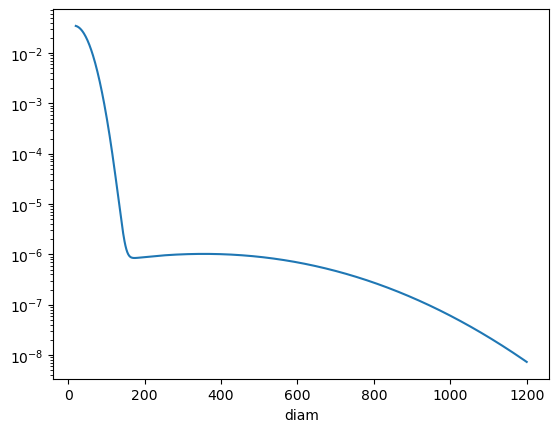

In [11]:
d_grid = np.linspace(20, 1200, 1000)

pdf_vals = weighted_skewnorm_pdf(d_grid, weight2=lo_weight,
    shape2=lo_shape, loc2=lo_diam, scale2=lo_std,
    shape3=hi_shape, loc3=hi_diam, scale3=hi_std)

# pdf_vals = area_weighted_skewnorm_pdf(d_grid, weight2=lo_weight,
#     shape2=lo_shape, loc2=lo_diam, scale2=lo_std,
#     shape3=hi_shape, loc3=hi_diam, scale3=hi_std)

pdf_sum = pdf_vals.sum()

# pdf_vals = pdf_vals * (1/(d_grid**2))
# pdf_vals = pdf_vals * d_grid

normed_pdf = pdf_vals / pdf_sum

pdf_DA = xr.DataArray(data=normed_pdf, coords={'diam':d_grid})

pdf_DA.plot.line(yscale='log')
plt.show()

# plt.plot(d_grid,normed_pdf)
# # plt.xscale('log')
# plt.yscale('log')
# plt.show()

In [ ]:
DA.attrs['fibril_diam']

In [ ]:
DA.name

In [12]:
diam_boundaries = [  0, 200]  # where split up loaded diameters for assignments below (must start at 0) 
multi_tilt =     [ 90,  90]
multi_length =   [600, 600]

idx = (20 > np.array(diam_boundaries)).nonzero()[0][-1]
idx

np.int64(0)

In [13]:
DS_to_sum = xr.Dataset()
for DA in full_cy_caked_DS.data_vars.values():
    diam = DA.attrs['fibril_diam']
    tilt = DA.attrs['fibril_tilt']
    length = DA.attrs['fibril_length']
    core_vacuum_frac = DA.attrs['core_vacuum_frac']


    # Choose weight(s) to use
    weight = float(pdf_DA.sel(diam=diam, method='nearest'))
    
    if diam < 65:
        weight = weight * 3
    # else:
    #     weight = 0.05

    # idx = (diam > np.array(diam_boundaries)).nonzero()[0][-1]
    # if diam > 60 and tilt == multi_tilt[idx] and length > 300:
    # if diam > 40 and diam < 80 and length > 599 and core_vacuum_frac==0.05:
    if diam > 30 and length > 599 and core_vacuum_frac==0.05:
        DS_to_sum[DA.name] = weight * DA
        DS_to_sum[DA.name].attrs = DA.attrs

        # print(tilt)
        print(diam, length)
        print(DA.attrs['core_orientation_std'])

display(DS_to_sum)

100.0 600
75
100.0 600
75
100.0 600
75
120.0 600
75
120.0 600
75
120.0 600
75
140.0 600
75
140.0 600
75
140.0 600
75
160.0 600
75
160.0 600
75
160.0 600
75
180.0 600
75
180.0 600
75
180.0 600
75
200.0 600
75
200.0 600
75
200.0 600
75
300.0 600
75
300.0 600
75
300.0 600
75
400.0 600
75
400.0 600
75
400.0 600
75
40.0 600
75
40.0 600
75
40.0 600
75
45.0 600
75
45.0 600
75
45.0 600
75
500.0 600
75
500.0 600
75
500.0 600
75
50.0 600
75
50.0 600
75
50.0 600
75
55.0 600
75
55.0 600
75
55.0 600
75
600.0 600
75
600.0 600
75
600.0 600
75
60.0 600
75
60.0 600
75
60.0 600
75
65.0 600
75
65.0 600
75
65.0 600
75
700.0 600
75
700.0 600
75
700.0 600
75
70.0 600
75
70.0 600
75
70.0 600
75
80.0 600
75
80.0 600
75
80.0 600
75
90.0 600
75
90.0 600
75
90.0 600
75


<xarray.Dataset> Size: 959MB
Dimensions:   (chi: 360, q: 182, energy: 61)
Coordinates:
  * chi       (chi) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * q         (q) float64 1kB 0.0 0.001571 0.003142 ... 0.2812 0.2828 0.2843
  * energy    (energy) float64 488B 265.0 270.0 275.0 ... 330.0 335.0 340.0
Data variables: (12/60)
    ID-86_1   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_2   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_3   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_4   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_5   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_6   (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ...        ...
    ID-86_55  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_56  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_57  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_58  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_59  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-86_60  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>

In [14]:
combined_DA = DS_to_sum.to_dataarray().sum('variable').compute()
combined_DA

<xarray.DataArray (energy: 61, chi: 360, q: 182)> Size: 16MB
array([[[3.9203768e+07, 1.9541255e+06, 1.8884029e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [3.9203768e+07, 1.9259485e+06, 1.8740869e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [3.9203768e+07, 1.9085640e+06, 1.9549055e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        ...,
        [3.9203768e+07, 1.9014132e+06, 2.1197863e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [3.9203768e+07, 1.9085640e+06, 1.9549055e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [3.9203768e+07, 1.9259485e+06, 1.8740869e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[2.9571118e+07, 1.4739824e+06, 1.4244090e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.9571118e+07, 1.4527285e+06, 1.4136128e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.9571118e+07, 1.4396152e+06, 1.4745722e+04, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
...
        [2.1229282e+08, 1.0296369e+07, 1.1478876e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.1229282e+08, 1.0335085e+07, 1.0586012e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.1229282e+08, 1.0429225e+07, 1.0148404e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[2.1699376e+08, 1.0816128e+07, 1.0452352e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.1699376e+08, 1.0660171e+07, 1.0373128e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.1699376e+08, 1.0563944e+07, 1.0820459e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        ...,
        [2.1699376e+08, 1.0524369e+07, 1.1733056e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.1699376e+08, 1.0563944e+07, 1.0820459e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [2.1699376e+08, 1.0660171e+07, 1.0373128e+05, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]]], dtype=float32)
Coordinates:
  * chi      (chi) float64 3kB -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * q        (q) float64 1kB 0.0 0.001571 0.003142 ... 0.2812 0.2828 0.2843
  * energy   (energy) float64 488B 265.0 270.0 275.0 278.0 ... 330.0 335.0 340.0

In [126]:
DA.attrs.get('length')

In [15]:
# multi_DS = full_cy_caked_DS[[
#     DA.name for DA in full_cy_caked_DS.data_vars.values() if 
#     DA.attrs.get('multi_length') == '[1200, 1200]' # and 
#     # DA.attrs['fibril_tilt'] in [24,28]
# ]]

# display(multi_DS)

# combined_DA = multi_DS.to_dataarray().sum('variable').compute()
# combined_DA

In [ ]:
# for data_var in DS_to_average.data_vars:
#     DS_to_average[data_var].sel(chi=slice(-45,45), q=slice(0.02,0.07)).mean('chi').mean('q').sel(energy=slice(278,294)).plot(yscale='log')
#     plt.show()
#     plt.close('all')

In [16]:
# A way to select DAtaarrays based on attribute values:
afm_DS = full_cy_caked_DS[[
    DA.name for DA in full_cy_caked_DS.data_vars.values() if 
    DA.attrs.get('core_vacuum_frac') == 0.1  and 
    DA.attrs.get('afm_lat_scale') < 10 and 
    DA.attrs.get('flattening') == 0 and
    DA.attrs.get('surface_S') == 0
    # DA.attrs['matrix_vacuum_frac'] in [0.1] and 
    # DA.attrs['fibril_tilt'] in [24,28]
]]

# lo_diam_DS = full_cy_caked_DS[[
#     DA.name for DA in full_cy_caked_DS.data_vars.values() if 
#     DA.attrs['fibril_diam'] < 200 and 
#     DA.attrs['fibril_diam'] > 120
#     # DA.attrs['matrix_vacuum_frac'] in [0.1] and 
#     # DA.attrs['fibril_tilt'] in [24,28]
# ]]

# hi_diam_DS = full_cy_caked_DS[[
#     DA.name for DA in full_cy_caked_DS.data_vars.values() if 
#     DA.attrs['fibril_diam'] > 200  # and 
#     # DA.attrs['matrix_vacuum_frac'] in [0.1] and 
#     # DA.attrs['fibril_tilt'] in [24,28]
# ]]

display(afm_DS)
# display(lo_diam_DS)
# display(hi_diam_DS)

<xarray.Dataset> Size: 96MB
Dimensions:   (energy: 61, chi: 360, q: 182)
Coordinates:
  * chi       (chi) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * q         (q) float64 1kB 0.0 0.001571 0.003142 ... 0.2812 0.2828 0.2843
  * energy    (energy) float64 488B 265.0 270.0 275.0 ... 330.0 335.0 340.0
Data variables:
    ID-85_59  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_60  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_61  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_62  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_63  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>
    ID-85_64  (energy, chi, q) float32 16MB dask.array<chunksize=(61, 15, 61), meta=np.ndarray>

In [17]:
# avg_hi_diam_DA = hi_diam_DS.to_dataarray().mean('variable').compute()
# avg_hi_diam_DA.attrs['name'] = 'avg_hi_diam_DA'
# display(avg_hi_diam_DA)

avg_afm_DA = afm_DS.to_dataarray().mean('variable').compute()
avg_afm_DA.attrs['name'] = 'avg_afm_DA'
display(avg_afm_DA)

# avg_lo_diam_DA = lo_diam_DS.to_dataarray().mean('variable').compute()
# avg_lo_diam_DA.attrs['name'] = 'avg_lo_diam_DA'
# display(avg_lo_diam_DA)

<xarray.DataArray (energy: 61, chi: 360, q: 182)> Size: 16MB
array([[[4.23967520e+07, 2.11331725e+06, 2.04406660e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [4.23967520e+07, 2.08284462e+06, 2.02858125e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [4.23967520e+07, 2.06404400e+06, 2.11597090e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        ...,
        [4.23967520e+07, 2.05631138e+06, 2.29427090e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [4.23967520e+07, 2.06404400e+06, 2.11597090e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [4.23967520e+07, 2.08284462e+06, 2.02858340e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[3.19795620e+07, 1.59405938e+06, 1.54182705e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [3.19795620e+07, 1.57107462e+06, 1.53014580e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [3.19795620e+07, 1.55689362e+06, 1.59606045e+04, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
...
        [2.29582976e+08, 1.11351470e+07, 1.24237000e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [2.29582976e+08, 1.11770190e+07, 1.14582000e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [2.29582976e+08, 1.12788270e+07, 1.09849836e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[2.34666800e+08, 1.16972450e+07, 1.13139664e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [2.34666800e+08, 1.15285840e+07, 1.12282336e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [2.34666800e+08, 1.14245200e+07, 1.17119500e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        ...,
        [2.34666800e+08, 1.13817170e+07, 1.26988500e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [2.34666800e+08, 1.14245200e+07, 1.17119336e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [2.34666800e+08, 1.15285840e+07, 1.12282336e+05, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]]], dtype=float32)
Coordinates:
  * chi      (chi) float64 3kB -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * q        (q) float64 1kB 0.0 0.001571 0.003142 ... 0.2812 0.2828 0.2843
  * energy   (energy) float64 488B 265.0 270.0 275.0 278.0 ... 330.0 335.0 340.0
Attributes:
    name:     avg_afm_DA

In [ ]:
# # A way to select DAtaarrays based on attribute values:
# lo_diam_recip_DS = full_cy_recip_DS[[
#     DA.name for DA in full_cy_recip_DS.data_vars.values() if 
#     DA.attrs['fibril_diam'] in [40,80] and 
#     # DA.attrs['surface_S'] in [0.1] and 
#     DA.attrs['fibril_tilt'] in [24,28]
# ]]

# hi_diam_recip_DS = full_cy_recip_DS[[
#     DA.name for DA in full_cy_recip_DS.data_vars.values() if 
#     DA.attrs['fibril_diam'] in [500,800] and 
#     # DA.attrs['surface_S'] in [0.1] and 
#     DA.attrs['fibril_tilt'] in [24,28]
# ]]

# display(lo_diam_recip_DS)
# display(hi_diam_recip_DS)

In [ ]:
# avg_hi_diam_recip_DA = hi_diam_recip_DS.to_dataarray().mean('variable')
# avg_hi_diam_recip_DA.attrs['name'] = 'avg_hi_diam_DA'
# display(avg_hi_diam_recip_DA)

# avg_lo_diam_recip_DA = lo_diam_recip_DS.to_dataarray().mean('variable')
# avg_lo_diam_recip_DA.attrs['name'] = 'avg_lo_diam_DA'
# display(avg_lo_diam_recip_DA)

### Repeat from above: new autosummaries

In [138]:
selected_params_IDs = ['single-85', 'multi-40']

In [18]:
selected_params_IDs

[85, 86]

In [19]:
params_str = '-'.join(np.array(selected_params_IDs).astype(str))
avgPlotsPath = outputsPath.joinpath(f'params-{params_str}_combo5_result_plots')
avgPlotsPath.mkdir(exist_ok=True)

# Paths for auto-summary slides later!
moviesPath = avgPlotsPath.joinpath('detector_movies_v1')
IMapsPath = avgPlotsPath.joinpath('I_maps_v1')
ICutsPath = avgPlotsPath.joinpath('I_cuts_v1')
arMapsPath = avgPlotsPath.joinpath('ar_maps_v1')
arCutsPath = avgPlotsPath.joinpath('ar_cuts_v1')
ISIsPath = avgPlotsPath.joinpath('ISIs_v1')
IvQcomparisonsPath = avgPlotsPath.joinpath('IvQcomparisons_v1')
AvQcomparisonsPath = avgPlotsPath.joinpath('AvQcomparisons_v1')
for path in [moviesPath, IMapsPath, ICutsPath, arMapsPath, arCutsPath, ISIsPath, IvQcomparisonsPath, AvQcomparisonsPath]:
    path.mkdir(exist_ok=True)

### Plots for auto-summary of parameter sweep

In [20]:
cmap='turbo'
# q_slice = slice(0.009, 0.08)
q_slice = slice(0.008, 0.1)
chi_width = 60
# e_slice = slice(282, 292)
e_slice = slice(278, 294)

#### I Maps

In [ ]:
# # Select polar dataset, to I cuts, individual polarizations
# # e_slice = slice(None, None)

# # for sample_name in tqdm(filtered_selected_samples):
# for weight in np.arange(0,1.1,0.1):
#     DA = ((weight*avg_hi_diam_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
#     sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
#     save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'

#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
    
#     # Plot
#     fig, axs = plt.subplots(1, 2, figsize=(11,5))

#     para_slice = para_DA.mean('chi').sel(q=q_slice, energy=e_slice)  # .plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
#     perp_slice = perp_DA.mean('chi').sel(q=q_slice, energy=e_slice)  # .plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)

#     cmin = perp_slice.compute().quantile(0.01)
#     cmax = para_slice.compute().quantile(0.999)

#     para_slice.plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
#     perp_slice.plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)

#     # Add colorbar
#     sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(cmin, cmax)) # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
#     cax = axs[1].inset_axes([1.03, 0, 0.05, 1])
#     cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
#     cbar.set_label(label='Intensity [arb. units]', labelpad=12, rotation=270)

#     fig.suptitle(f'Linecut Maps: {sel_str}', fontsize=14)

#     fig.set(tight_layout=True)

#     axs[0].set(xscale='log', title='Parallel to $E_p$', ylabel='Photon energy [eV]', xlabel='q [$Å^{-1}$]')
#     axs[1].set(xscale='log', title='Perpendicular to $E_p$ ', ylabel=None, xlabel='q [$Å^{-1}$]')

#     fig.savefig(IMapsPath.joinpath(f'{save_str}_energy{e_slice.start}-{e_slice.stop}.png'), dpi=120)

#     # plt.show()
#     plt.close('all')

#### I Cuts

In [ ]:
# for weight in tqdm(np.arange(0,1.1,0.1)):
#     DA = ((weight*avg_hi_diam_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
#     sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
#     save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'
    
#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
        
#     # Plot
#     energies = para_DA.energy.sel(energy=[265, 275, 283, 284, 284.4, 284.8, 285.2, 285.6, 286.2, 287, 300, 340], method='nearest').data

#     cmap = plt.cm.turbo.copy()
#     colors = cmap(np.linspace(0, 1, len(energies)))

#     fig, axs = plt.subplots(ncols=2,figsize=(8,5), tight_layout=True)

#     for j, energy in enumerate(energies):
#         ((para_DA.sel(q=q_slice, energy=energy).mean('chi') * 1e10)
#          .plot.line(ax=axs[0], color=colors[j], yscale='log', xscale='log', label=energy))
#         ((perp_DA.sel(q=q_slice, energy=energy).mean('chi') * 1e10)
#          .plot.line(ax=axs[1], color=colors[j], yscale='log', xscale='log', label=energy))

#     fig.suptitle(f'IvsQ, {sel_str}', x=0.47)

#     axs[0].set(title=f'Parallel to E$_p$', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
#     axs[1].set(title=f'Perpendicular to E$_p$', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
#     axs[1].legend(title='Energy [eV]', loc=(1.05,0.1))

#     for ax in axs:
#         ax.grid(axis='y')
#         ax.grid(axis='x', which='both')
        
#     fig.savefig(ICutsPath.joinpath(f'{save_str}.png'), dpi=120)

#     # plt.show()
    
#     plt.close('all')

#### AR Maps

  0%|          | 0/11 [00:00<?, ?it/s]

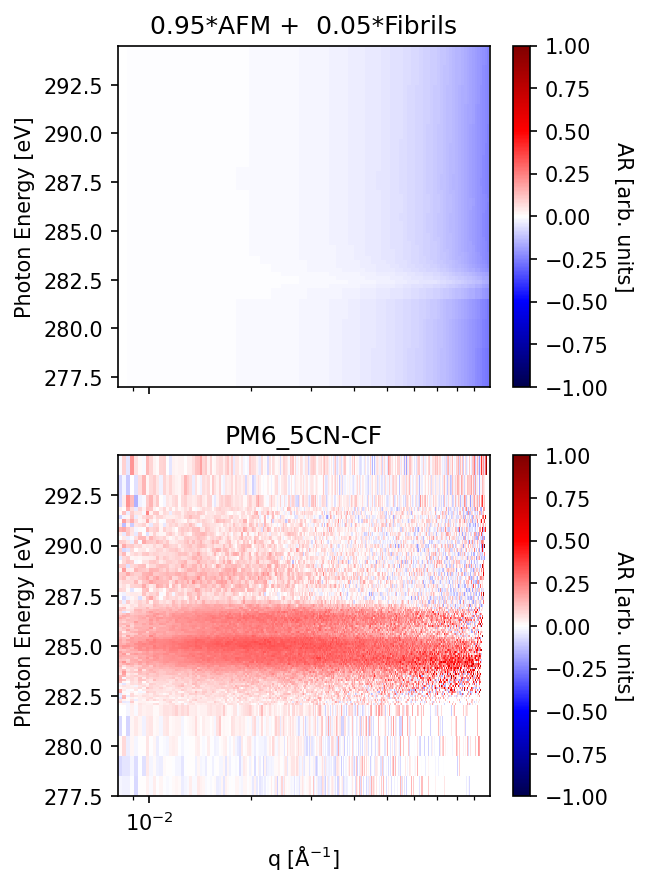

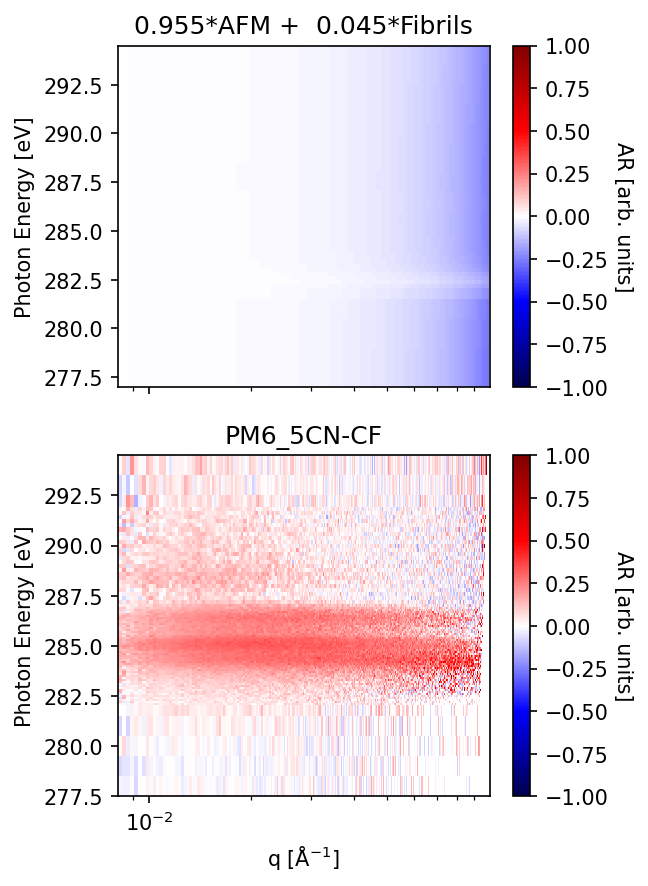

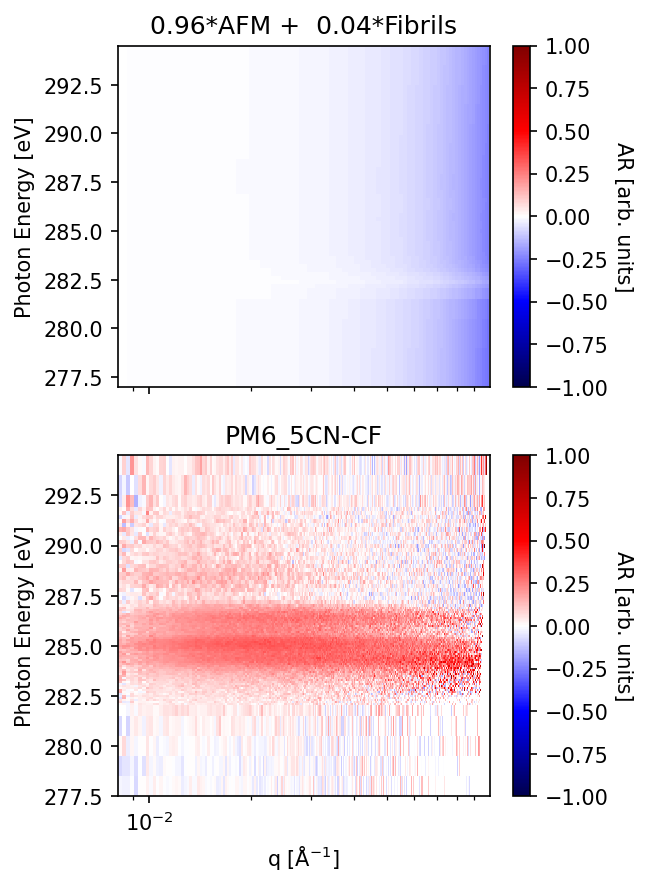

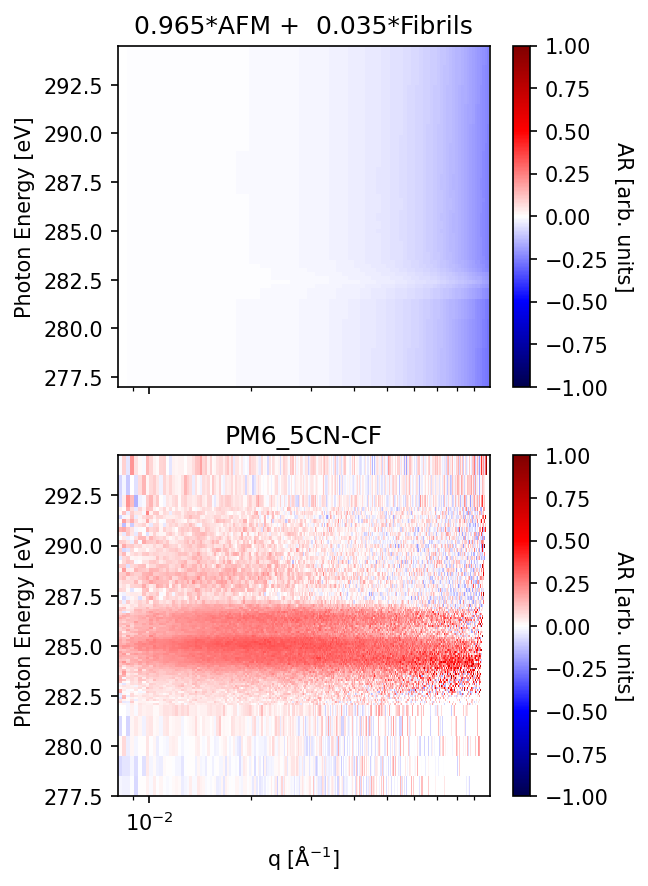

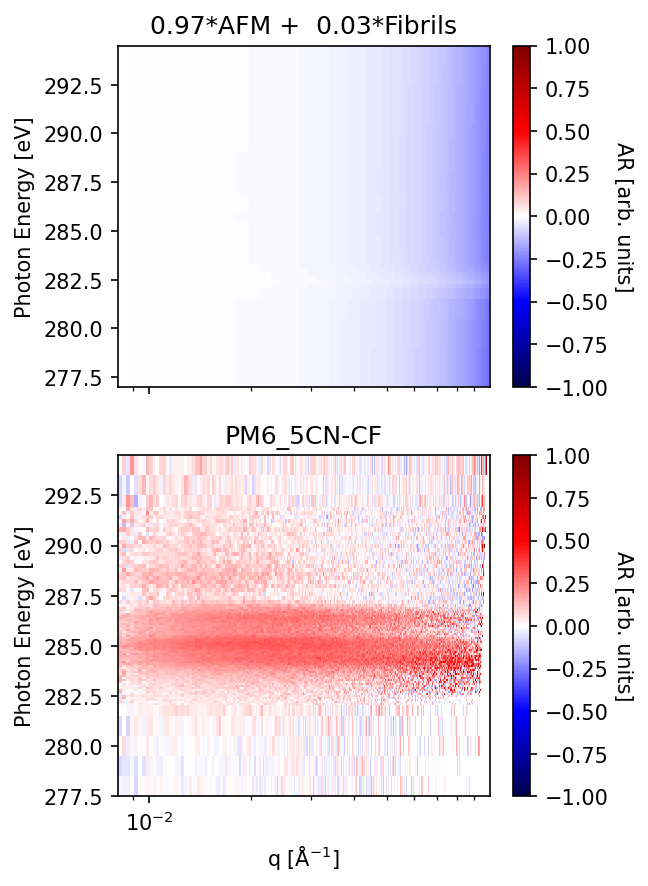


KeyboardInterrupt



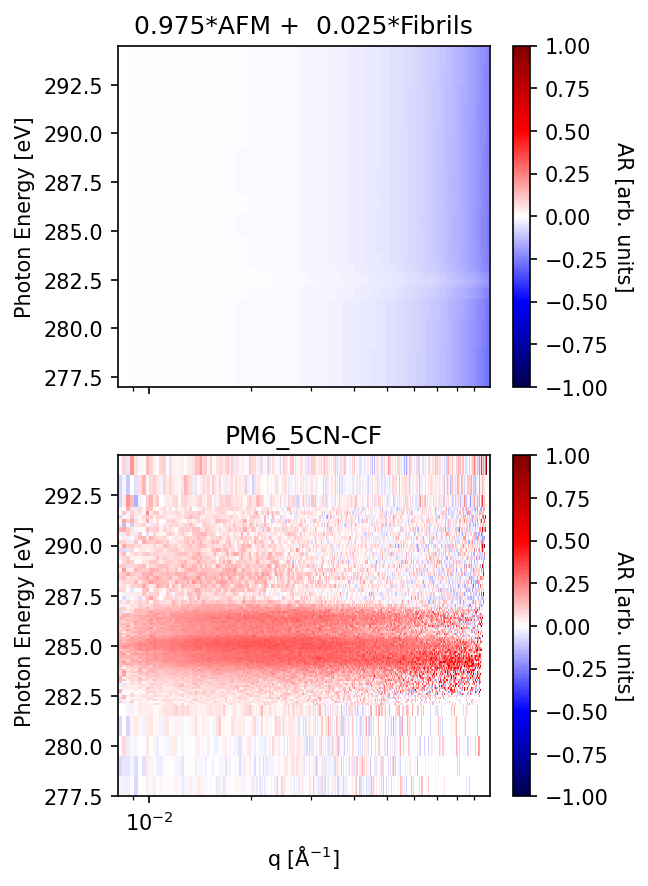

In [64]:
%matplotlib inline
plt.close('all')
# e_slice=slice(None,None)
# e_slice = slice(282, 292)

for weight in tqdm(np.arange(0.95,1.005,0.005)):
# for weight in tqdm(np.arange(0,1.1,0.1)):
# for weight in tqdm(np.arange(0,0.051,0.005).tolist() + [1]):
    fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(4, 6.5), dpi=150)

    # DA = ((weight*avg_afm_DA) + ((1-weight)*combined_DA)).compute()
    DA = ((weight*(avg_afm_DA/avg_afm_DA.max())) + ((1-weight)*(combined_DA/combined_DA.max()))).compute()

    # DA = ((weight*avg_afm_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
    # DA = ((weight*avg_hi_diam_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
    # DA = combined_DA.copy()
    sel_str = f'{np.round(weight,5)}*AFM +  {np.round(1-weight, 5)}*Fibrils'
    # sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    # save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'
    # save_str = f'{str(int(np.round((weight*100),5)))}percent_afm'
    save_str = f'{str(np.round((weight),5))}frac_afm'

    
    para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

    # Select AR data
    ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

    # Plot
    vlim = 1.0
    im = ar_DA.sel(q=q_slice, energy=e_slice).plot.pcolormesh(ax=axs[0], norm=plt.Normalize(-vlim, vlim), cmap='seismic')

    sample_name='PM6_5CN-CF'
    re_DA = re_caked_DS['corr_intensity'].sel(sample_name=sample_name)
    re_para_DA, re_perp_DA, fl_corr_DA = make_para_perp_DAs(re_DA, 0.9)
    re_ar_DA = (re_para_DA.mean('chi') - re_perp_DA.mean('chi')) / (re_para_DA.mean('chi') + re_perp_DA.mean('chi'))

    # Thresholding for bad values
    re_ar_DA = re_ar_DA.where(re_ar_DA<1)    
    re_ar_DA = re_ar_DA.where(re_ar_DA>-0.2)
    re_ar_DA.loc[{'energy':slice(None,282.5)}] = re_ar_DA.sel(energy=slice(None,282.5)).where(re_ar_DA<0.2)
    re_ar_DA.loc[{'energy':slice(None,282.5)}] = re_ar_DA.sel(energy=slice(None,282.5)).where(re_ar_DA>-0.1)
    
    re_im = re_ar_DA.sel(q=q_slice, energy=e_slice).plot.pcolormesh(ax=axs[1], norm=plt.Normalize(-vlim, vlim), cmap='seismic')

    # a.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
    axs[0].set(title=f'{sel_str}', ylabel='Photon Energy [eV]', xlabel='', xscale='log')
    axs[1].set(title=f'{sample_name}', ylabel='Photon Energy [eV]', xlabel='q [Å$^{-1}$]', xscale='log')
    im.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)
    re_im.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)

    # fig.savefig(arMapsPath.joinpath(f'{save_str}_energy{e_slice.start}-{e_slice.stop}.png'), dpi=150, bbox_inches='tight')
    fig.savefig(arMapsPath.joinpath(f'{save_str}_energy{e_slice.start}-{e_slice.stop}_{sample_name}.png'), dpi=150, bbox_inches='tight')

    plt.show()
    
    plt.close('all')

#### AR Cuts

In [ ]:
# # for weight in tqdm(np.arange(0,1.1,0.1)):
# for weight in tqdm([1]):
#     # DA = ((weight*avg_hi_diam_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
#     DA = combined_DA #.compute()
#     sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
#     save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'

#     para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     # Select AR data
#     ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

#     # Plot   
#     energies = para_DA.energy.sel(energy=[265, 275, 283, 284, 284.4, 284.8, 285.2, 285.6, 286.2, 287, 300, 340], method='nearest').data
#     cmap = plt.cm.turbo.copy()
#     colors = cmap(np.linspace(0, 1, len(energies)))        

#     fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=120)

#     for j, energy in enumerate(energies):
#         (ar_DA.sel(q=q_slice,energy=energy).plot.line(ax=ax, color=colors[j], label=energy, xscale='log'))

#     fig.suptitle(f'Anisotropy Ratio Linecuts: {data_var}', x=0.46, y=0.95)

#     ax.set(title=f'{sel_str}', ylim=(-1, 1), ylabel='AR [no units]', xlabel='Q [$Å^{-1}$]')
#     ax.grid(axis='y')
#     ax.grid(axis='x', which='both')
#     ax.legend(title='Energy [eV]', loc=(1.03,0.02))

#     # fig.savefig(arCutsPath.joinpath(f'{save_str}.png'), dpi=120)

#     plt.show()
#     plt.close('all')

#### ISIs

In [ ]:
para_DA

In [ ]:
np.isnan(para_DA).mean()

  0%|          | 0/12 [00:00<?, ?it/s]

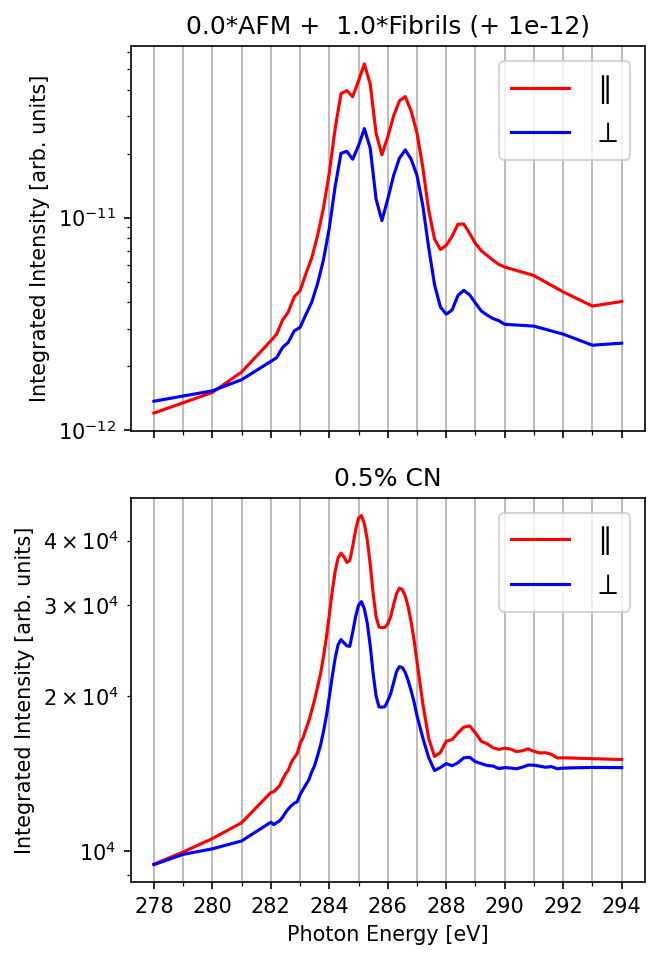

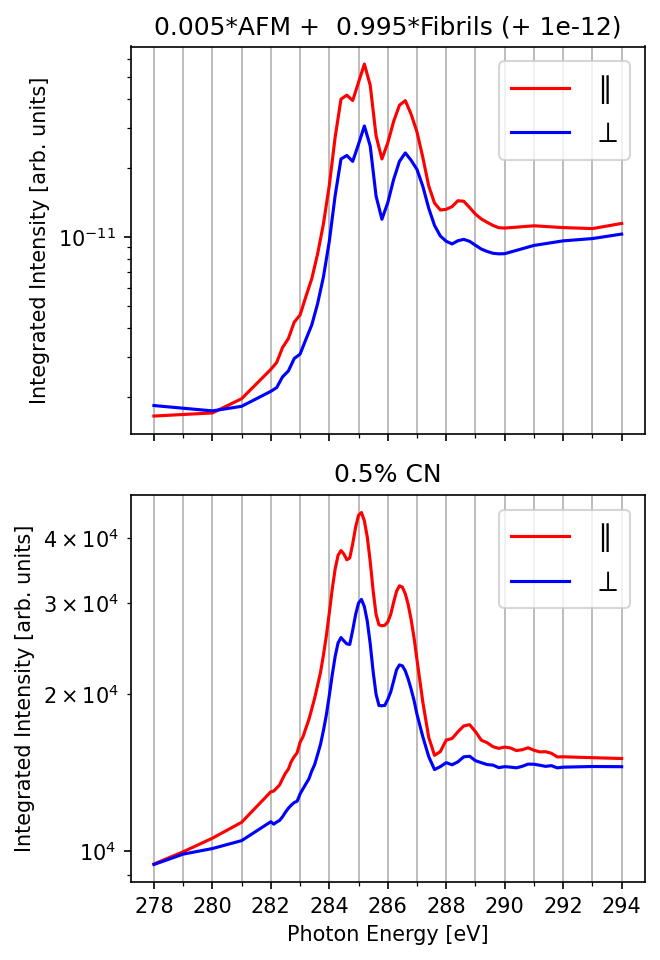

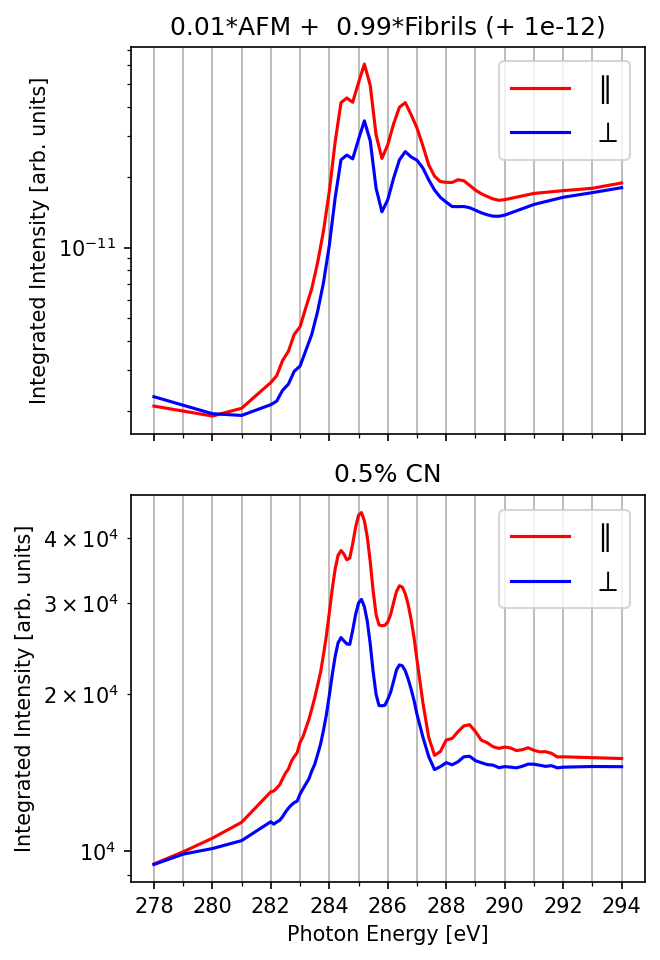

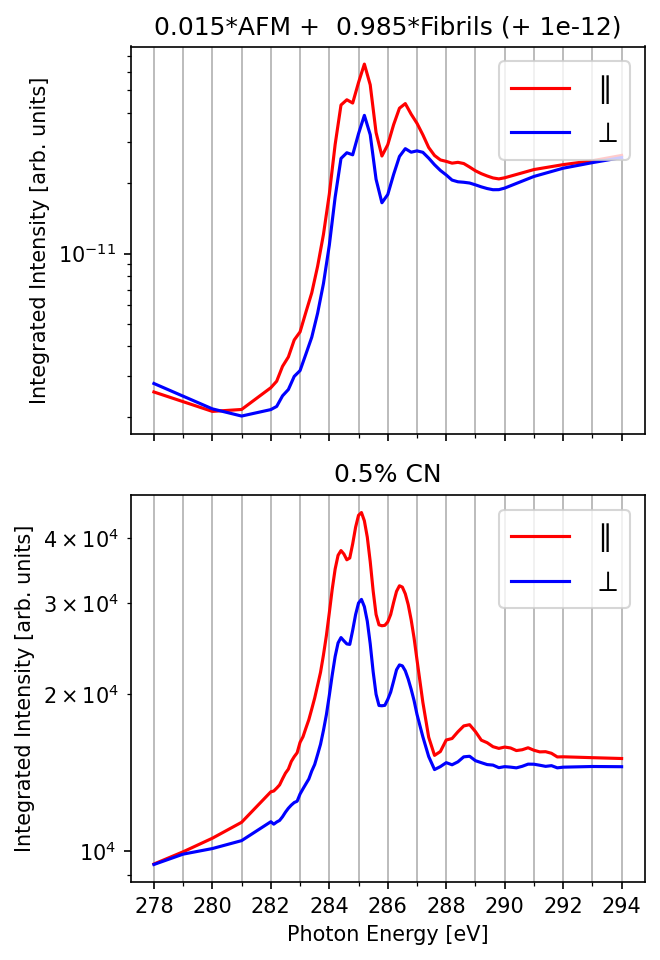

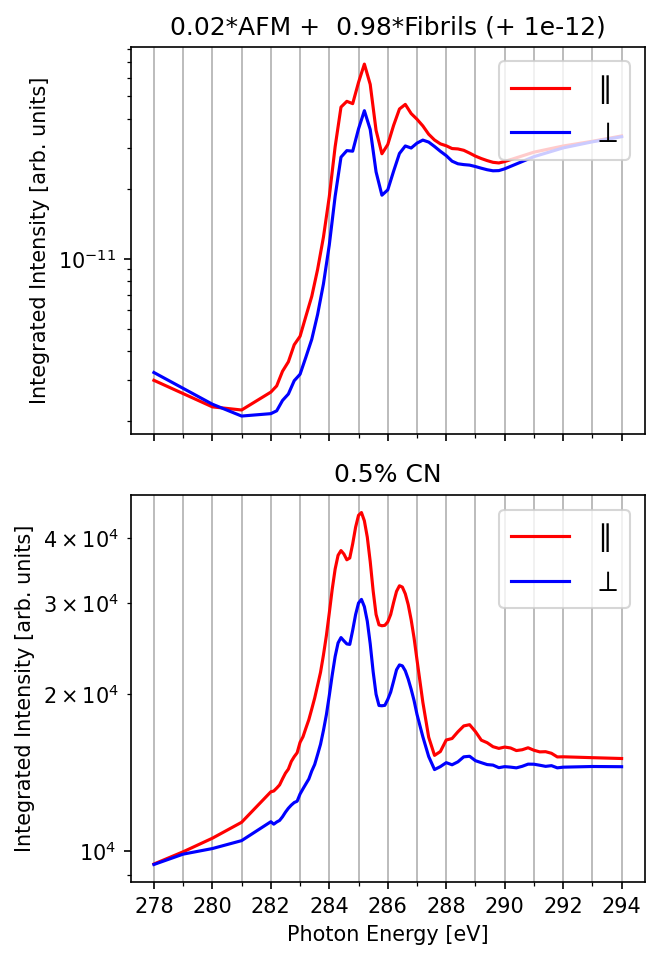

...

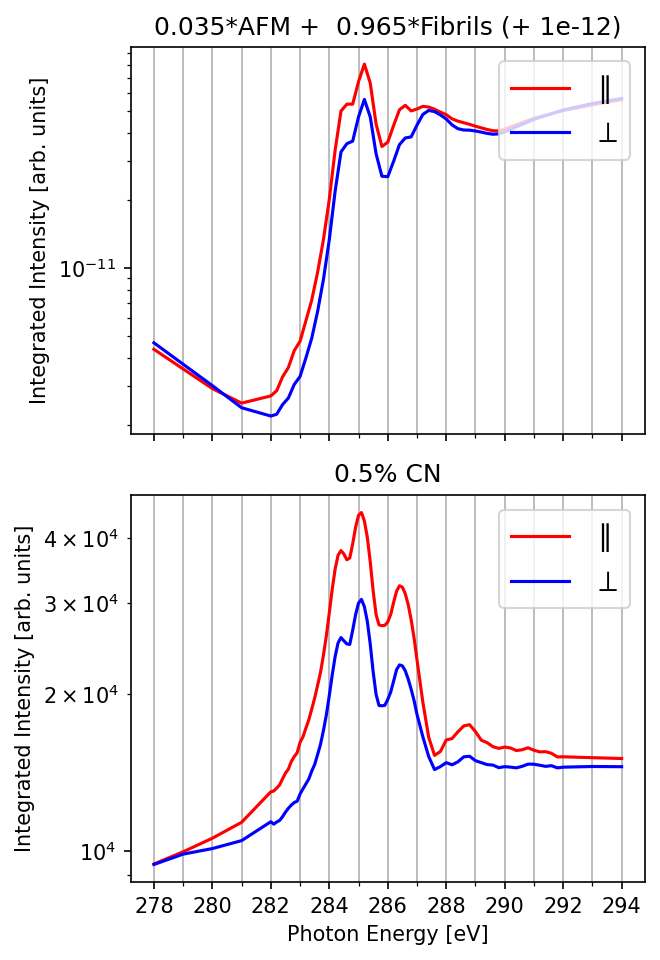

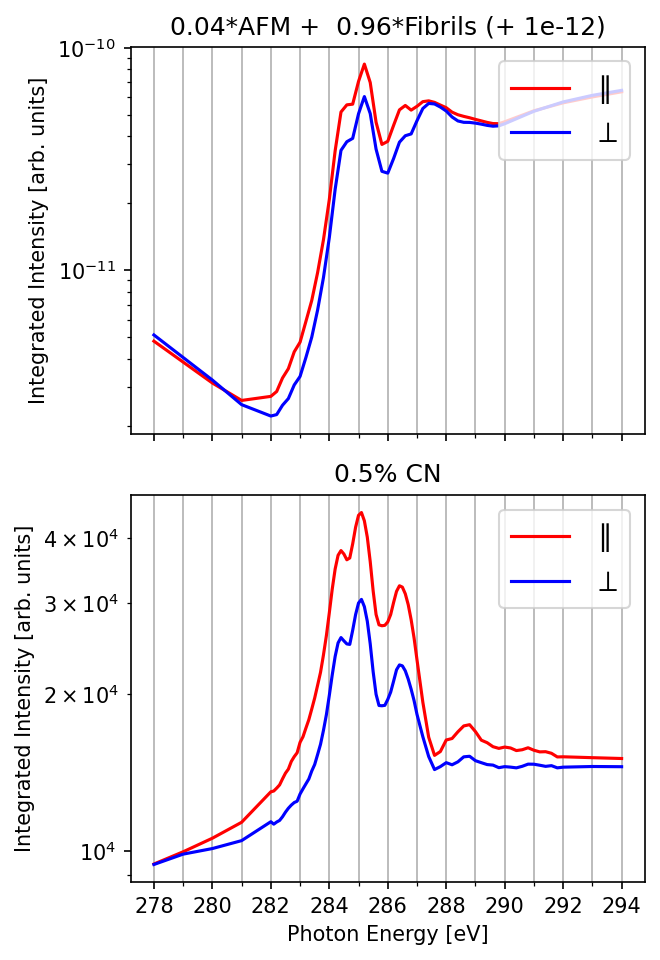

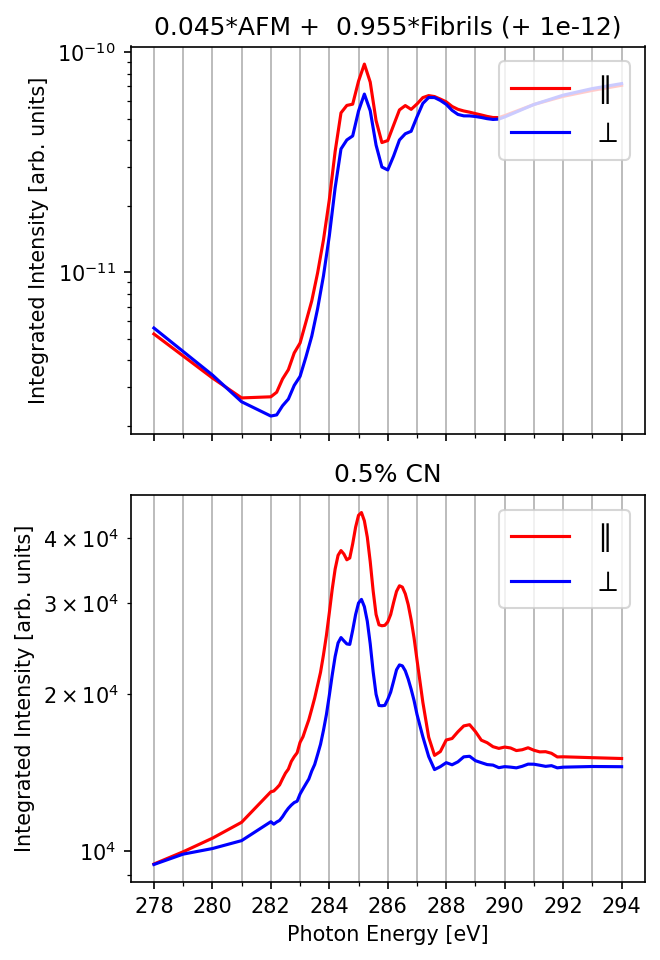

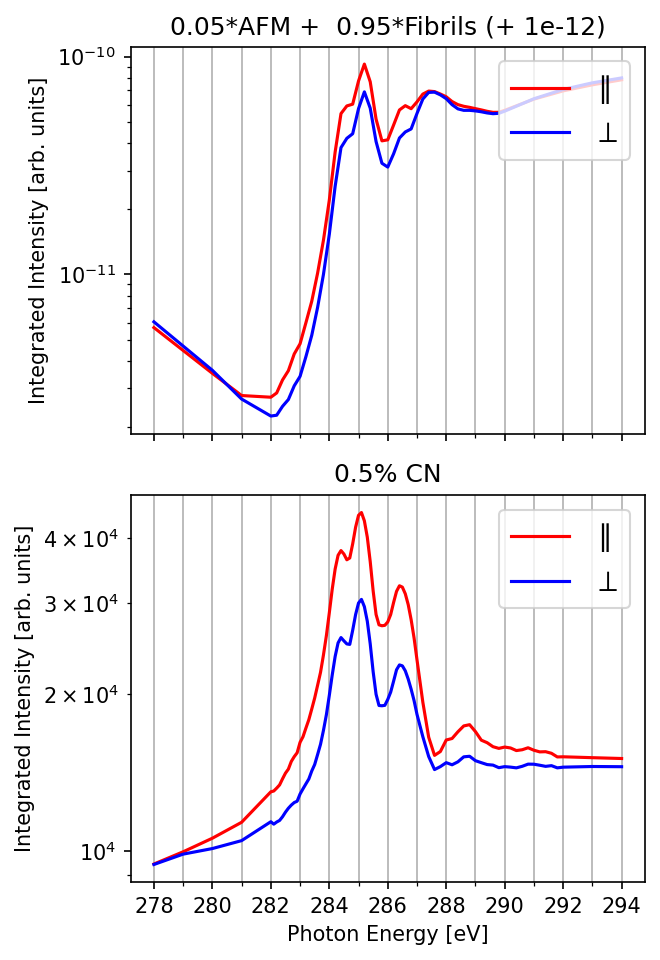

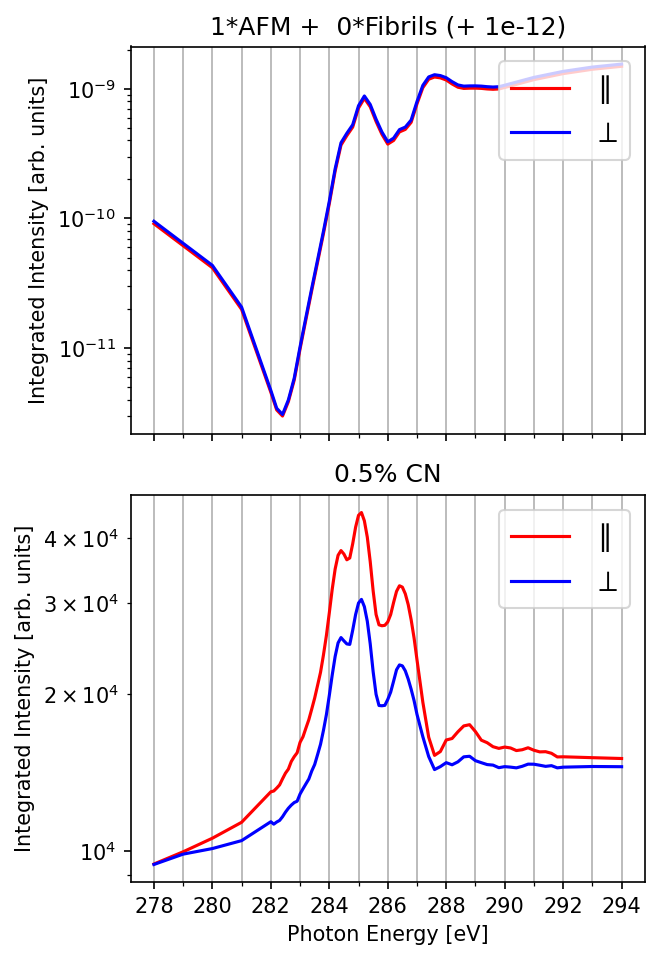

In [50]:
# e_slice=slice(None,None)
# e_slice=slice(282,294)
q_slice = slice(0.02,0.07)

# for weight in tqdm(np.arange(0,1.1,0.01)):
# for weight in tqdm(np.arange(0,1.1,0.1).tolist() + np.arange(0.95,1.005,0.005).tolist()):
for weight in tqdm(np.arange(0,0.051,0.005).tolist() + [1]):
#     DA = ((weight*avg_afm_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
# for weight in tqdm(np.arange(0,0.021,0.001).tolist() + [1]):
    DA = ((weight*(avg_afm_DA/avg_afm_DA.max())) + ((1-weight)*(combined_DA/combined_DA.max()))).compute()
#     DA = ((weight*avg_hi_diam_DA) + ((1-weight)*avg_lo_diam_DA)).compute().sel(q=q_slice)
    # DA = combined_DA.copy()
    sel_str = f'{np.round(weight,5)}*AFM +  {np.round(1-weight, 5)}*Fibrils'
    # sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    # save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'
    # save_str = f'{str(int(np.round((weight*100),5)))}percent_afm'
    save_str = f'{str(np.round((weight),5))}frac_afm'

    para_DA = DA.sel(q=q_slice).sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    perp_DA = DA.sel(q=q_slice).sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

    cy_fl_corr_DA = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * 0.9

    # slice ISI data
    offset = 1e-12
    para_ISI = para_DA.mean('chi').mean('q') + offset
    perp_ISI = perp_DA.mean('chi').mean('q') + offset

    # plot
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(4.5,6.5), dpi=150, sharex=True, tight_layout=True)
    # fig2, ax2 = plt.subplots(figsize=(4.7,3),dpi=150,tight_layout=True)

    # para_ISI = para_ISI + 2e-3
    # perp_ISI = perp_ISI + 2e-3

    para_ISI.sel(energy=e_slice).plot.line(ax=axs[0], color='r', label='$\parallel$', yscale='log')
    perp_ISI.sel(energy=e_slice).plot.line(ax=axs[0], color='b', label='$\perp$', yscale='log')

    sample_name='PM6_p5CN-CF'
    re_DA = re_caked_DS['corr_intensity'].sel(sample_name=sample_name)
    re_para_DA, re_perp_DA, fl_corr_DA = make_para_perp_DAs(re_DA, 0.9)
    re_para_ISI = np.sqrt(re_para_DA.sel(q=q_slice).mean('chi').mean('q'))
    re_perp_ISI = np.sqrt(re_perp_DA.sel(q=q_slice).mean('chi').mean('q'))    
    
    re_para_ISI.sel(energy=e_slice).plot.line(ax=axs[1], color='r', label='$\parallel$', yscale='log')
    re_perp_ISI.sel(energy=e_slice).plot.line(ax=axs[1], color='b', label='$\perp$', yscale='log')
    

    axs[0].set(title=f'{sel_str} (+ {offset})', ylabel='Integrated Intensity [arb. units]', xlabel='')
    # axs[0].set(ylim=(2e-2,None))
    axs[1].set(title=f'{sn[sample_name]}', ylabel='Integrated Intensity [arb. units]', xlabel='Photon Energy [eV]')
    
    for ax in axs:
        ax.xaxis.set_major_locator(MultipleLocator(2))
        ax.xaxis.set_minor_locator(MultipleLocator(1))
        ax.legend(loc='upper right', fontsize=14)
        ax.grid(axis='x', which='both')
        
    # para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    # perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
    
    # # slice ISI data
    # para_ISI = para_DA.sel(q=q_slice).mean('chi').mean('q')
    # perp_ISI = perp_DA.sel(q=q_slice).mean('chi').mean('q')
    
    # # plot
    # fig, ax = plt.subplots(figsize=(6,4), dpi=120)
    # ax.xaxis.set_minor_locator(MultipleLocator(1))
    
    # para_ISI.sel(energy=e_slice).plot.line(ax=ax, label='$\parallel$', yscale='log')
    # perp_ISI.sel(energy=e_slice).plot.line(ax=ax, label='$\perp$', yscale='log')
    # fig.suptitle(f'ISI: {sel_str}', fontsize=14, x=0.55)
    # ax.set(title=f'{sel_str}', 
    #        xlabel='X-ray energy [eV]', ylabel='Intensity [arb. units]')
    # ax.legend(loc='upper right', fontsize=14)
    # ax.grid(axis='x', which='both')
    # plt.subplots_adjust(top=0.86, bottom=0.2, left=0.2)
        
    # fig.savefig(ISIsPath.joinpath(f'{save_str}.png'), dpi=120)
    # fig.savefig(ISIsPath.joinpath(f'{save_str}_{offset}-offset.png'), dpi=120)
    
    plt.show()
    plt.close('all')

#### IvQ comparisons 

  0%|          | 0/22 [00:00<?, ?it/s]

64149107757.58388


  0%|          | 0/4 [00:00<?, ?it/s]

101052168505.91321


  0%|          | 0/4 [00:00<?, ?it/s]

237921037259.014


  0%|          | 0/4 [00:00<?, ?it/s]

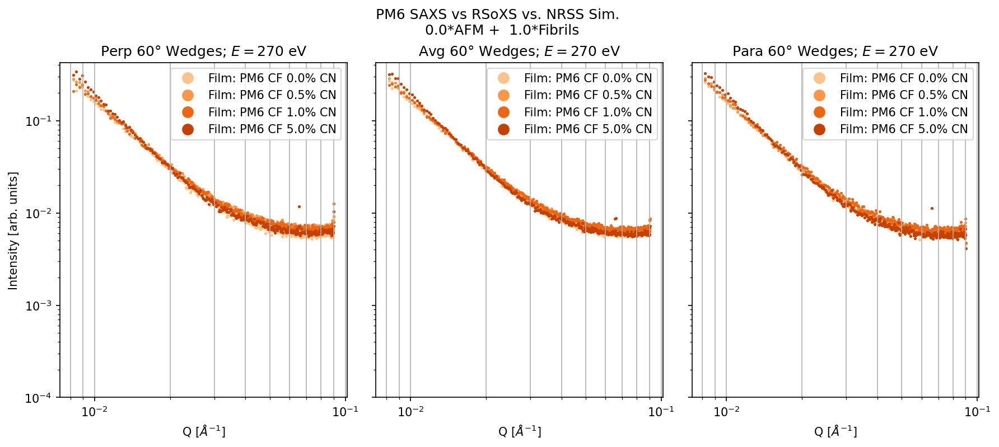

606914875.4623425


  0%|          | 0/4 [00:00<?, ?it/s]

421006031.4476624


  0%|          | 0/4 [00:00<?, ?it/s]

322284511.47268766


  0%|          | 0/4 [00:00<?, ?it/s]

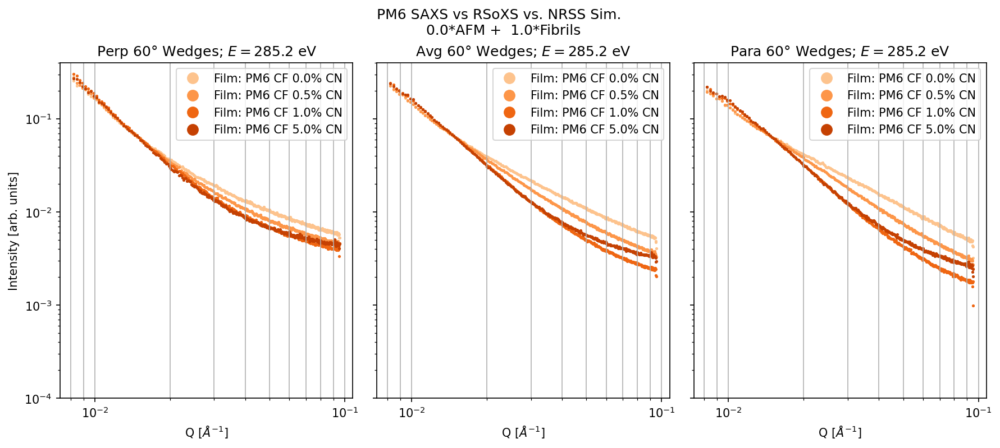

11131790358.586378


  0%|          | 0/4 [00:00<?, ?it/s]

15545232456.93361


  0%|          | 0/4 [00:00<?, ?it/s]

25757266121.195244


  0%|          | 0/4 [00:00<?, ?it/s]

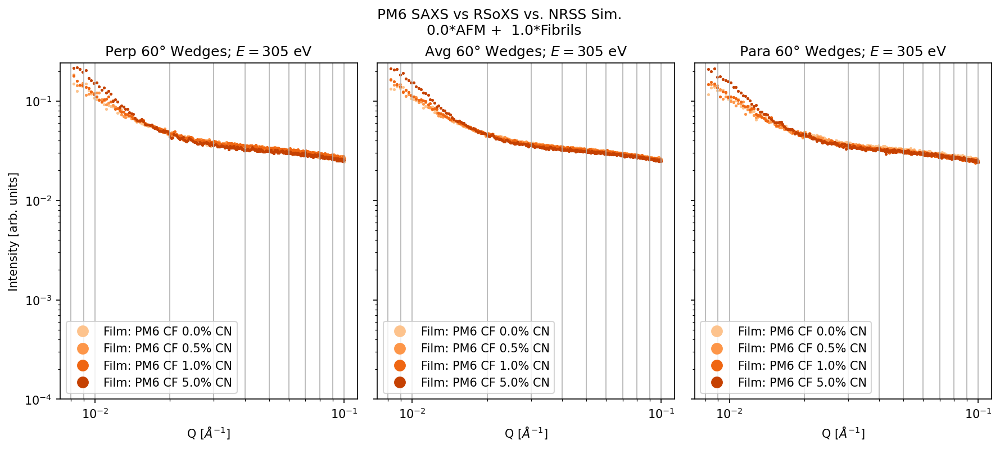

224523574.06647387


  0%|          | 0/4 [00:00<?, ?it/s]

225946766.3312409


  0%|          | 0/4 [00:00<?, ?it/s]

227388138.76926285


  0%|          | 0/4 [00:00<?, ?it/s]


KeyboardInterrupt



Error in callback <function flush_figures at 0x14acc9283520> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [58]:
%matplotlib inline
plt.close('all')

# make selection
DS = re_caked_DS.copy()

intensity_type = 'corr'
soln_mat = 'PM6'
# wedge='Perp'
chi_width = 60
q_slice = slice(0.008, 0.1)
# q_slice = slice(0.003, 0.11)
# energy = 285.2

shift_qval = 0.015  # value at which to look to shift data, divide rsoxs by this value

# saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CB', f'{soln_mat}_CN']
saxs_samples = [f'{soln_mat}_CF', f'{soln_mat}_CN']
saxs_sample_to_align = f'{soln_mat}_CN'

selected_qval = float(saxs_DS[saxs_sample_to_align].sel(q=shift_qval, method='nearest'))

# Shift all saxs to line up with selected sample qval
factor1 = selected_qval / float(saxs_DS[f'{soln_mat}_CB'].sel(q=shift_qval, method='nearest'))
factor2 = selected_qval / float(saxs_DS[f'{soln_mat}_CF'].sel(q=shift_qval, method='nearest'))
pm6_cb_shifted = saxs_DS[f'{soln_mat}_CB'] * factor1
pm6_cf_shifted = saxs_DS[f'{soln_mat}_CF'] * factor2

# saxs_colors = plt.cm.RdPu(np.linspace(0.4,1,len(saxs_samples)))
saxs_colors = plt.cm.Blues(np.linspace(0.5,1,len(saxs_samples)))

sn = {'PM6_CF': 'PM6 CF 0.0% CN',
      'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
      'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
      'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']
# selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# rsoxs_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))
rsoxs_colors = plt.cm.Oranges(np.linspace(0.3,0.8,len(selected_samples)))
# rsoxs_colors = plt.cm.Greens(np.linspace(0.3,0.8,len(selected_samples)))

# for energy in [270, 285.2, 305]:
# for data_var in tqdm(sorted(cy_caked_DS.data_vars)[39::1]):
# for weight in tqdm(np.arange(0,0.0011,0.0001).tolist() + [1]):
# for weight in tqdm((np.arange(0,0.051,0.005).tolist() + [1])[::1]):
for weight in tqdm(np.arange(0,1.1,0.1).tolist() + np.arange(0.95,1.005,0.005).tolist()):
# for weight in tqdm(np.arange(0,1.1,0.05)):
    # DA = ((weight*avg_afm_DA) + ((1-weight)*combined_DA)).compute()
    DA = ((weight*(avg_afm_DA/avg_afm_DA.max())) + ((1-weight)*(combined_DA/combined_DA.max()))).compute()
    # DA = ((weight*avg_afm_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
    cy_para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
    cy_perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
    
    # sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    sel_str = f'{np.round(weight,5)}*AFM +  {np.round(1-weight, 5)}*Fibrils'
    # save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'
    save_str = f'{str(np.round((weight),5))}frac_afm'
    
    for energy in [270, 285.2, 305]:
        fig, axs = plt.subplots(ncols=3, tight_layout=True, figsize=(12,5.5), dpi=150, sharey=True)
    
        for j, wedge in enumerate(['Perp', 'Avg', 'Para']):
        # for data_var in sorted(cy_caked_DS.data_vars)[::1]:
            # fig, ax = plt.subplots(tight_layout=True, figsize=(6,6), dpi=130)
        
            # DA = combined_DA.copy()
        
            # cy_para_DA = DA.sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
            # cy_perp_DA = DA.sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
        
            if wedge == 'Para':
                cy_DA = cy_para_DA.sel(energy=energy, method='nearest').mean('chi')
            elif wedge == 'Perp':
                cy_DA = cy_perp_DA.sel(energy=energy, method='nearest').mean('chi')
            elif wedge == 'Avg':
                cy_DA = (cy_perp_DA.mean('chi') + cy_para_DA.mean('chi')) / 2
                cy_DA = cy_DA.sel(energy=energy, method='nearest')
                
            # Shift CyRSoXS to line up with RSoXS 
            rsoxs_qval = float(cy_DA.sel(q=slice(shift_qval-0.001,shift_qval+0.001)).mean('q'))
            rsoxs_shift_factor = selected_qval / rsoxs_qval
        
            print(rsoxs_shift_factor)
            
            cy_DA = cy_DA * rsoxs_shift_factor
        
            # cy_DA.sel(q=q_slice).plot.line(ax=axs[j], color='g', label=f'Sim. RSoXS', linestyle='--', markersize=3)    
    
            # # Plot SAXS
            # pm6_cf_shifted.sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[0], label=f'Solution: {soln_mat} CF',
            #                                        linestyle='', marker='.', alpha=1, markersize=3, zorder=2)    
            # # pm6_cb_shifted.sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[1], label=f'Solution: {soln_mat} CB',
            # #                                    linestyle='', marker='.', alpha=1, markersize=3, zorder=2)   
            # saxs_DS[saxs_sample_to_align].sel(q=q_slice).plot.line(ax=axs[j], color=saxs_colors[1], label=f'Solution: {soln_mat} CN',
            #                                                       linestyle='', marker='.', alpha=1, markersize=3, zorder=1) 
            
            for i, sample_name in enumerate(tqdm(selected_samples)):
                # Plot:          
                fl_corr_frac = 0
                para_DA, perp_DA, fl_corr_DA = make_para_perp_DAs(
                    re_caked_DS[f'{intensity_type}_intensity'].sel(sample_name=sample_name), fl_corr_frac)
            
                # Shift RSoXS to line up with SAXS
                if wedge == 'Para':
                    DA = para_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
                elif wedge == 'Perp':
                    DA = perp_DA.sel(q=q_slice).sel(energy=energy, method='nearest').mean('chi')
                elif wedge == 'Avg':
                    DA = (perp_DA.mean('chi') + para_DA.mean('chi')) / 2
                    DA = DA.sel(q=q_slice).sel(energy=energy, method='nearest')
        
                    
                rsoxs_qval = float(DA.sel(q=shift_qval, method='nearest'))
                rsoxs_shift_factor = selected_qval / rsoxs_qval
                DA = DA * rsoxs_shift_factor
            
                # Plot rsoxs diff profile:
                DA.plot.line(ax=axs[j], color=rsoxs_colors[i], label=f'Film: {sn[sample_name]}', 
                             linestyle='None', marker='.', markersize=3,zorder=0)
            
            # cy_DA.sel(q=q_slice).plot.line(ax=axs[j], color='magenta', label=f'Simulated P-RSoXS', linestyle='-', linewidth=2.5, zorder=2)    
    
            axs[j].set(title=f'{wedge} {chi_width}° Wedges; $E={energy}$ eV')
    
            
            
        for ax in axs:
            ax.set(xscale='log', yscale='log', ylabel='', xlabel='Q [$Å^{-1}$]')
            ax.set(ylim=(1e-4, None), xlim=(None, None))
            ax.grid(visible=True, which='both', axis='x')
            # ax.legend(title='Sample', loc=(1.02,0.2))
            AA_str = '$Å^{-1}$'
            legend = ax.legend()
            for handle in legend.legend_handles[:]:
                handle.set_markersize(18)
    
        axs[0].set_ylabel('Intensity [arb. units]')
    
        # fig.suptitle(f'{soln_mat} SAXS vs RSoXS vs. NRSS Sim. \n Combination',y=0.96)
        fig.suptitle(f'{soln_mat} SAXS vs RSoXS vs. NRSS Sim. \n {sel_str}',y=0.96)
    
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{save_str}_{energy}eV.png'), dpi=200)
        
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}eV_experiment_only.png'), dpi=200)
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}-eV_rsoxs_only_{fl_corr_frac}-fl.png'), dpi=200)
        # fig.savefig(IvQcomparisonsPath.joinpath(f'{data_var}_{energy}eV_saxs_only.png'), dpi=200)
        
        plt.show()
        plt.close('all')

#### AvQ comparisons 

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

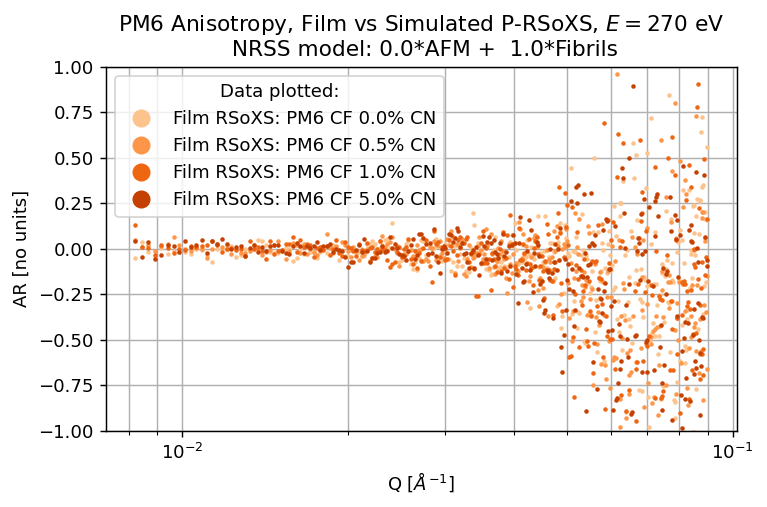

  0%|          | 0/4 [00:00<?, ?it/s]

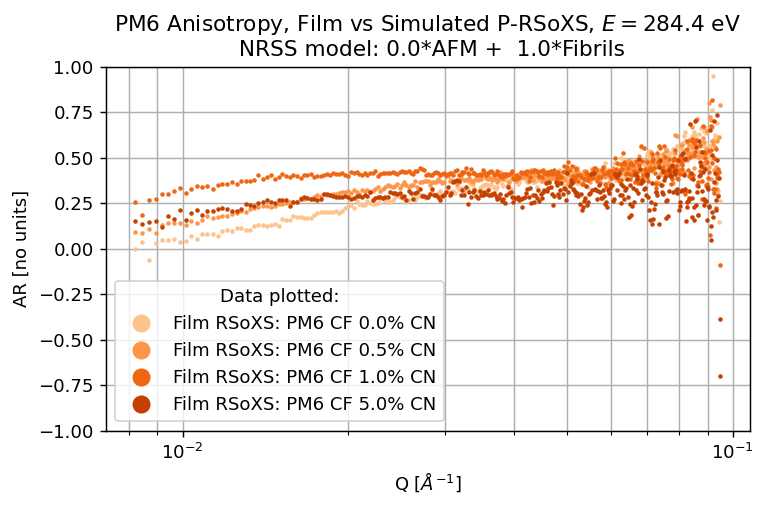

  0%|          | 0/4 [00:00<?, ?it/s]

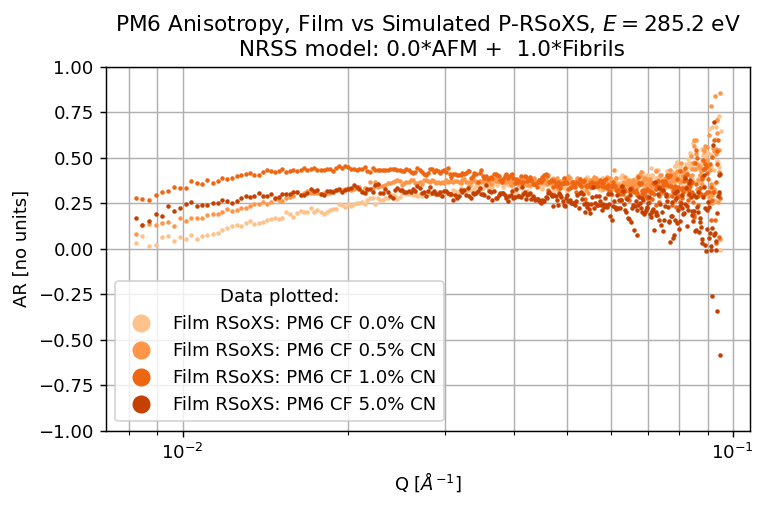

  0%|          | 0/4 [00:00<?, ?it/s]

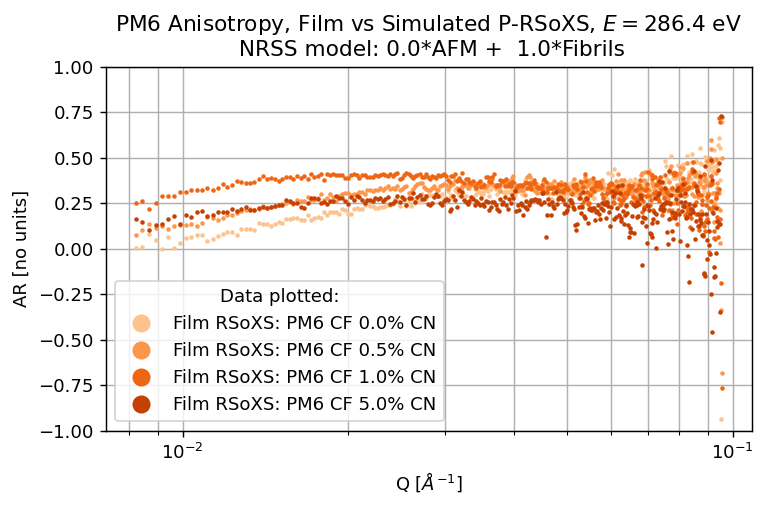

  0%|          | 0/4 [00:00<?, ?it/s]

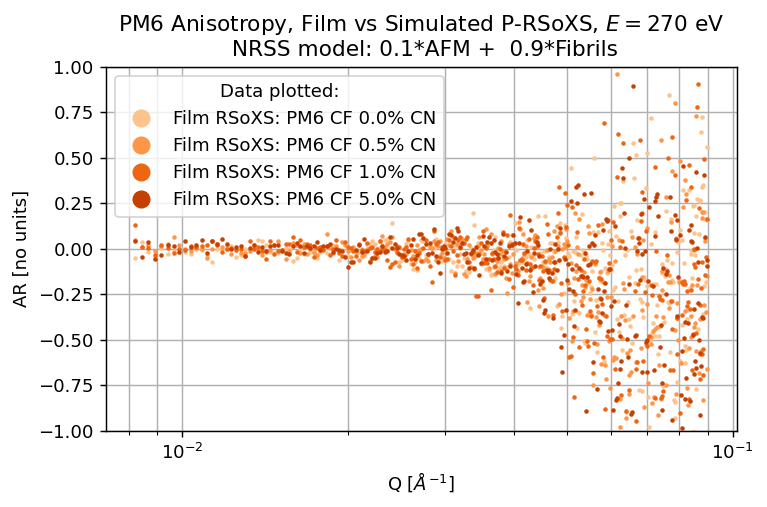

  0%|          | 0/4 [00:00<?, ?it/s]

KeyboardInterrupt: 

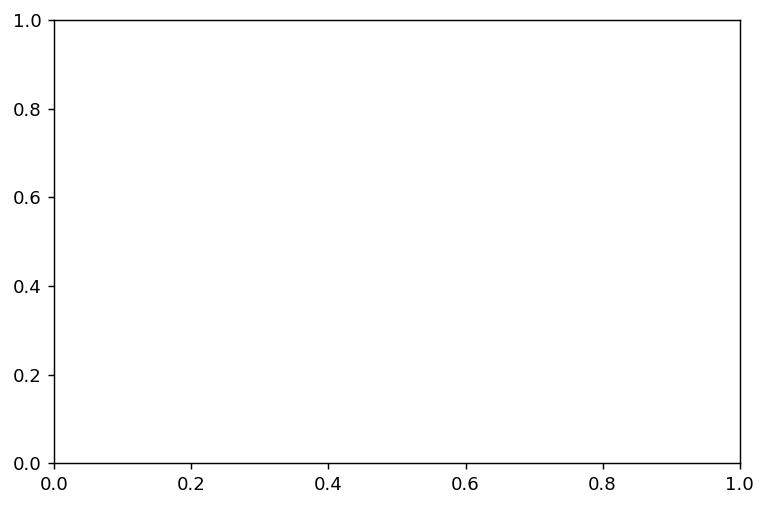

In [67]:
%matplotlib inline
plt.close('all')

# make selection
DS = re_caked_DS.copy()
intensity_type = 'corr'
soln_mat = 'PM6'

energy = 285.2
q_slice = slice(0.008, 0.1)



sn = {'PM6_CF': 'PM6 CF 0.0% CN',
      'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
      'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
      'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']

rsoxs_colors = plt.cm.Oranges(np.linspace(0.3,0.8,len(selected_samples)))

# for weight in tqdm(np.arange(0,0.0011,0.0001).tolist() + [1]):
# for weight in tqdm((np.arange(0,0.051,0.005).tolist() + [1])[::1]):
for weight in tqdm(np.arange(0,1.1,0.1).tolist() + np.arange(0.95,1.005,0.005).tolist()):
# for weight in tqdm(np.arange(0,1.1,0.05)):
    # DA = ((weight*avg_afm_DA) + ((1-weight)*combined_DA)).compute()
    sel_DA = ((weight*(avg_afm_DA/avg_afm_DA.max())) + ((1-weight)*(combined_DA/combined_DA.max()))).compute()
    
    # sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    sel_str = f'{np.round(weight,5)}*AFM +  {np.round(1-weight, 5)}*Fibrils'
    # save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'
    save_str = f'{str(np.round((weight),5))}frac_afm'
    
    for energy in [270, 284.4, 285.2, 286.4]:
        
        fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=130)
    
    
        cy_para_DA = sel_DA.compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
        cy_perp_DA = sel_DA.compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))
    
        # Select AvQ data
        cy_ar_DA = (cy_para_DA.mean('chi') - cy_perp_DA.mean('chi')) / (cy_para_DA.mean('chi') + cy_perp_DA.mean('chi'))
    
        # # Plot AvQ profile:
        # cy_ar_DA.sel(q=q_slice,energy=energy).plot.line(
        #     ax=ax, color='g', label=f'Sim RSoXS: {data_var}', linestyle='--', xscale='log')
        
        for i, sample_name in enumerate(tqdm(selected_samples)):
            fl_corr_frac = 0.9
            para_DA, perp_DA, fl_corr_DA = make_para_perp_DAs(
                re_caked_DS[f'{intensity_type}_intensity'].sel(sample_name=sample_name), fl_corr_frac)

            # Select AvQ data
            ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))
        
            # Plot AvQ profile:
            ar_DA.sel(q=q_slice,energy=energy).plot.line(
                ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
                linestyle='None', xscale='log', marker='.', markersize=3)
        
        # # Plot AvQ profile:
        # cy_ar_DA.sel(q=q_slice,energy=energy).plot.line(
        #     ax=ax, color='magenta', label=f'Simulated P-RSoXS', linestyle='-', linewidth=2.5)
        
        ax.set(title=f'{soln_mat} Anisotropy, Film vs Simulated P-RSoXS, $E={energy}$ eV \n NRSS model: {sel_str}', ylim=(-1, 1))
        ax.set(xscale='log', ylabel='AR [no units]', xlabel='Q [$Å^{-1}$]')
        ax.grid(axis='y')
        ax.grid(axis='x', which='both')    
        legend = ax.legend(title=f'Data plotted:')
        for handle in legend.legend_handles:
            handle.set_markersize(18)
    
        # fig.savefig(AvQcomparisonsPath.joinpath(f'{save_str}_{energy}_no-sim.png'), dpi=120)
        # fig.savefig(AvQcomparisonsPath.joinpath(f'{save_str}_{energy}.png'), dpi=120)
        
        plt.show()
        plt.close('all')

In [73]:
# %matplotlib inline
# plt.close('all')

# # make selection
# DS = re_caked_DS.copy()
# intensity_type = 'corr'
# soln_mat = 'PM6'

# energy = 285.2


# sn = {'PM6_CF': 'PM6 CF 0.0% CN',
#       'PM6_p5CN-CF': 'PM6 CF 0.5% CN', 
#       'PM6_1CN-CF': 'PM6 CF 1.0% CN', 
#       'PM6_5CN-CF': 'PM6 CF 5.0% CN'}

# # selected_samples = ['PM6_CF', 'PM6_p5CN-CF', 'PM6_1CN-CF', 'PM6_5CN-CF']
# selected_samples = ['PM6_CF','PM6_p5CN-CF','PM6_1CN-CF']
# # selected_samples = ['PM6_CBd', 'PM6_p5CN-CB', 'PM6_1CN-CB', 'PM6_5CN-CB']
# # selected_samples = ['PM6_CF', 'PM6_1CN-CB']

# rsoxs_colors = plt.cm.Blues(np.linspace(0.3,0.8,len(selected_samples)))

# # for weight in np.arange(0,1.1,0.1):
# #     sel_DA = ((weight*avg_hi_diam_DA) + ((1-weight)*avg_lo_diam_DA)).compute()
# for weight in tqdm([0.01]):
#     sel_DA = combined_DA.copy()
#     sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    
#     fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=130)


#     cy_para_DA = sel_DA.compute().sel(chi=slice( 0 - chi_width/2,  0 + chi_width/2))
#     cy_perp_DA = sel_DA.compute().sel(chi=slice(90 - chi_width/2, 90 + chi_width/2))

#     # Select AvQ data
#     cy_ar_DA = (cy_para_DA.mean('chi') - cy_perp_DA.mean('chi')) / (cy_para_DA.mean('chi') + cy_perp_DA.mean('chi'))

#     # Plot AvQ profile:
#     cy_ar_DA.sel(q=q_slice,energy=energy).plot.line(
#         ax=ax, color='g', label=f'Sim RSoXS: {sel_str}', linestyle='--', xscale='log')
    
#     for i, sample_name in enumerate(tqdm(selected_samples)):
#         pol_paras = []
#         pol_perps = []
#         for pol in [0, 90]:
#             # para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, intensity_type, pol, (q_slice.start,q_slice.stop), chi_width)
#             if pol == 0:
#                 para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#                 perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))
#             elif pol == 90:
#                 perp_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = (DS.chi < -180+(chi_width/2)) | (DS.chi > 180-(chi_width/2)))
#                 para_DA = DS[f'{intensity_type}_intensity'].sel(polarization=pol, sample_name=sample_name
#                                                           ).sel(chi = slice(90-(chi_width/2),90+(chi_width/2)))            
#             pol_paras.append(para_DA)
#             pol_perps.append(perp_DA)
    
    
#         pol_paras[0] = pol_paras[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_paras[1] = pol_paras[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_paras[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_perps[0] = pol_perps[0].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[0].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
#         pol_perps[1] = pol_perps[1].assign_coords({'chi': np.linspace(0, chi_width, len(pol_perps[1].chi.values))})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
#         pol_paras[0] = pol_paras[0].interp({'chi': pol_paras[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_paras[1].chi.values))})
#         pol_perps[0] = pol_perps[0].interp({'chi': pol_perps[1].chi.values})  # .assign_coords({'chi': np.linspace(0, 90,len(pol_perps[1].chi.values))})
    
#         para_DA = (pol_paras[0] + pol_paras[1])/2
#         perp_DA = (pol_perps[0] + pol_perps[1])/2
    
#         para_DA = para_DA.assign_coords({'polarization':'avg'})
#         perp_DA = perp_DA.assign_coords({'polarization':'avg'})
    
#         # para_DA = para_DA.interpolate_na(dim='q')
#         # perp_DA = perp_DA.interpolate_na(dim='q')
    
#         pol = str(para_DA.polarization.values) 
    
#         # Fl correction?
#         fl_corr = perp_DA.mean('chi').sel(q=slice(0.08,None)).mean('q') * 0.0
#         # scale_factor = float(para_DA.sel(energy=slice(285,305), q=slice(2e-2,6e-2)).mean('chi').mean('energy').integrate('q'))
#         # manual_scale_factor = manual_scale_factors_v4[sample_name]
#         # trmsn90_corr = (manual_scale_factor * scale_factor * trmsn90_bkgs_DA.sel(sample_name=sample_name))
        
#         para_DA = para_DA - fl_corr
#         perp_DA = perp_DA - fl_corr
    
#         # Select AvQ data
#         ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))
    
#         # Plot AvQ profile:
#         ar_DA.sel(q=q_slice,energy=energy).plot.line(
#             ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
#             linestyle='None', xscale='log', marker='.', markersize=3)

#         # # Plot rsoxs diff profile:
#         # DA.plot.line(ax=ax, color=rsoxs_colors[i], label=f'Film RSoXS: {sn[sample_name]}', 
#         #              linestyle='None', marker='.', markersize=3)
    

    
#     ax.set(title=f'{soln_mat} experiment and sim. P-RSoXS AvQ, $E={energy}$ eV', ylim=(-1, 1))
#     ax.set(xscale='log', ylabel='AR [no units]', xlabel='Q [$Å^{-1}$]')
#     ax.grid(axis='y')
#     ax.grid(axis='x', which='both')    
#     legend = ax.legend(title=f'Data plotted:')
#     for handle in legend.legend_handles:
#         handle.set_markersize(18)

#     fig.savefig(AvQcomparisonsPath.joinpath(f'{str(int(np.round((weight*100),0)))}percent_high_diam.png'), dpi=120)

    
#     plt.show()
#     plt.close('all')

#### Detector movies

In [ ]:
# Parameters
energy = 285.2

# for data_var in cy_recip_DS.data_vars:
#     DA = cy_recip_DS[data_var]
for weight in tqdm(np.arange(0,1.1,0.1)):
    DA = ((weight*avg_hi_diam_recip_DA) + ((1-weight)*avg_lo_diam_recip_DA)).compute()
    sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'
    
    # Make & customize plot
    sliced_DA = DA.sel(qx=slice(-q_slice.stop, q_slice.stop), qy=slice(-q_slice.stop, q_slice.stop)).sel(energy=energy, method='nearest').compute()

    cmin = float(sliced_DA.sel(qx=slice(0.01,None)).quantile(0.03))
    # cmin = 1e-4
    cmax = float(sliced_DA.sel(qx=slice(0.01,None)).quantile(1))
    
    ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), cmap=cmap, norm=LogNorm(cmin,cmax))
    ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
    ax.figure.set_tight_layout(True)   
    ax.axes.set(aspect='equal', title=f'{sel_str}', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
    ax.colorbar.set_label('Raw Intensity [arb. units]', rotation=270, labelpad=12)

    plt.show()
    plt.close('all')

In [ ]:
for weight in tqdm(np.arange(0,1.1,0.1)):
    DA = ((weight*avg_hi_diam_recip_DA) + ((1-weight)*avg_lo_diam_recip_DA)).compute()
    sel_str = f'{np.round(weight,1)}*Avg. High Diam. +  {np.round(1-weight, 1)}*Avg. Low Diam.'
    save_str = f'{str(int(np.round((weight*100),0)))}percent_high_diam'

    output_path = moviesPath.joinpath(f'{save_str}.mp4')

    # FFmpeg command. This is set up to accept data from the pipe and use it as input, with PNG format.
    # It will then output an H.264 encoded MP4 video.
    cmd = [
        '/curc/sw/ffmpeg/4.4/bin/ffmpeg',
        '-y',  # Overwrite output file if it exists
        '-f', 'image2pipe',
        '-vcodec', 'png',
        '-r', '16',  # Frame rate
        '-i', '-',  # The input comes from a pipe
        '-vcodec', 'libx264',
        '-pix_fmt', 'yuv420p',
        '-crf', '22',  # Set the quality (lower is better, 17 is often considered visually lossless)
        str(output_path)
    ]

    # Start the subprocess
    proc = subprocess.Popen(cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

    cmin, cmax = DA.sel(qx=slice(0.01,None)).sel(energy=285.2, method='nearest').quantile([0.03, 0.999])
    
    # Loop through the energy dimension and send frames to FFmpeg
    for i, energy in enumerate(tqdm(DA.energy.values, desc=f'Making the {save_str} movie')):
        # Make & customize plot
        sliced_DA = DA.sel(qx=slice(-q_slice.stop, q_slice.stop), qy=slice(-q_slice.stop, q_slice.stop)).sel(energy=energy, method='nearest').compute()
        
        ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), cmap=cmap, norm=LogNorm(cmin,cmax))
        ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
        ax.figure.set_tight_layout(True)   
        ax.axes.set(aspect='equal', title=f'{sel_str}', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
        ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=12)

        # Save first frame (or specific energy value)
        if energy == 285.2:
            ax.figure.savefig(moviesPath.joinpath(f'{save_str}.png'), dpi=120)

        buf = io.BytesIO()
        ax.figure.savefig(buf, format='png')
        buf.seek(0)

        # Write the PNG buffer data to the process
        proc.stdin.write(buf.getvalue())
        plt.close('all')

    # Finish the subprocess
    out, err = proc.communicate()
    if proc.returncode != 0:
        print(f"Error: {err}")
        
    gc.collect()  # try to clear up some memory...


## Early CyRSoXS plotting code

### 1D subplots

In [ ]:
energies = [265, 284.4, 285.2, 286.4, 315]
colors = plt.cm.plasma(np.linspace(0,0.9,len(energies)))
q_slice = slice(0.01,0.2)

    
for data_var in tqdm(sorted(cy_caked_DS.data_vars)[:]):
    sel_DA = cy_caked_DS[data_var].sel(energy=energies, method='nearest').sel(q=q_slice)

    fig = plt.figure(figsize=(16, 4))
    fig.suptitle(data_var, y=1.01)
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 1], wspace=0.3)
    
    ax0 = fig.add_subplot(gs[0])
    ax1 = fig.add_subplot(gs[1], sharey=ax0)  # sharey here
    ax2 = fig.add_subplot(gs[2])              # independent y-axis
    
    axs = [ax0, ax1, ax2]


    for color, energy in zip(colors, energies):
        sel_DA.sel(energy=energy).sel(chi=slice(-20,20)).mean('chi').plot(ax=axs[0], color=color, label=energy)
        sel_DA.sel(energy=energy).sel(chi=slice(70,110)).mean('chi').plot(ax=axs[1], color=color)
        sel_DA.rsoxs.AR(chi_width=20).sel(energy=energy).plot.line(ax=axs[2], color=color)

    axs[0].set(title='I (para) vs q', ylabel='Intensity [arb. units]', xlabel='q [Å$^{-1}$]')
    axs[1].set(title='I (perp) vs q', ylabel='Intensity [arb. units]', xlabel='q [Å$^{-1}$]')
    axs[2].set(title='A vs q', ylabel='Anisotropy Ratio [no units]', xlabel='q [Å$^{-1}$]')
    
    axs[2].set(xscale='log')
    axs[0].legend(title = 'Energy [eV]')
    
    [ax.set(xscale='log', yscale='log') for ax in [axs[0], axs[1]]]
    for ax in axs:
        ax.grid(axis='x', which='both')
        ax.grid(axis='y', which='major')

    plt.show()

    # fig.savefig(plotsPath.joinpath(f'{data_var}_IvQ_AvQ_cuts.png'), dpi=150, bbox_inches='tight')
    
    plt.close('all')

In [ ]:
# Version for data_vars to dims dataarrays

# energies = [265, 284.4, 285.2, 286.4, 315]
# colors = plt.cm.plasma(np.linspace(0,0.9,len(energies)))
# q_slice = slice(0.01,0.2)

    
# # for data_var in tqdm(sorted(cy_caked_DS.data_vars)[:]):
#     # sel_DA = cy_caked_DS[data_var].sel(energy=energies, method='nearest').sel(q=q_slice)

# for fibril_tilt in [25, 30, 35]:
#     for fibril_length in [300, 400, 500]:
#         sel_DA = cy_caked_DA.sel(fibril_tilt=fibril_tilt, fibril_length=fibril_length, q=q_slice)
    
#         # fig, axs = plt.subplots(ncols=3, figsize=(16,4))
#         # fig.set(tight_layout=True)
    
#         fig = plt.figure(figsize=(16, 4))
#         # fig.suptitle(data_var, y=1.01)
#         fig.suptitle(f'Fibril tilt: {fibril_tilt}°; Fibril length: {fibril_length} Å')
#         gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 1], wspace=0.3)
        
#         ax0 = fig.add_subplot(gs[0])
#         ax1 = fig.add_subplot(gs[1], sharey=ax0)  # sharey here
#         ax2 = fig.add_subplot(gs[2])              # independent y-axis
        
#         axs = [ax0, ax1, ax2]
    
    
#         for color, energy in zip(colors, energies):
#             sel_DA.sel(energy=energy).sel(chi=slice(-20,20)).mean('chi').plot(ax=axs[0], color=color, label=energy)
#             sel_DA.sel(energy=energy).sel(chi=slice(70,110)).mean('chi').plot(ax=axs[1], color=color)
#             sel_DA.rsoxs.AR(chi_width=20).sel(energy=energy).plot.line(ax=axs[2], color=color)
    
#         axs[0].set(title='I (para) vs q', ylabel='Intensity [arb. units]', xlabel='q [Å$^{-1}$]')
#         axs[1].set(title='I (perp) vs q', ylabel='Intensity [arb. units]', xlabel='q [Å$^{-1}$]')
#         axs[2].set(title='A vs q', ylabel='Anisotropy Ratio [no units]', xlabel='q [Å$^{-1}$]')
        
#         axs[2].set(xscale='log')
#         axs[0].legend(title = 'Energy [eV]')
        
#         [ax.set(xscale='log', yscale='log') for ax in [axs[0], axs[1]]]
#         for ax in axs:
#             ax.grid(axis='x', which='both')
#             ax.grid(axis='y', which='major')
    
#         plt.show()
    
#         # fig.savefig(plotsPath.joinpath(f'{data_var}_IvQ_AvQ_cuts.png'), dpi=150, bbox_inches='tight')
        
#         plt.close('all')

### 2D subplots

#### 2D cartesian facet plots

In [ ]:
facet_energies = cy_recip_DS.energy.data

for data_var in tqdm(sorted(cy_recip_DS.data_vars)[:]):
    sel_DA = cy_recip_DS[data_var].sel(qx=slice(-q_slice.stop, q_slice.stop), qy=slice(-q_slice.stop, q_slice.stop))
    # display(sel_DA
    cmin, cmax = sel_DA.sel(energy=285, method='nearest').sel(qx=slice(0.001, None)).quantile([0.01,0.999])
    im = sel_DA.sel(energy=facet_energies).plot.imshow(col='energy', col_wrap=4, norm=LogNorm(cmin, cmax), cmap='turbo')

    im.fig.suptitle(data_var, y=1.01, x=0.45)
    
    for i, ax in enumerate(im.axs.flatten()):
        if i % 4 == 0:
            ax.set(ylabel='$q_y$ [Å$^{-1}$]')
        if i >= 4:
            ax.set(xlabel='$q_x$ [Å$^{-1}$]')

    
    plt.show()
    
    im.fig.savefig(plotsPath.joinpath(f'{data_var}_cartesian_energy_facet.png'), dpi=120, bbox_inches='tight')

    plt.close('all')

#### IvQ & AvQ heatmaps

In [ ]:
for data_var in tqdm(sorted(cy_caked_DS.data_vars)[:]):
    sel_DA = cy_caked_DS[data_var].sel(q=q_slice)

    fig, axs = plt.subplots(ncols=3, figsize=(16,4), sharey=True)
    fig.suptitle(data_var, y=0.95, x=0.45)
    fig.set(tight_layout=True)

    # sel_DA.sel(chi=slice(-20,20)).mean('chi').plot(ax=axs[0])
    # sel_DA.sel(chi=slice(70,110)).mean('chi').plot(ax=axs[1])
    # sel_DA.rsoxs.AR(chi_width=20).plot(ax=axs[2], vmin=-1, vmax=1, cmap='seismic')

    cmin, cmax = sel_DA.sel(chi=slice(-20,20)).mean('chi').quantile([0.001, 0.999])
    im0 = sel_DA.sel(chi=slice(-20,20)).mean('chi').plot.pcolormesh(ax=axs[0], norm=LogNorm(cmin,cmax), cmap='turbo', add_colorbar=True)
    im1 = sel_DA.sel(chi=slice(70,110)).mean('chi').plot.pcolormesh(ax=axs[1], norm=LogNorm(cmin,cmax), cmap='turbo', add_colorbar=True)
    im2 = sel_DA.rsoxs.AR(chi_width=20).plot.pcolormesh(ax=axs[2], vmin=-1, vmax=1, cmap='seismic', add_colorbar=True)
    
    im0.colorbar.set_label('I (para)')   # custom label
    im1.colorbar.set_label('I (perp)')
    im2.colorbar.set_label('Anisotropy')

    for i, ax in enumerate(axs):
        ax.set(ylabel='', xlabel='$q$ [Å$^{-1}$]', xscale='log')
        if i == 0:
            ax.set(ylabel='Energy [eV]')

    
    plt.show()

    fig.savefig(plotsPath.joinpath(f'{data_var}_IvQ_AvQ_maps.png'), dpi=120, bbox_inches='tight')
    
    plt.close('all')